In [1]:
import numpy as np
from numpy import trapz
import random
import matplotlib.pyplot as plt
import scipy
from scipy.optimize import curve_fit as curve_fit
from scipy.stats import norm,binned_statistic
import scipy.integrate as integrate
from scipy.stats import norm
from astropy.io import ascii, fits
from astropy import wcs
from pymoc.util.catalog import catalog_to_moc
from scipy.stats import norm,kstest

from astropy.table import Table,vstack,Column,join
from astropy.cosmology import WMAP9 as cosmo
import astropy.units as u
from astropy.coordinates import SkyCoord,match_coordinates_sky

import emcee
import time
import corner
import herschelhelp
from matplotlib.colors import LogNorm
from lifelines import KaplanMeierFitter
from herschelhelp import image_plotting
from herschelhelp_internal.utils import inMoc,flux_to_mag
import pymoc
from pymoc.io.fits import read_moc_fits

In [294]:
def get_center(bins):
    """
    Get the central positions for an array defining bins
    """
    return (bins[:-1] + bins[1:]) / 2

In [22]:
def calistro_fit(z):
    law = 1.72*(1+z)**(-0.22)
    return(law)

In [204]:
def get_good_sed_fit_mask(catalogue,sed_fitting_code):
    #returns a mask that identifies good fits from a given results table from one of the four SED fitting codes
    #Magphys, AGNfitter, CIGALE and BAGPIPES
    '''if sed_fitting_code != ('magphys' or 'agnfitter' or 'cigale' or 'bagpipes'):
        print('catalogue not associtaed with any known sed fitter. Please provide SED fitter')
        return()'''
    #returns the magphys mask using the chi2_99_flag column which is described in Smith et al 2012
    if sed_fitting_code=='magphys':
        mask = ~(catalogue['chi2_99_flag']==1.0)
        return(mask)
    #need to write AGN fitter section
    elif sed_fitting_code=='agnfitter':
        print('agnfitter')
        mask = catalogue['goodAF'].data.data
        return(mask)
    #need to write CIGALE section
    #need to write BAGPIPES section
    else:
        print('catalogue not associtaed with any known sed fitter. Please provide SED fitter')
        return()

In [205]:
def get_best_ldust(catalogue,ldust_colnames,ldust_err_colnames,sed_fitter):
    #returns two arrays conatining ldust and the error on ldust repsectively
    #it selects the best ldust estimate for each source in the given catalogue by looping over the given 
    #ldust column names. These must be given in the order of preference 
    #i.e the first column name given is the column whose ldust will be used above all others if available
    #the error column names must be ordered the same as the ldust column names
    #
    #it also needs a list containing the name of the sed fitting code
    #currently it only accepts 'magphys','cigale','agnfitter','bagpipes'
    
    ldust = np.zeros(len(catalogue))
    ldust_err = np.zeros(len(catalogue))
    for n,name in enumerate(ldust_colnames):

        good_sources = get_good_sed_fit_mask(catalogue,sed_fitter[n])
        if n==0:
            mask = (catalogue[name]>0) & good_sources
            ldust[mask] = catalogue[name][mask]
            ldust_err[mask] = catalogue[ldust_err_colnames[n]][mask]
        else:
            mask = (ldust==0) & (catalogue[name]>0) & good_sources
            ldust[mask] = catalogue[name][mask]
            ldust_err[mask] = catalogue[ldust_err_colnames[n]][mask]
            
    return(ldust,ldust_err)

In [4]:
#Read in the LOFAR catalogue
lofar = Table.read('../lofar/deep_fields/ELAIS-N1/data/data_release/final_cross_match_catalogue-v0.5.fits')
lofar[0]

Source_Name,RA,DEC,E_RA,E_DEC,Total_flux,E_Total_flux,Peak_flux,E_Peak_flux,S_Code,Maj,Min,PA,E_Maj,E_Min,E_PA,DC_Maj,DC_Min,DC_PA,Isl_rms,FLAG_WORKFLOW,Prefilter,NoID,lr_fin,optRA,optDec,LGZ_Size,LGZ_Width,LGZ_PA,Assoc,Assoc_Qual,Art_prob,Blend_prob,Hostbroken_prob,Imagemissing_prob,Zoom_prob,Created,Position_from,Renamed_from,FLAG_OVERLAP_RADIO,flag_clean_radio,ID,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,flag_clean,ID_OPTICAL,ID_SPITZER,FLAG_OVERLAP,u_flux_corr,u_fluxerr_corr,u_mag_corr,u_magerr_corr,g_flux_corr,g_fluxerr_corr,g_mag_corr,g_magerr_corr,r_flux_corr,r_fluxerr_corr,r_mag_corr,r_magerr_corr,i_flux_corr,i_fluxerr_corr,i_mag_corr,i_magerr_corr,z_flux_corr,z_fluxerr_corr,z_mag_corr,z_magerr_corr,y_flux_corr,y_fluxerr_corr,y_mag_corr,y_magerr_corr,g_hsc_flux_corr,g_hsc_fluxerr_corr,g_hsc_mag_corr,g_hsc_magerr_corr,r_hsc_flux_corr,r_hsc_fluxerr_corr,r_hsc_mag_corr,r_hsc_magerr_corr,i_hsc_flux_corr,i_hsc_fluxerr_corr,i_hsc_mag_corr,i_hsc_magerr_corr,z_hsc_flux_corr,z_hsc_fluxerr_corr,z_hsc_mag_corr,z_hsc_magerr_corr,y_hsc_flux_corr,y_hsc_fluxerr_corr,y_hsc_mag_corr,y_hsc_magerr_corr,nb921_hsc_flux_corr,nb921_hsc_fluxerr_corr,nb921_hsc_mag_corr,nb921_hsc_magerr_corr,J_flux_corr,J_fluxerr_corr,J_mag_corr,J_magerr_corr,K_flux_corr,K_fluxerr_corr,K_mag_corr,K_magerr_corr,ch1_swire_flux_corr,ch1_swire_fluxerr_corr,ch1_swire_mag_corr,ch1_swire_magerr_corr,ch2_swire_flux_corr,ch2_swire_fluxerr_corr,ch2_swire_mag_corr,ch2_swire_magerr_corr,ch3_swire_flux_corr,ch3_swire_fluxerr_corr,ch3_swire_mag_corr,ch3_swire_magerr_corr,ch4_swire_flux_corr,ch4_swire_fluxerr_corr,ch4_swire_mag_corr,ch4_swire_magerr_corr,ch1_servs_flux_corr,ch1_servs_fluxerr_corr,ch1_servs_mag_corr,ch1_servs_magerr_corr,ch2_servs_flux_corr,ch2_servs_fluxerr_corr,ch2_servs_mag_corr,ch2_servs_magerr_corr,Separation,help_id,RA_HELP,DEC_HELP,EBV,CLASS_STAR,F_MIPS_24,FErr_MIPS_24_u,FErr_MIPS_24_l,Bkg_MIPS_24,Sig_conf_MIPS_24,Rhat_MIPS_24,n_eff_MIPS_24,Pval_res_24,flag_mips_24,F_PACS_100,FErr_PACS_100_u,FErr_PACS_100_l,F_PACS_160,FErr_PACS_160_u,FErr_PACS_160_l,Bkg_PACS_100,Bkg_PACS_160,Sig_conf_PACS_100,Sig_conf_PACS_160,Rhat_PACS_100,Rhat_PACS_160,n_eff_PACS_100,n_eff_PACS_160,Pval_res_100,Pval_res_160,flag_PACS_100,flag_PACS_160,F_SPIRE_250,FErr_SPIRE_250_u,FErr_SPIRE_250_l,F_SPIRE_350,FErr_SPIRE_350_u,FErr_SPIRE_350_l,F_SPIRE_500,FErr_SPIRE_500_u,FErr_SPIRE_500_l,Bkg_SPIRE_250,Bkg_SPIRE_350,Bkg_SPIRE_500,Sig_conf_SPIRE_250,Sig_conf_SPIRE_350,Sig_conf_SPIRE_500,Rhat_SPIRE_250,Rhat_SPIRE_350,Rhat_SPIRE_500,n_eff_SPIRE_250,n_eff_SPIRE_500,n_eff_SPIRE_350,Pval_res_250,Pval_res_350,Pval_res_500,flag_spire_250,flag_spire_350,flag_spire_500,Z_BEST,Z_BEST_SOURCE,Z_SPEC,z1_median,z1_min,z1_max,z1_area,z2_median,z2_min,z2_max,z2_area,nfilt_eazy,nfilt_atlas,nfilt_ananna,chi_r_best,chi_r_stellar,stellar_type,AGN,optAGN,IRAGN,XrayAGN,hp_idx_11,hp_depth_cluster,tot_corr_g,tot_corr_err_g,tot_corr_r,tot_corr_err_r,tot_corr_z,tot_corr_err_z,zmodel,chi_best,Mass_median,Mass_l68,Mass_u68,SFR_median,SFR_l68,SFR_u68,Nfilts,u_rest,g_rest,r_rest,i_rest,z_rest,y_rest,J_rest,K_rest,ch1_servs_rest,ch2_servs_rest,ch1_swire_rest,ch2_swire_rest,ch3_swire_rest,ch4_swire_rest
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
bytes22,float64,float64,float64,float64,float64,float64,float64,float64,bytes1,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,bytes22,bytes17,bytes22,int64,int64,int64,float32,float32,float64,float64,int64,int64,int32,int64,float64,float64,float64,float32,float64,float64,float64,float32,float64,float64,float64,float32,float64,float64,float64,float32,float64,float64,float64,float32,float64,float64,float64,float32,float64,float64,flo

In [8]:
#read in the LOFAR SED fits for EN1
magphys_en1 = Table.read('../lofar/deep_fields/ELAIS-N1/data/magphys/ELAIS_N1_lowzmagphys_20200219.fits')
#cigale_en1 = Table.read('')
#need to write some code to change the units of ldust to watts here so the merged ldust catatlogue
#has consistent units in all teh ldust cols
magphys_cols = ['galaxy_id','Ldust_best','Ldust_sigma','Ldust_bayes','Ldust_03','Ldust_16','Ldust_50','Ldust_84','Ldust_98','chi2','chi2_99_flag']
magphys_ldust = magphys_en1[magphys_cols]
magphys_ldust.rename_column('galaxy_id','Source_Name')

for cat in [magphys_ldust]:
    for n,name in enumerate(magphys_cols):
        if n==0:
            continue
        cat[name] = cat[name]*3.8*10**26

magphys_ldust[0]

Source_Name,Ldust_best,Ldust_sigma,Ldust_bayes,Ldust_03,Ldust_16,Ldust_50,Ldust_84,Ldust_98,chi2,chi2_99_flag
bytes30,object,object,object,object,object,object,object,object,object,object
ILTJ161340.59+535110.1,2.1576399034777602e+40,4.8886320201728e+39,2.52396722716672e+40,1.7369351061504e+40,2.04072082735104e+40,2.51063504470016e+40,3.01844697972736e+40,3.4656409878528e+40,4.0283798217773437e+27,0.0


In [126]:
#read in the AGNfitter results
agnfitter_en1 = Table.read('../lofar/deep_fields/ELAIS-N1/data/agnfitter/EN1_agnfitter_out_calc.v1.fits')

agnfitter_cols = ['Source_Name','LIR_8_1000_med','LIR_8_1000_p16','LIR_8_1000_p84','LIR_8_1000_ml','LIR','LIR_em','LIR_ep','logL150','goodAF','ln_l','q150']
agnfitter_ldust = agnfitter_en1[agnfitter_cols]


In [127]:
#join the SED catalogues with the LOFAR table

SED_tables = [magphys_ldust,agnfitter_ldust]
print('lofar table has {} sources'.format(len(lofar)))
for n,catalogue in enumerate(SED_tables):
    if n==0:
        lofar_sed = join(lofar,catalogue,keys='Source_Name',join_type='outer')
        print('new joined table has {} sources'.format(len(lofar_sed)))
    else:
        lofar_sed = join(lofar_sed,catalogue,keys='Source_Name',join_type='outer')
        print('new joined table has {} sources'.format(len(lofar_sed)))
    
lofar_sed[0]

lofar table has 31645 sources
new joined table has 31645 sources


new joined table has 31645 sources


Source_Name,RA,DEC,E_RA,E_DEC,Total_flux,E_Total_flux,Peak_flux,E_Peak_flux,S_Code,Maj,Min,PA,E_Maj,E_Min,E_PA,DC_Maj,DC_Min,DC_PA,Isl_rms,FLAG_WORKFLOW,Prefilter,NoID,lr_fin,optRA,optDec,LGZ_Size,LGZ_Width,LGZ_PA,Assoc,Assoc_Qual,Art_prob,Blend_prob,Hostbroken_prob,Imagemissing_prob,Zoom_prob,Created,Position_from,Renamed_from,FLAG_OVERLAP_RADIO,flag_clean_radio,ID,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,flag_clean,ID_OPTICAL,ID_SPITZER,FLAG_OVERLAP,u_flux_corr,u_fluxerr_corr,u_mag_corr,u_magerr_corr,g_flux_corr,g_fluxerr_corr,g_mag_corr,g_magerr_corr,r_flux_corr,r_fluxerr_corr,r_mag_corr,r_magerr_corr,i_flux_corr,i_fluxerr_corr,i_mag_corr,i_magerr_corr,z_flux_corr,z_fluxerr_corr,z_mag_corr,z_magerr_corr,y_flux_corr,y_fluxerr_corr,y_mag_corr,y_magerr_corr,g_hsc_flux_corr,g_hsc_fluxerr_corr,g_hsc_mag_corr,g_hsc_magerr_corr,r_hsc_flux_corr,r_hsc_fluxerr_corr,r_hsc_mag_corr,r_hsc_magerr_corr,i_hsc_flux_corr,i_hsc_fluxerr_corr,i_hsc_mag_corr,i_hsc_magerr_corr,z_hsc_flux_corr,z_hsc_fluxerr_corr,z_hsc_mag_corr,z_hsc_magerr_corr,y_hsc_flux_corr,y_hsc_fluxerr_corr,y_hsc_mag_corr,y_hsc_magerr_corr,nb921_hsc_flux_corr,nb921_hsc_fluxerr_corr,nb921_hsc_mag_corr,nb921_hsc_magerr_corr,J_flux_corr,J_fluxerr_corr,J_mag_corr,J_magerr_corr,K_flux_corr,K_fluxerr_corr,K_mag_corr,K_magerr_corr,ch1_swire_flux_corr,ch1_swire_fluxerr_corr,ch1_swire_mag_corr,ch1_swire_magerr_corr,ch2_swire_flux_corr,ch2_swire_fluxerr_corr,ch2_swire_mag_corr,ch2_swire_magerr_corr,ch3_swire_flux_corr,ch3_swire_fluxerr_corr,ch3_swire_mag_corr,ch3_swire_magerr_corr,ch4_swire_flux_corr,ch4_swire_fluxerr_corr,ch4_swire_mag_corr,ch4_swire_magerr_corr,ch1_servs_flux_corr,ch1_servs_fluxerr_corr,ch1_servs_mag_corr,ch1_servs_magerr_corr,ch2_servs_flux_corr,ch2_servs_fluxerr_corr,ch2_servs_mag_corr,ch2_servs_magerr_corr,Separation,help_id,RA_HELP,DEC_HELP,EBV,CLASS_STAR,F_MIPS_24,FErr_MIPS_24_u,FErr_MIPS_24_l,Bkg_MIPS_24,Sig_conf_MIPS_24,Rhat_MIPS_24,n_eff_MIPS_24,Pval_res_24,flag_mips_24,F_PACS_100,FErr_PACS_100_u,FErr_PACS_100_l,F_PACS_160,FErr_PACS_160_u,FErr_PACS_160_l,Bkg_PACS_100,Bkg_PACS_160,Sig_conf_PACS_100,Sig_conf_PACS_160,Rhat_PACS_100,Rhat_PACS_160,n_eff_PACS_100,n_eff_PACS_160,Pval_res_100,Pval_res_160,flag_PACS_100,flag_PACS_160,F_SPIRE_250,FErr_SPIRE_250_u,FErr_SPIRE_250_l,F_SPIRE_350,FErr_SPIRE_350_u,FErr_SPIRE_350_l,F_SPIRE_500,FErr_SPIRE_500_u,FErr_SPIRE_500_l,Bkg_SPIRE_250,Bkg_SPIRE_350,Bkg_SPIRE_500,Sig_conf_SPIRE_250,Sig_conf_SPIRE_350,Sig_conf_SPIRE_500,Rhat_SPIRE_250,Rhat_SPIRE_350,Rhat_SPIRE_500,n_eff_SPIRE_250,n_eff_SPIRE_500,n_eff_SPIRE_350,Pval_res_250,Pval_res_350,Pval_res_500,flag_spire_250,flag_spire_350,flag_spire_500,Z_BEST,Z_BEST_SOURCE,Z_SPEC,z1_median,z1_min,z1_max,z1_area,z2_median,z2_min,z2_max,z2_area,nfilt_eazy,nfilt_atlas,nfilt_ananna,chi_r_best,chi_r_stellar,stellar_type,AGN,optAGN,IRAGN,XrayAGN,hp_idx_11,hp_depth_cluster,tot_corr_g,tot_corr_err_g,tot_corr_r,tot_corr_err_r,tot_corr_z,tot_corr_err_z,zmodel,chi_best,Mass_median,Mass_l68,Mass_u68,SFR_median,SFR_l68,SFR_u68,Nfilts,u_rest,g_rest,r_rest,i_rest,z_rest,y_rest,J_rest,K_rest,ch1_servs_rest,ch2_servs_rest,ch1_swire_rest,ch2_swire_rest,ch3_swire_rest,ch4_swire_rest,Ldust_best,Ldust_sigma,Ldust_bayes,Ldust_03,Ldust_16,Ldust_50,Ldust_84,Ldust_98,chi2,chi2_99_flag,LIR_8_1000_med,LIR_8_1000_p16,LIR_8_1000_p84,LIR_8_1000_ml,LIR,LIR_em,LIR_ep,logL150,goodAF,ln_l,q150
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
bytes30,float64,float64,float64,float64,float64,float64,float64,float64,bytes1,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,bytes22,bytes17,bytes22,int64,int64,int64,float32,float32,float64,float64,int64,int64,in

In [10]:
#Read in the LOFAR and HERschel maps
fname = '../lofar/deep_fields/ELAIS-N1/data/data_release/radio_image.fits'
hdulist = fits.open(fname)
radim_header = hdulist[0].header
radim_wcs = wcs.WCS(radim_header).celestial
radim_data = hdulist[0].data[0][0]
hdulist.close()

fname = '../lofar/deep_fields/ELAIS-N1/data/data_release/radio_rms_image.fits'
hdulist = fits.open(fname)
radim_header = hdulist[0].header
radim_wcs_err = wcs.WCS(radim_header).celestial
radim_err = hdulist[0].data[0][0]
hdulist.close()

#Read in the spire maps
imfolder='../../../HELP/dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/'
pswfits=imfolder+'ELAIS-N1_SPIRE250_v1.0.fits'
hdulist = fits.open(pswfits)
im250phdu=hdulist[0].header
im250hdu=hdulist['image'].header

im250=hdulist['image'].data*1.0E3 #convert to mJy
w_250 = wcs.WCS(hdulist['image'].header)
hdulist.close()

imfolder='../../../HELP/dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/'
pswfits=imfolder+'ELAIS-N1_SPIRE350_v1.0.fits'
hdulist = fits.open(pswfits)
im350phdu=hdulist[0].header
im350hdu=hdulist['image'].header

im350=hdulist['image'].data*1.0E3 #convert to mJy
w_350 = wcs.WCS(hdulist['image'].header)
hdulist.close()

imfolder='../../../HELP/dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/'
pswfits=imfolder+'ELAIS-N1_SPIRE500_v1.0.fits'
hdulist = fits.open(pswfits)
im500phdu=hdulist[0].header
im500hdu=hdulist['image'].header

im500=hdulist['image'].data*1.0E3 #convert to mJy
w_500 = wcs.WCS(hdulist['image'].header)
hdulist.close()

In [11]:
#Read in the FIR luminosities for the additional HELP objects from CIGALE
cigale_HELP_input = Table.read('../lofar/deep_fields/ELAIS-N1/cigale/ldust/cigale_input.fits')
cigale_HELP_results = Table.read('../lofar/deep_fields/ELAIS-N1/cigale/ldust/results.fits')
help_masterlist = Table.read('../../../HELP/dmu_products/dmu32/dmu32_ELAIS-N1/data/ELAIS-N1_20171020.fits')
colnames = ['help_id','redshift']
help_masterlist_reduced = help_masterlist[colnames]
help_masterlist_reduced.rename_column('help_id','id')
joined_cigale_HELP = join(cigale_HELP_input,cigale_HELP_results,keys='id',join_type='inner')
joined_cigale_HELP = join(joined_cigale_HELP,help_masterlist_reduced,keys='id',join_type='inner')

#remove HELP sources associated to LOFAR objects
mask = np.array([name in lofar['help_id'] for name in joined_cigale_HELP['id']])
joined_cigale_HELP = joined_cigale_HELP[~mask]
joined_cigale_HELP[0]

id,field,ra,dec,redshift_1,pacs_green,pacs_green_err,flag_pacs_green,pacs_red,pacs_red_err,flag_pacs_red,spire_250,spire_250_err,flag_spire_250,spire_350,spire_350_err,flag_spire_350,spire_500,spire_500_err,flag_spire_500,bayes.dust.luminosity,bayes.dust.luminosity_err,bayes.universe.redshift,bayes.universe.redshift_err,best.chi_square,best.reduced_chi_square,best.attenuation.Av_BC,best.attenuation.BC_to_ISM_factor,best.attenuation.bessell_b,best.attenuation.galex_fuv,best.attenuation.slope_BC,best.attenuation.slope_ISM,best.attenuation.stellar.old,best.attenuation.stellar.young,best.dust.alpha,best.dust.gamma,best.dust.luminosity,best.dust.mass,best.dust.qpah,best.dust.umin,best.lyc_absorption_f_dust,best.lyc_absorption_f_esc,best.sfh.age,best.sfh.burst_age,best.sfh.f_burst,best.sfh.integrated,best.sfh.sfr,best.sfh.sfr100Myrs,best.sfh.sfr10Myrs,best.sfh.tau_burst,best.sfh.tau_main,best.stellar.age_m_star,best.stellar.imf,best.stellar.lum_ly,best.stellar.lum_ly_old,best.stellar.lum_ly_young,best.stellar.m_gas,best.stellar.m_gas_old,best.stellar.m_gas_young,best.stellar.m_star,best.stellar.m_star_old,best.stellar.m_star_young,best.stellar.metallicity,best.stellar.n_ly,best.stellar.n_ly_old,best.stellar.n_ly_young,best.stellar.old_young_separation_age,best.universe.age,best.universe.luminosity_distance,best.universe.redshift,best.pacs_green,best.pacs_red,best.spire_250,best.spire_350,best.spire_500,redshift_2
,,deg,deg,,mJy,,,mJy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,mJy,mJy,mJy,mJy,mJy,
bytes1728,bytes18,float64,float64,float64,float32,float32,bool,float32,float32,bool,float64,float64,bool,float64,float64,bool,float64,float64,bool,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
HELP_J155620.810+545113.308,ELAIS-N1,239.086706815057,54.8536967354993,nan,nan,nan,False,nan,nan,False,20.906187,3.980425000000003,True,26.584743,4.480207000000002,True,28.536203,5.316896000000001,True,3.332098334866379e+39,1.876727810546632e+39,2.9135156893911605,0.7484849038046447,0.19156885148821887,0.09578442574410943,0.5,0.8,0.5634245423743864,1.5353171722901084,-0.7,-0.7,7.838460846971918e+38,1.2125123514699113e+39,2.0,0.02,1.996358436167103e+39,1.090006422740487e+40,0.47,5.0,0.0,0.0,2500.0,110.0,0.001,1246975411635.9436,751.4025551407252,748.8181758364088,751.1834145760563,10000.0,3000.0,907.8319250157256,1.0,3.0584107963961856e+38,1.8577192083443498e+36,3.039833604312742e+38,463429135735.3472,462941201159.1479,487934576.19932723,783546270833.41,776522376331.0354,7023894502.374597,0.02,9.364763774999625e+55,5.583141697502604e+53,9.308932358024598e+55,10.0,2684.050487706931,6.416369203751266e+26,2.496240601503759,2.270951344240879,7.446068707041178,20.086971188290068,28.313945129474725,27.211497353061183,0.6999


/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


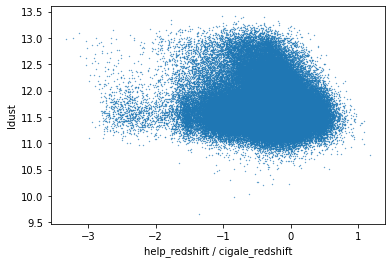

In [12]:
x = np.log10(joined_cigale_HELP['redshift_2']/joined_cigale_HELP['bayes.universe.redshift'])
y = np.log10(joined_cigale_HELP['bayes.dust.luminosity']/3.8E26)

plt.scatter(x,y,s=0.1)
plt.xlabel('help_redshift / cigale_redshift')
plt.ylabel('ldust')
plt.show()

/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()


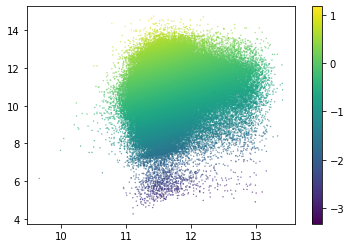

In [13]:
ldust_cig = joined_cigale_HELP['bayes.dust.luminosity']
z = joined_cigale_HELP['bayes.universe.redshift']
dist = cosmo.luminosity_distance(z).to(u.m).value
fdust_cig = ldust_cig / (dist**2 * 4 * np.pi * (1+z) )

z = joined_cigale_HELP['redshift_2']
dist = cosmo.luminosity_distance(z).to(u.m).value
ldust_photz = fdust_cig * (dist**2 * 4 * np.pi * (1+z) )


x = np.log10(ldust_cig/3.8E26)
y = np.log10(ldust_photz/3.8E26)
c = np.log10(joined_cigale_HELP['redshift_2']/joined_cigale_HELP['bayes.universe.redshift'])
plt.scatter(x,y,s=0.1,c=c)
plt.colorbar()
plt.show()

In [14]:
stellar_mass_cat = Table.read('../lofar/deep_fields/ELAIS-N1/data/EN1_opt_spitzer_merged_vac_opt3as_irac4as_all_hpx_masses_public.fits')
stellar_mass_cat.rename_column('help_id','id')
joined_test = join(joined_cigale_HELP,stellar_mass_cat,join_type='outer',keys='id')

/mnt/pact/im281/HELP/herschelhelp_internal/herschelhelp_internal/utils.py:77: RuntimeWarning: invalid value encountered in log10
  magnitudes = 2.5 * (23 - np.log10(fluxes)) - 48.6
/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in less
  del sys.path[0]


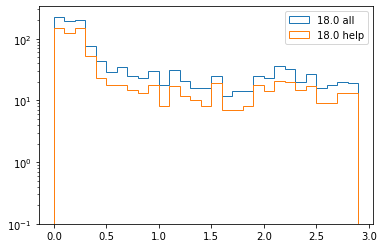

for sources brighter than 18.0 mag 22.898453261600537% of sources have a prior list counterpart


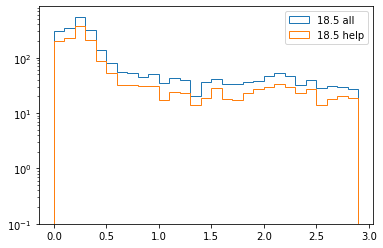

for sources brighter than 18.5 mag 26.94886839899413% of sources have a prior list counterpart


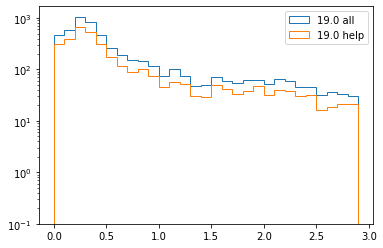

for sources brighter than 19.0 mag 30.24390243902439% of sources have a prior list counterpart


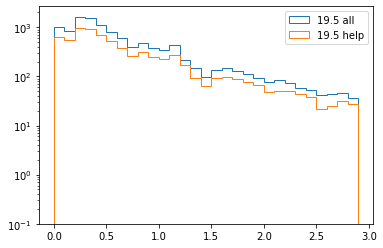

for sources brighter than 19.5 mag 33.01860785665058% of sources have a prior list counterpart


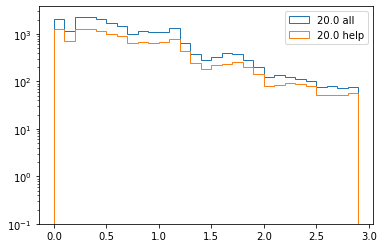

for sources brighter than 20.0 mag 37.16309929902163% of sources have a prior list counterpart


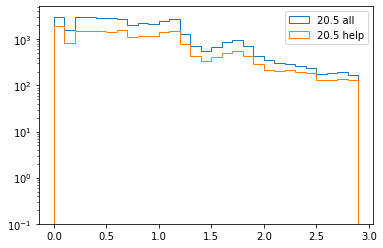

for sources brighter than 20.5 mag 41.47069303402815% of sources have a prior list counterpart


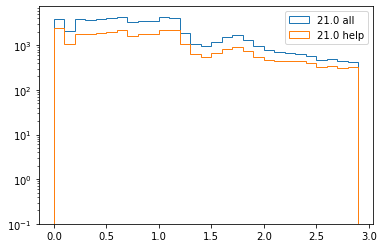

for sources brighter than 21.0 mag 44.238938820333495% of sources have a prior list counterpart


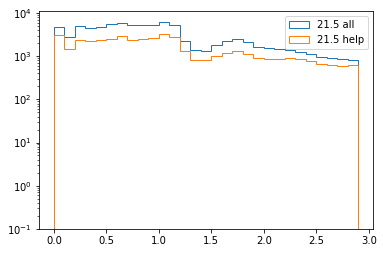

for sources brighter than 21.5 mag 43.947187928669415% of sources have a prior list counterpart


In [15]:
flux_serv = joined_test['ch2_servs_flux']/1E6
flux_serv_err = joined_test['ch2_servs_fluxerr']/1E6
flux_swire = joined_test['ch2_swire_flux']/1E6
flux_swire_err = joined_test['ch2_swire_fluxerr']/1E6
flux = flux_serv
f_mask = flux_serv_err>flux_swire_err
flux[f_mask] = flux_swire[f_mask]
mag = flux_to_mag(flux)[0]

mag_lims = np.arange(18,22,0.5)
for lim in mag_lims:

    mask = mag<lim
    
    mask_help = ~((joined_test[mask]['bayes.universe.redshift']>0).mask)
    num_in_help = np.sum(mask_help)
    
    z = joined_test['Z_BEST'][mask]
    plt.hist(z,bins=np.arange(0,3,0.1),log=True,histtype='step',label='{} all'.format(lim))
    z = joined_test['Z_BEST'][mask][~mask_help]
    plt.hist(z,bins=np.arange(0,3,0.1),log=True,histtype='step',label='{} help'.format(lim))
    
    plt.legend()
    plt.show()
    
    print('for sources brighter than {} mag {}% of sources have a prior list counterpart'.format(lim,num_in_help/np.sum(mask)*100))


In [16]:
#Read in the science ready catalogue from Ken that has stellar mass estimates
stellar_mass_cat = Table.read('../lofar/deep_fields/ELAIS-N1/data/EN1_opt_spitzer_merged_vac_opt3as_irac4as_all_hpx_masses_public.fits')
stellar_mass_cat.rename_column('help_id','id')
mask = stellar_mass_cat['Mass_median']>10.5

joined_cigale_lofar_mstar = join(joined_cigale_HELP,stellar_mass_cat[mask],join_type='right',keys='id')
print('there are {} sources with mass>10.5'.format(len(joined_cigale_lofar_mstar)))
num_HELP_matched = np.sum(~np.isnan(joined_cigale_lofar_mstar['bayes.universe.redshift']))
per_mass_with_FIR = num_HELP_matched/len(joined_cigale_lofar_mstar)*100
print('{} sources with mass>10.5 have a FIR luminosity in HELP which is {}%'.format(num_HELP_matched,per_mass_with_FIR))
joined_cigale_lofar_mstar[0]

/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


there are 70877 sources with mass>10.5
28922 sources with mass>10.5 have a FIR luminosity in HELP which is 40.805903184389855%


id,field,ra,dec,redshift_1,pacs_green,pacs_green_err,flag_pacs_green,pacs_red,pacs_red_err,flag_pacs_red,spire_250,spire_250_err,flag_spire_250_1,spire_350,spire_350_err,flag_spire_350_1,spire_500,spire_500_err,flag_spire_500_1,bayes.dust.luminosity,bayes.dust.luminosity_err,bayes.universe.redshift,bayes.universe.redshift_err,best.chi_square,best.reduced_chi_square,best.attenuation.Av_BC,best.attenuation.BC_to_ISM_factor,best.attenuation.bessell_b,best.attenuation.galex_fuv,best.attenuation.slope_BC,best.attenuation.slope_ISM,best.attenuation.stellar.old,best.attenuation.stellar.young,best.dust.alpha,best.dust.gamma,best.dust.luminosity,best.dust.mass,best.dust.qpah,best.dust.umin,best.lyc_absorption_f_dust,best.lyc_absorption_f_esc,best.sfh.age,best.sfh.burst_age,best.sfh.f_burst,best.sfh.integrated,best.sfh.sfr,best.sfh.sfr100Myrs,best.sfh.sfr10Myrs,best.sfh.tau_burst,best.sfh.tau_main,best.stellar.age_m_star,best.stellar.imf,best.stellar.lum_ly,best.stellar.lum_ly_old,best.stellar.lum_ly_young,best.stellar.m_gas,best.stellar.m_gas_old,best.stellar.m_gas_young,best.stellar.m_star,best.stellar.m_star_old,best.stellar.m_star_young,best.stellar.metallicity,best.stellar.n_ly,best.stellar.n_ly_old,best.stellar.n_ly_young,best.stellar.old_young_separation_age,best.universe.age,best.universe.luminosity_distance,best.universe.redshift,best.pacs_green,best.pacs_red,best.spire_250,best.spire_350,best.spire_500,redshift_2,ID,ID_OPTICAL,ID_SPITZER,RA,DEC,RA_HELP,DEC_HELP,EBV,CLASS_STAR,FLAG_OVERLAP,FLAG_CLEAN,u_flux,u_fluxerr,g_flux,g_fluxerr,r_flux,r_fluxerr,i_flux,i_fluxerr,z_flux,z_fluxerr,y_flux,y_fluxerr,g_hsc_flux,g_hsc_fluxerr,r_hsc_flux,r_hsc_fluxerr,i_hsc_flux,i_hsc_fluxerr,z_hsc_flux,z_hsc_fluxerr,y_hsc_flux,y_hsc_fluxerr,nb921_hsc_flux,nb921_hsc_fluxerr,J_flux,J_fluxerr,K_flux,K_fluxerr,ch1_servs_flux,ch1_servs_fluxerr,ch2_servs_flux,ch2_servs_fluxerr,ch1_swire_flux,ch1_swire_fluxerr,ch2_swire_flux,ch2_swire_fluxerr,ch3_swire_flux,ch3_swire_fluxerr,ch4_swire_flux,ch4_swire_fluxerr,F_MIPS_24,FErr_MIPS_24_u,FErr_MIPS_24_l,Bkg_MIPS_24,Sig_conf_MIPS_24,Rhat_MIPS_24,n_eff_MIPS_24,Pval_res_24,flag_mips_24,F_PACS_100,FErr_PACS_100_u,FErr_PACS_100_l,F_PACS_160,FErr_PACS_160_u,FErr_PACS_160_l,Bkg_PACS_100,Bkg_PACS_160,Sig_conf_PACS_100,Sig_conf_PACS_160,Rhat_PACS_100,Rhat_PACS_160,n_eff_PACS_100,n_eff_PACS_160,Pval_res_100,Pval_res_160,flag_PACS_100,flag_PACS_160,F_SPIRE_250,FErr_SPIRE_250_u,FErr_SPIRE_250_l,F_SPIRE_350,FErr_SPIRE_350_u,FErr_SPIRE_350_l,F_SPIRE_500,FErr_SPIRE_500_u,FErr_SPIRE_500_l,Bkg_SPIRE_250,Bkg_SPIRE_350,Bkg_SPIRE_500,Sig_conf_SPIRE_250,Sig_conf_SPIRE_350,Sig_conf_SPIRE_500,Rhat_SPIRE_250,Rhat_SPIRE_350,Rhat_SPIRE_500,n_eff_SPIRE_250,n_eff_SPIRE_500,n_eff_SPIRE_350,Pval_res_250,Pval_res_350,Pval_res_500,flag_spire_250_2,flag_spire_350_2,flag_spire_500_2,Z_BEST,Z_BEST_SOURCE,Z_SPEC,z1_median,z1_min,z1_max,z1_area,z2_median,z2_min,z2_max,z2_area,nfilt_eazy,nfilt_atlas,nfilt_ananna,chi_r_best,chi_r_stellar,stellar_type,AGN,optAGN,IRAGN,XrayAGN,hp_idx_11,hp_depth_cluster,tot_corr_g,tot_corr_err_g,tot_corr_r,tot_corr_err_r,tot_corr_z,tot_corr_err_z,zmodel,chi_best,Mass_median,Mass_l68,Mass_u68,SFR_median,SFR_l68,SFR_u68,Nfilts,u_rest,g_rest,r_rest,i_rest,z_rest,y_rest,J_rest,K_rest,ch1_servs_rest,ch2_servs_rest,ch1_swire_rest,ch2_swire_rest,ch3_swire_rest,ch4_swire_rest
,,deg,deg,,mJy,,,mJy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,mJy,mJy,mJy,mJy,mJy,,,,,deg,deg,deg,deg,,,,,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,,,,,,,,,,mJy,mJy,mJy,mJy,mJy,mJy,mJy/Beam,mJy/Beam,mJy/Beam,mJy/Beam,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,,,,,,,,,,solMass,solMass,solMass,solMass / yr,solMass / yr,solMass / yr,,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag
bytes1728,bytes18,float64,float64,float64,float32,float32,bool,float32,float32,bool,float64,float64,bool,float64,flo

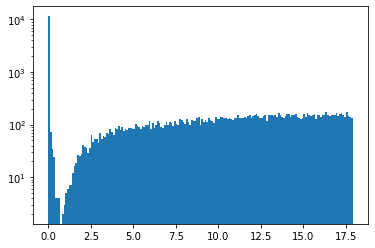

37.787794279784684% of sources have a LOFAR source within 1.0 arcseconds


In [17]:
#see whether the high mass galaxies not in HELP are nearby HELP gaalxies but have not been associated

mask = joined_cigale_lofar_mstar['bayes.universe.redshift'].mask
ras = joined_cigale_lofar_mstar['RA']
decs = joined_cigale_lofar_mstar['DEC']
high_mass_coords = SkyCoord(ra=ras,dec=decs)

mask = ~np.isnan(lofar_sed['optRA'])
ras = lofar_sed['optRA'][mask]
decs = lofar_sed['optDec'][mask]
help_ldust_coords = SkyCoord(ra=ras*u.degree,dec=decs*u.degree)

idx,d2d,_ = high_mass_coords.match_to_catalog_sky(help_ldust_coords)

d2d = d2d.value*3600
plt.hist(d2d,bins=np.arange(0,18,0.1),log=True)
plt.show()

sep_dist = 1.0
print('{}% of sources have a LOFAR source within {} arcseconds'.format(np.sum(d2d<sep_dist)/np.sum(mask)*100,sep_dist))

mask = d2d<sep_dist
joined_cigale_lofar_mstar = joined_cigale_lofar_mstar[~mask]

In [18]:
#This cell turned out to be unessecary as the majority of the cigale objects are also detcted by LOFAR

'''#join the cigale sample to the lofar sample which has stellar mass estimates

#Read in the science ready catalogue from Ken that has stellar mass estimates
stellar_mass_cat = Table.read('../lofar/deep_fields/ELAIS-N1/data/EN1_opt_spitzer_merged_vac_opt3as_irac4as_all_hpx_masses_public.fits')

ras = joined_cigale_HELP['ra']
decs = joined_cigale_HELP['dec']
cigale_coords = SkyCoord(ra=ras,dec=decs)
mask = ~np.isnan(stellar_mass_cat['Mass_median'])
ras = stellar_mass_cat['RA'][mask]
decs = stellar_mass_cat['DEC'][mask]
lofar_coords = SkyCoord(ra=ras,dec=decs)

idx,d2d,_ = cigale_coords'''

"#join the cigale sample to the lofar sample which has stellar mass estimates\n\n#Read in the science ready catalogue from Ken that has stellar mass estimates\nstellar_mass_cat = Table.read('../lofar/deep_fields/ELAIS-N1/data/EN1_opt_spitzer_merged_vac_opt3as_irac4as_all_hpx_masses_public.fits')\n\nras = joined_cigale_HELP['ra']\ndecs = joined_cigale_HELP['dec']\ncigale_coords = SkyCoord(ra=ras,dec=decs)\nmask = ~np.isnan(stellar_mass_cat['Mass_median'])\nras = stellar_mass_cat['RA'][mask]\ndecs = stellar_mass_cat['DEC'][mask]\nlofar_coords = SkyCoord(ra=ras,dec=decs)\n\nidx,d2d,_ = cigale_coords"

### Some checks on the mass selected sample

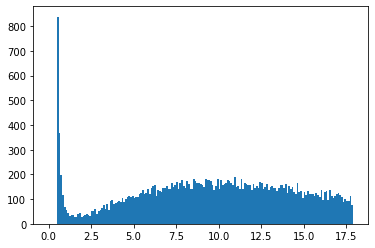

6.438306438306439% of sources have a HELP source with a FIR measurement within 2 arcseconds


In [19]:
#see whether the high mass galaxies not in HELP are nearby HELP gaalxies but have not been associated

mask = joined_cigale_lofar_mstar['bayes.universe.redshift'].mask
ras = joined_cigale_lofar_mstar[mask]['RA']
decs = joined_cigale_lofar_mstar[mask]['DEC']
high_mass_coords = SkyCoord(ra=ras,dec=decs)

ras = joined_cigale_HELP['ra']
decs = joined_cigale_HELP['dec']
help_ldust_coords = SkyCoord(ra=ras,dec=decs)

idx,d2d,_ = high_mass_coords.match_to_catalog_sky(help_ldust_coords)

d2d = d2d.value*3600
plt.hist(d2d,bins=np.arange(0,18,0.1))
plt.show()

sep_dist = 2
print('{}% of sources have a HELP source with a FIR measurement within {} arcseconds'.format(np.sum(d2d<sep_dist)/np.sum(mask)*100,sep_dist))

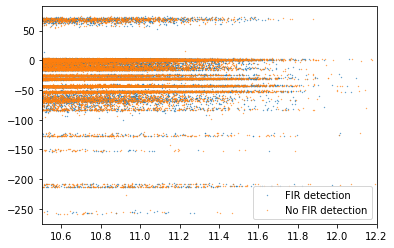

In [20]:
mask = joined_cigale_lofar_mstar['bayes.universe.redshift'].mask
x = joined_cigale_lofar_mstar['Mass_median'][~mask]
y = joined_cigale_lofar_mstar['SFR_median'][~mask]
plt.scatter(x,y,s=0.1,label='FIR detection')

x = joined_cigale_lofar_mstar['Mass_median'][mask]
y = joined_cigale_lofar_mstar['SFR_median'][mask]
plt.scatter(x,y,s=0.1,label='No FIR detection')

plt.xlim(10.5,12.2)
plt.legend()
plt.show()

## Look at the LIR from Magphys on the whole optical catalogue from EN1

In [23]:
magphys_all = Table.read('../lofar/deep_fields/ELAIS-N1/data/magphys/ELAIS_N1.fits')
magphys_all.rename_column('galaxy_id','ID')
print(len(magphys_all))
magphys_all[1]

183399


ID,z,chi2,chi2_99_flag,fmu_sfh_best,fmu_sfh_sigma,fmu_sfh_bayes,fmu_sfh_03,fmu_sfh_16,fmu_sfh_50,fmu_sfh_84,fmu_sfh_98,fmu_IR_best,fmu_IR_sigma,fmu_IR_bayes,fmu_IR_3,fmu_IR_16,fmu_IR_50,fmu_IR_86,fmu_IR_98,mu_best,mu_sigma,mu_bayes,mu_03,mu_16,mu_50,mu_84,mu_98,tau_V_best,tau_V_sigma,tau_V_bayes,tau_V_03,tau_V_16,tau_V_50,tau_V_84,tau_V_98,sSFR_best,sSFR_sigma,sSFR_bayes,sSFR_03,sSFR_16,sSFR_50,sSFR_84,sSFR_98,Mstar_best,Mstar_sigma,Mstar_bayes,Mstar_03,Mstar_16,Mstar_50,Mstar_84,Mstar_98,Ldust_best,Ldust_sigma,Ldust_bayes,Ldust_03,Ldust_16,Ldust_50,Ldust_84,Ldust_98,TC_ISM_best,TC_ISM_sigma,TC_ISM_bayes,TC_ISM_03,TC_ISM_16,TC_ISM_50,TC_ISM_84,TC_ISM_98,TW_BC_best,TW_BC_sigma,TW_BC_bayes,TW_BC_03,TW_BC_16,TW_BC_50,TW_BC_84,TW_BC_98,xi_C_tot_best,xi_C_tot_sigma,xi_C_tot_bayes,xi_C_tot_03,xi_C_tot_16,xi_C_tot_50,xi_C_tot_84,xi_C_tot_98,xi_PAH_tot_best,xi_PAH_tot_sigma,xi_PAH_tot_bayes,xi_PAH_tot_03,xi_PAH_tot_16,xi_PAH_tot_50,xi_PAH_tot_84,xi_PAH_tot_98,xi_MIR_tot_best,xi_MIR_tot_sigma,xi_MIR_tot_bayes,xi_MIR_tot_03,xi_MIR_tot_16,xi_MIR_tot_50,xi_MIR_tot_84,xi_MIR_tot_98,xi_W_tot_best,xi_W_tot_sigma,xi_W_tot_bayes,xi_W_tot_03,xi_W_tot_16,xi_W_tot_50,xi_W_tot_84,xi_W_tot_98,tau_V_ISM_best,tau_V_ISM_sigma,tau_V_ISM_bayes,tau_V_ISM_03,tau_V_ISM_16,tau_V_ISM_50,tau_V_ISM_84,tau_V_ISM_98,Mdust_best,Mdust_sigma,Mdust_bayes,Mdust_03,Mdust_16,Mdust_50,Mdust_84,Mdust_98,SFR_best,SFR_sigma,SFR_bayes,SFR_03,SFR_16,SFR_50,SFR_84,SFR_98
int32,float64,float32,int16,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1000032,0.1852,2.421,0,0.075,0.2085,0.3909773,0.058,0.177,0.377,0.594,0.912,0.153,0.227,0.398862,0.046,0.173,0.373,0.627,0.91,0.02,0.2105,0.23837923,0.019,0.047,0.194,0.468,0.691,0.858,0.74,0.80936277,0.027,0.132,0.432,1.612,3.427,8.206e-11,3.7862928e-11,6.638776e-11,4.265795e-12,3.0199516e-11,6.76083e-11,1.0592537e-10,1.4962356e-10,1710000000.0,494207296.0,1822506750.0,1076465150.0,1339676670.0,1828100220.0,2328091140.0,2766941700.0,915100030.0,594545540.0,897702270.0,92682984.0,314050880.0,770903490.0,1503142020.0,2409905410.0,22.5,3.4,20.09536,15.263,16.663,20.138,23.463,24.763,46.4,9.4,43.588245,30.663,34.313,43.113,53.113,58.738,0.088,0.182,0.30286166,0.034,0.123,0.277,0.487,0.722,0.15,0.1075,0.16659011,0.023,0.059,0.136,0.274,0.493,0.047,0.062,0.094322324,0.011,0.03,0.069,0.154,0.339,0.716,0.26,0.43593907,0.045,0.161,0.452,0.681,0.834,0.017,0.08,0.10249344,0.007,0.022,0.077,0.182,0.332,161900.0,1018397.6,1249023.8,34040.82,161064.56,626613.9,2197859.8,6194411.0,0.1403,0.06297075,0.11779153,0.00835603,0.04864072,0.11402498,0.17458221,0.24945948


there are 45780 sources with M<10.5 and z<1.0


41498
90.64657055482743% of high mass sources have a LIR measurement from MAGPHYS


ID,z,chi2,chi2_99_flag,fmu_sfh_best,fmu_sfh_sigma,fmu_sfh_bayes,fmu_sfh_03,fmu_sfh_16,fmu_sfh_50,fmu_sfh_84,fmu_sfh_98,fmu_IR_best,fmu_IR_sigma,fmu_IR_bayes,fmu_IR_3,fmu_IR_16,fmu_IR_50,fmu_IR_86,fmu_IR_98,mu_best,mu_sigma,mu_bayes,mu_03,mu_16,mu_50,mu_84,mu_98,tau_V_best,tau_V_sigma,tau_V_bayes,tau_V_03,tau_V_16,tau_V_50,tau_V_84,tau_V_98,sSFR_best,sSFR_sigma,sSFR_bayes,sSFR_03,sSFR_16,sSFR_50,sSFR_84,sSFR_98,Mstar_best,Mstar_sigma,Mstar_bayes,Mstar_03,Mstar_16,Mstar_50,Mstar_84,Mstar_98,Ldust_best,Ldust_sigma,Ldust_bayes,Ldust_03,Ldust_16,Ldust_50,Ldust_84,Ldust_98,TC_ISM_best,TC_ISM_sigma,TC_ISM_bayes,TC_ISM_03,TC_ISM_16,TC_ISM_50,TC_ISM_84,TC_ISM_98,TW_BC_best,TW_BC_sigma,TW_BC_bayes,TW_BC_03,TW_BC_16,TW_BC_50,TW_BC_84,TW_BC_98,xi_C_tot_best,xi_C_tot_sigma,xi_C_tot_bayes,xi_C_tot_03,xi_C_tot_16,xi_C_tot_50,xi_C_tot_84,xi_C_tot_98,xi_PAH_tot_best,xi_PAH_tot_sigma,xi_PAH_tot_bayes,xi_PAH_tot_03,xi_PAH_tot_16,xi_PAH_tot_50,xi_PAH_tot_84,xi_PAH_tot_98,xi_MIR_tot_best,xi_MIR_tot_sigma,xi_MIR_tot_bayes,xi_MIR_tot_03,xi_MIR_tot_16,xi_MIR_tot_50,xi_MIR_tot_84,xi_MIR_tot_98,xi_W_tot_best,xi_W_tot_sigma,xi_W_tot_bayes,xi_W_tot_03,xi_W_tot_16,xi_W_tot_50,xi_W_tot_84,xi_W_tot_98,tau_V_ISM_best,tau_V_ISM_sigma,tau_V_ISM_bayes,tau_V_ISM_03,tau_V_ISM_16,tau_V_ISM_50,tau_V_ISM_84,tau_V_ISM_98,Mdust_best,Mdust_sigma,Mdust_bayes,Mdust_03,Mdust_16,Mdust_50,Mdust_84,Mdust_98,SFR_best,SFR_sigma,SFR_bayes,SFR_03,SFR_16,SFR_50,SFR_84,SFR_98,ID_OPTICAL,ID_SPITZER,RA,DEC,id,RA_HELP,DEC_HELP,EBV,CLASS_STAR,FLAG_OVERLAP,FLAG_CLEAN,u_flux,u_fluxerr,g_flux,g_fluxerr,r_flux,r_fluxerr,i_flux,i_fluxerr,z_flux,z_fluxerr,y_flux,y_fluxerr,g_hsc_flux,g_hsc_fluxerr,r_hsc_flux,r_hsc_fluxerr,i_hsc_flux,i_hsc_fluxerr,z_hsc_flux,z_hsc_fluxerr,y_hsc_flux,y_hsc_fluxerr,nb921_hsc_flux,nb921_hsc_fluxerr,J_flux,J_fluxerr,K_flux,K_fluxerr,ch1_servs_flux,ch1_servs_fluxerr,ch2_servs_flux,ch2_servs_fluxerr,ch1_swire_flux,ch1_swire_fluxerr,ch2_swire_flux,ch2_swire_fluxerr,ch3_swire_flux,ch3_swire_fluxerr,ch4_swire_flux,ch4_swire_fluxerr,F_MIPS_24,FErr_MIPS_24_u,FErr_MIPS_24_l,Bkg_MIPS_24,Sig_conf_MIPS_24,Rhat_MIPS_24,n_eff_MIPS_24,Pval_res_24,flag_mips_24,F_PACS_100,FErr_PACS_100_u,FErr_PACS_100_l,F_PACS_160,FErr_PACS_160_u,FErr_PACS_160_l,Bkg_PACS_100,Bkg_PACS_160,Sig_conf_PACS_100,Sig_conf_PACS_160,Rhat_PACS_100,Rhat_PACS_160,n_eff_PACS_100,n_eff_PACS_160,Pval_res_100,Pval_res_160,flag_PACS_100,flag_PACS_160,F_SPIRE_250,FErr_SPIRE_250_u,FErr_SPIRE_250_l,F_SPIRE_350,FErr_SPIRE_350_u,FErr_SPIRE_350_l,F_SPIRE_500,FErr_SPIRE_500_u,FErr_SPIRE_500_l,Bkg_SPIRE_250,Bkg_SPIRE_350,Bkg_SPIRE_500,Sig_conf_SPIRE_250,Sig_conf_SPIRE_350,Sig_conf_SPIRE_500,Rhat_SPIRE_250,Rhat_SPIRE_350,Rhat_SPIRE_500,n_eff_SPIRE_250,n_eff_SPIRE_500,n_eff_SPIRE_350,Pval_res_250,Pval_res_350,Pval_res_500,flag_spire_250,flag_spire_350,flag_spire_500,Z_BEST,Z_BEST_SOURCE,Z_SPEC,z1_median,z1_min,z1_max,z1_area,z2_median,z2_min,z2_max,z2_area,nfilt_eazy,nfilt_atlas,nfilt_ananna,chi_r_best,chi_r_stellar,stellar_type,AGN,optAGN,IRAGN,XrayAGN,hp_idx_11,hp_depth_cluster,tot_corr_g,tot_corr_err_g,tot_corr_r,tot_corr_err_r,tot_corr_z,tot_corr_err_z,zmodel,chi_best,Mass_median,Mass_l68,Mass_u68,SFR_median,SFR_l68,SFR_u68,Nfilts,u_rest,g_rest,r_rest,i_rest,z_rest,y_rest,J_rest,K_rest,ch1_servs_rest,ch2_servs_rest,ch1_swire_rest,ch2_swire_rest,ch3_swire_rest,ch4_swire_rest
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,deg,,deg,deg,,,,,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,uJy,,,,,,,,,,mJy,mJy,mJy,mJy,mJy,mJy,mJy/Beam,mJy/Beam,mJy/Beam,mJy/Beam,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,,,,,,,,,,solMass,solMass,solMass,solMass / yr,solMass / yr,solMass / yr,,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag
int64,float64,float32,int16,float32,float32,float64,float32,float32,float32,float32,

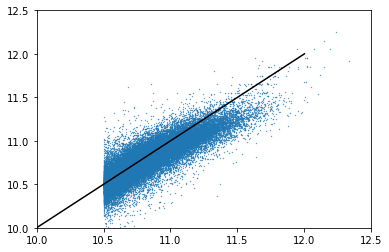

In [24]:
mask_ken = (stellar_mass_cat['Mass_median']>10.5) & (stellar_mass_cat['Z_BEST']<1.0)
print('there are {} sources with M<10.5 and z<1.0'.format(np.sum(mask_ken)))
magphys_stellar_mass = join(magphys_all,stellar_mass_cat[mask_ken],keys='ID',join_type='inner')
print(len(magphys_stellar_mass))
mask_mag = magphys_stellar_mass['Mass_median']>10.5
num_mag = np.sum(mask_mag)
num_ken = np.sum(mask_ken)

x = magphys_stellar_mass['Mass_median']
y = np.log10(magphys_stellar_mass['Mstar_bayes'])
plt.scatter(x,y,s=0.1)
plt.plot([10,12],[10,12],c='black')
plt.xlim(10,12.5)
plt.ylim(10,12.5)

print('{}% of high mass sources have a LIR measurement from MAGPHYS'.format(num_mag/num_ken*100))

magphys_stellar_mass[0]

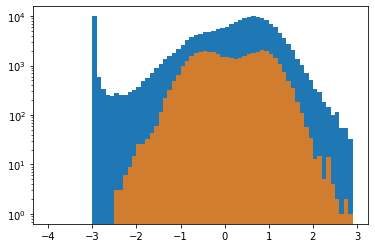

In [25]:
bins = np.arange(-4,3,0.1)
y = np.log10(magphys_all['SFR_bayes'])
plt.hist(y,bins=bins,log=True)

y = np.log10(magphys_stellar_mass['SFR_bayes'])
plt.hist(y,bins=bins,log=True,alpha=0.8)
plt.show()



/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in less
  result = getattr(super(), op)(other)


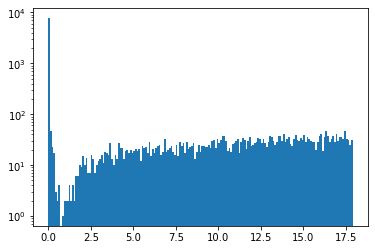

number of LOFAR sources with m>10.5 and z<1.0 is 8171
94.22347325908702% of LOFAR sources have a magphys source within 0.1 arcseconds


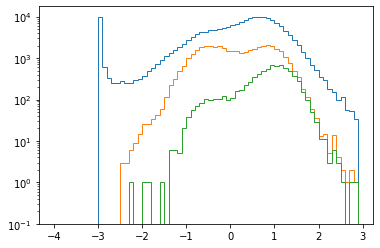

number of sources that only have a dust luminosity measurement is 33799


In [26]:
#see whether the high mass galaxies not in HELP are nearby HELP gaalxies but have not been associated

#mask = joined_cigale_lofar_mstar['bayes.universe.redshift'].mask
ras = magphys_stellar_mass['RA']
decs = magphys_stellar_mass['DEC']
high_mass_coords = SkyCoord(ra=ras,dec=decs)

mask = (~np.isnan(lofar_sed['optRA'])) & (lofar_sed['Z_BEST']<1.0) & (lofar_sed['Mass_median']>10.5) 
ras = lofar_sed['optRA'][mask]
decs = lofar_sed['optDec'][mask]
help_ldust_coords = SkyCoord(ra=ras*u.degree,dec=decs*u.degree)

idx,d2d,_ = high_mass_coords.match_to_catalog_sky(help_ldust_coords)

d2d = d2d.value*3600
plt.hist(d2d,bins=np.arange(0,18,0.1),log=True)
plt.show()

sep_dist = 0.1
print('number of LOFAR sources with m>10.5 and z<1.0 is {}'.format(np.sum(mask)))
print('{}% of LOFAR sources have a magphys source within {} arcseconds'.format(np.sum(d2d<sep_dist)/np.sum(mask)*100,sep_dist))

mask = d2d<sep_dist

bins = np.arange(-4,3,0.1)
y = np.log10(magphys_all['SFR_bayes'])
plt.hist(y,bins=bins,log=True,histtype='step')

y = np.log10(magphys_stellar_mass['SFR_bayes'])
plt.hist(y,bins=bins,log=True,histtype='step')

y = np.log10(magphys_stellar_mass['SFR_bayes'][mask])
plt.hist(y,bins=bins,log=True,histtype='step')
plt.show()

magphys_stellar_mass = magphys_stellar_mass[~mask]
print('number of sources that only have a dust luminosity measurement is {}'.format(len(magphys_stellar_mass)))

In [496]:
np.sum(mask)

7699

## Check my claucltaion of q and L150

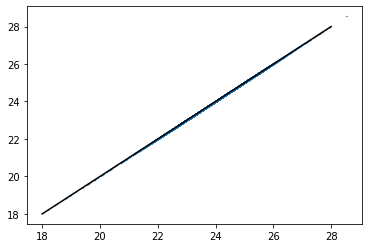

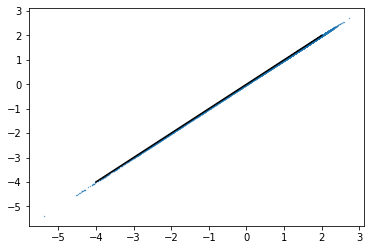

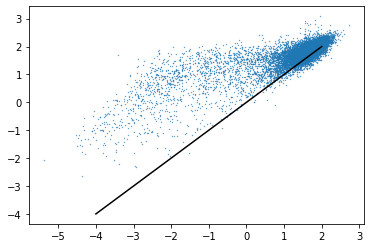

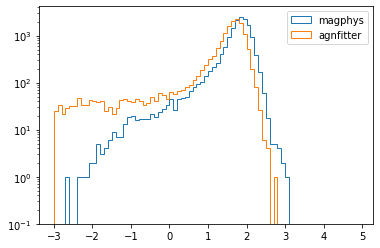

In [180]:

#compare the Lradio i calculate with the L150 from agnfitter

x = lofar_sed['logL150']
z = lofar_sed['Z_BEST']
dist = cosmo.luminosity_distance(z).to(u.m).value
alpha = -0.7
radio_flux = lofar_sed['Total_flux']
lum = radio_flux*4*np.pi*dist**2 * 1E-26 * (1+z)**(-1-alpha)
y = np.log10(lum)
plt.scatter(x,y,s=0.1)
plt.plot([18,28],[18,28],c='black')
plt.show()

#compare the q150 i get with agnfitter
mask_z = lofar_sed['Z_BEST']<1.0
x = lofar_sed['q150'][mask_z]
q = np.log10(lofar_sed['LIR'][mask_z]/3.75E12) - np.log10(lum)[mask_z]
y = q
plt.scatter(x,y,s=0.1)
plt.plot([-4,2],[-4,2],c='black')
plt.show()

x = lofar_sed['q150']
dust_lum = lofar_sed['Ldust_best'].data.data.astype(float)
mask = (~lofar_sed['Ldust_best'].mask)
mask = mask_lofar_mass
mask= mask_z
q = np.log10(dust_lum[mask]/3.75E12) - np.log10(lum[mask])
x = lofar_sed['q150'][mask]
y = q
plt.scatter(x,y,s=0.1)
plt.plot([-4,2],[-4,2],c='black')
plt.show()

bins = np.arange(-3,5,0.1)
plt.hist(q,bins=bins,log=True,histtype='step',label='magphys')
q = np.log10(lofar_sed['LIR']/3.75E12) - np.log10(lum)
plt.hist(q[mask_z],bins=bins,log=True,histtype='step',label='agnfitter')
plt.legend()
plt.show()



## Calculate the FIRC for all sources that have a stellar mass above some limit using MAGPHYS

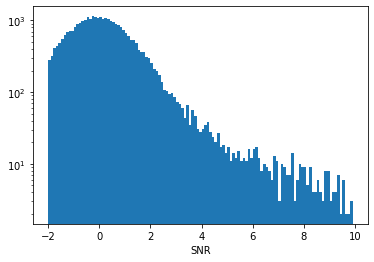

In [27]:
#snr = radim_data/radim_err
#plt.hist(snr,bins=np.arange(-2,10,0.1),log=True)

#Calculate upper limits on the radio flux from the LOFAR image for the HELP objects
mask = (magphys_stellar_mass['Z_BEST']<1.0) & (magphys_stellar_mass['Mass_median']>10.5)
ras = magphys_stellar_mass['RA']#[mask]
decs = magphys_stellar_mass['DEC']#[mask]

x,y = np.round(radim_wcs.wcs_world2pix(ras,decs,0,ra_dec_order=True),0).astype(int)
rad_flux = radim_data[x,y]
#rad_flux = np.array([np.max(radim_data[x[n]-5:x[n]+4,y[n]-5:y[n]+4]) for n in range(len(x))])
#flux_index = np.array([np.argmax(radim_data[x[n]-5:x[n]+4,y[n]-5:y[n]+4]) for n in range(len(x))])

x,y = np.round(radim_wcs_err.wcs_world2pix(ras,decs,0,ra_dec_order=True),0).astype(int)
rad_errs = radim_err[x,y]
#rad_errs = np.array([(radim_err[x[n]-5:x[n]+4,y[n]-5:y[n]+4].flatten()[flux_index[n]]) for n in range(len(x))])
rad_upper_lims = rad_errs*5



SNR = rad_flux/rad_errs
bins = np.arange(-2,10,0.1)
plt.hist(SNR,bins=bins,log=True)

plt.xlabel('SNR')
plt.show()

/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """


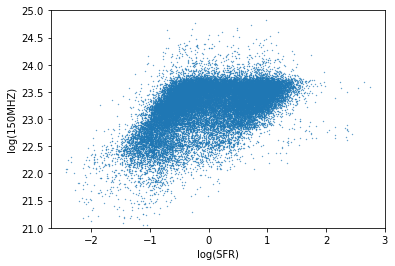

In [29]:
x = np.log10(magphys_stellar_mass['SFR_bayes'])
z = magphys_stellar_mass['Z_BEST']
dist = cosmo.luminosity_distance(z).to(u.m).value
alpha = -0.7
y = np.log10(rad_upper_lims*4*np.pi*dist**2 * 1E-26 * (1+z)**(-1-alpha))
plt.scatter(x,y,s=0.1)

plt.ylim(21,25)
plt.ylabel('log(150MHZ)')
plt.xlabel('log(SFR)')
plt.show()

In [30]:
#ONLY RUN THIS CELL ONCE
#create a mask to remove AGN from the radio and FIR detected sample

#read in the cigale catalogue to get a preliminary AGN classification
cigale_fritz = Table.read('../lofar/deep_fields/ELAIS-N1/data/cigale_fritz/lofar_team_test_cigale.fits')
print(len(cigale_fritz))

colnames = ['id','bayes.agn.fracAGN','bayes.agn.fracAGN_err']
cigale_fritz = cigale_fritz[colnames]

col_num = Column(name='id',data=np.arange(0,len(lofar_sed),1))
lofar_sed.add_column(col_num)

lofar_sed = join(lofar_sed,cigale_fritz,keys='id',join_type='outer')

#mask_agn = np.array([cigale_fritz['bayes.agn.fracAGN'][cigale_fritz['id']==n] for n in range(len(lofar_sed))])

30536


14514
26779
10849


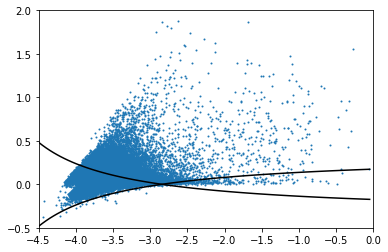

In [31]:
x = np.log10(lofar_sed['Total_flux'])
y = np.log10(lofar_sed['Total_flux']/lofar_sed['Peak_flux'])
plt.scatter(x,y,s=1)
x = np.arange(-4.5,0,0.05)
y = -1/(x+5.7)+0.35
plt.plot(x,y,c='black')
x = np.arange(-4.5,0,0.05)
y = 1/(x+5.7)-0.35
plt.plot(x,y,c='black')
plt.xlim(-4.5,0)
plt.ylim(-0.5,2)

guide = 1/(np.log10(lofar_sed['Total_flux'])+5.7)-0.35
mask_f_size = (np.log10(lofar_sed['Total_flux']/lofar_sed['Peak_flux'])>guide) | (np.log10(lofar_sed['Total_flux']/lofar_sed['Peak_flux'])>0.1)

mask_size = lofar_sed['Maj']*3600<9
mask_agn = (lofar_sed['bayes.agn.fracAGN']<0.1) & mask_size & ~mask_f_size
print(np.sum(mask_f_size))
print(np.sum(mask_size))
print(np.sum(mask_agn))


In [93]:
#calculate FIR luminosities and radio luminsoities

#get Ldust from SED fits for LOFAR sources
ldust_colnames = ['Ldust_best']
ldust_err_colnames = ['Ldust_sigma']
sed_fitters = ['magphys']
lofar_ldust,lofar_ldust_err = get_best_ldust(lofar_sed,ldust_colnames,ldust_err_colnames,sed_fitters)

mask_lofar_mass = (lofar_sed['Z_BEST']<1.0) & (lofar_sed['Mass_median']>10.5) 
mask_agn_mass = mask_agn[mask_lofar_mass]
ras_lofar = lofar_sed['RA'][mask_lofar_mass]
decs_lofar = lofar_sed['DEC'][mask_lofar_mass]
lofar_ldust = lofar_ldust[mask_lofar_mass]
lofar_ldust_err = lofar_ldust_err[mask_lofar_mass]

#add in the ldust measurments from CIGALE for HELP sources
mask_help_mass = (magphys_stellar_mass['Z_BEST']<1.0) & (magphys_stellar_mass['Mass_median']>10.5) & (np.log10(magphys_stellar_mass['SFR_bayes'])>0)
help_ldust = magphys_stellar_mass['Ldust_bayes'][mask_help_mass]*3.8E26
help_ldust_err = magphys_stellar_mass['Ldust_bayes'][mask_help_mass]
ras_help = magphys_stellar_mass['RA'][mask_help_mass]
decs_help = magphys_stellar_mass['DEC'][mask_help_mass]
mstar_help = magphys_stellar_mass['Mass_median'][mask_help_mass]

#radio luminosities for the LOFAR sources
radio_flux = lofar_sed['Peak_flux'][mask_lofar_mass]
radio_flux_err = lofar_sed['E_Peak_flux'][mask_lofar_mass]

redshift = lofar_sed['Z_BEST'][mask_lofar_mass]
mask = redshift<=0
redshift[mask] = 0.001

dist = cosmo.luminosity_distance(redshift).to(u.m).value

alpha=-0.73

lum_rad_lofar = radio_flux*4*np.pi*dist**2 * 1E-26 * (1+redshift)**(-1-alpha)
#mask out nan luminosities caused by radio sources with no redshift
mask = (~np.isnan(redshift)) & (~np.isnan(lofar_ldust))
mstar_lofar = lofar_sed['Mass_median'][mask_lofar_mass][mask]
lum_rad_lofar = lum_rad_lofar[mask]
lofar_ldust = lofar_ldust[mask]
ras_lofar = ras_lofar[mask]
decs_lofar = decs_lofar[mask]

#radio luminosties for the HELP sources
redshift_help = magphys_stellar_mass['Z_BEST'][mask_help_mass]
mask = redshift_help<=0
redshift_help[mask] = 0.001

dist = cosmo.luminosity_distance(redshift_help).to(u.m).value

alpha=-0.73

lum_rad_upper = rad_upper_lims[mask_help_mass]*4*np.pi*dist**2 * 1E-26 * (1+redshift_help)**(-1-alpha)

#create the joint LOFAR, HELP radio luminosity array
lum_rad_sf = np.append(lum_rad_lofar.data.data[mask_agn_mass],lum_rad_upper)
lum_rad_agn = lum_rad_lofar.data.data[~mask_agn_mass]
#convert the radio luminosities to watts from Janskys
#lum_rad = lum_rad/1E26

#create a joint ldust array
ldust_sf = np.append(lofar_ldust[mask_agn_mass],help_ldust)
ldust_sf_err = np.append(lofar_ldust_err,help_ldust_err)
ldust_agn = lofar_ldust[~mask_agn_mass]

#set flags for detection in the radio map

#all the lum_rad_lofar sources are detected and all the HELP sources are not detected
det_radio = np.append(np.ones(len(lum_rad_lofar[mask_agn_mass])),np.zeros(len(lum_rad_upper)))

ras_all_sf = np.append(ras_lofar.data.data[mask_agn_mass],ras_help.data.data)
decs_all_sf = np.append(decs_lofar.data.data[mask_agn_mass],decs_help.data.data)
redshift_all_sf = np.append(redshift.data.data[mask_agn_mass],redshift_help.data.data)
mstar_all_sf = np.append(mstar_lofar[mask_agn_mass],mstar_help)

ras_all_agn = ras_lofar.data.data[~mask_agn_mass]
decs_all_agn = decs_lofar.data.data[~mask_agn_mass]
redshift_all_agn = redshift.data.data[~mask_agn_mass]
mstar_all_agn = mstar_lofar[~mask_agn_mass]

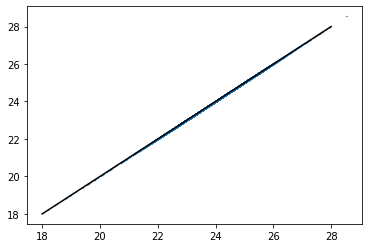

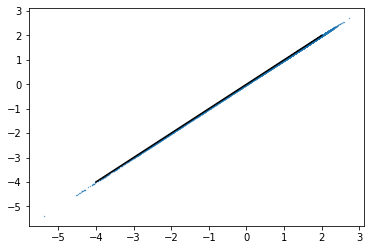

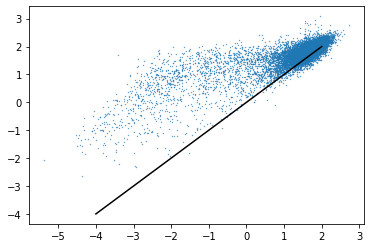

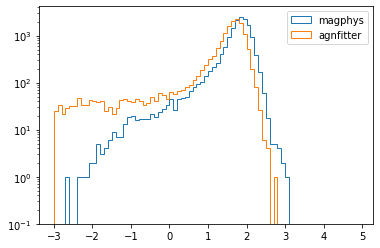

In [166]:
dust_lum

array([4.810799579136e+38, 2.227939835904e+38, 3.1836397895680003e+38,
       ..., 5.935599714304e+38, 9.921799782400001e+37, 1.818679967744e+38],
      dtype=object)

it appears that the calculation of the radio luminosity i carry out is okay

measured median from the detections is: 1.582639715994361
measured median using survival analysis is: 2.020989662889235


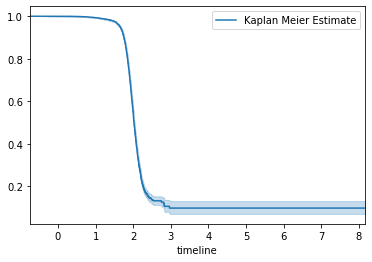

median q = -24.558793933727575


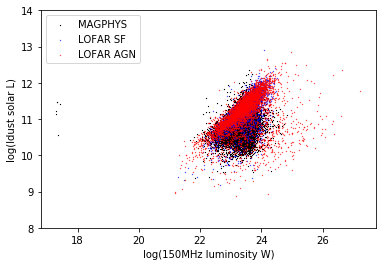

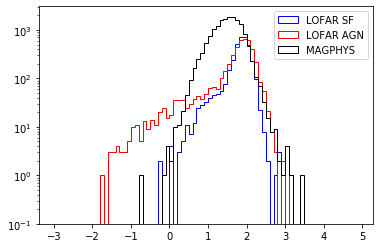

In [94]:
q_sf = np.log10(ldust_sf/3.75E12) - np.log10(lum_rad_sf)
q_agn = np.log10(ldust_agn/3.75E12) - np.log10(lum_rad_agn)
mask = ~np.isinf(q_sf)
const = np.max(q_sf)
#q = const - q
#q_lim = const - q_lim

data = q_sf[mask]
#data[flag_detected] = q_lim[flag_detected]
det = det_radio[mask]
print('measured median from the detections is: {}'.format(np.median(data)))

kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(data, det,label='Kaplan Meier Estimate')

## Create an estimate
print('measured median using survival analysis is: {}'.format(kmf.median_))
kmf.plot()
plt.show()

print('median q = {}'.format(kmf.median_-np.log10(3.8E26)))

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='MAGPHYS',c='black')

y = np.log10(lofar_ldust[mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR SF',c='blue')

y = np.log10(lofar_ldust[~mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[~mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR AGN',c='red')



plt.xlabel('log(150MHz luminosity W)')
plt.ylabel('log(ldust solar L)')
plt.ylim(8.0,14)
plt.legend()
plt.show()

bins = np.arange(-3,5,0.1)
q_lofar = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
plt.hist(q_sf[det_radio.astype(bool)],log=True,label='LOFAR SF',bins=bins,histtype='step',color='blue')
plt.hist(q_agn,log=True,label='LOFAR AGN',bins=bins,histtype='step',color='red')

q_help = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.hist(q_help,log=True,label='MAGPHYS',bins=bins,histtype='step',color='black')
plt.legend()
plt.show()

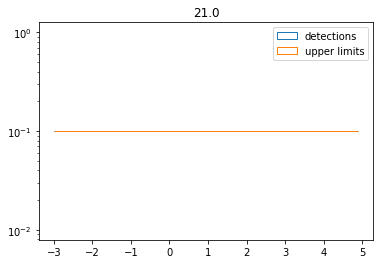

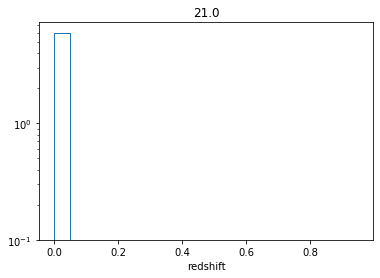

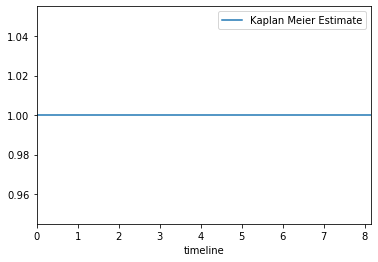

measured median using survival analysis is: inf


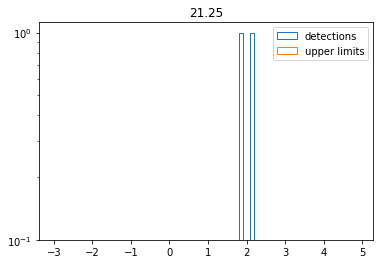

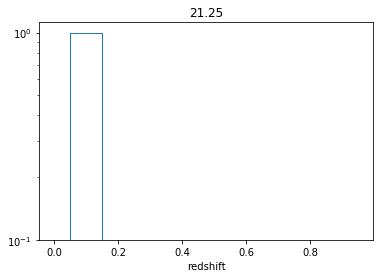

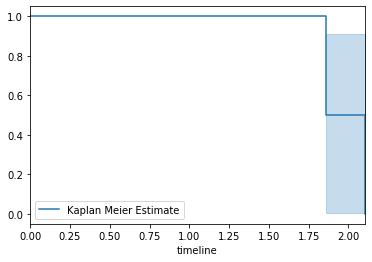

measured median using survival analysis is: 1.8617655034703517


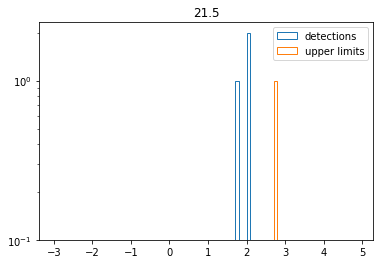

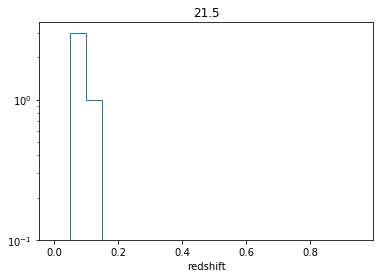

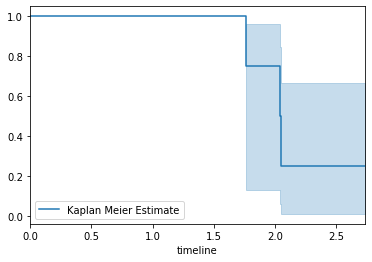

measured median using survival analysis is: 2.042324673807382


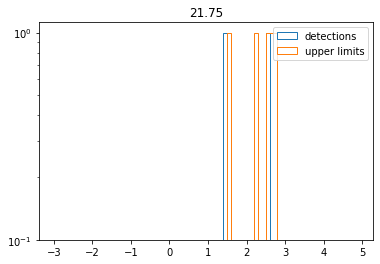

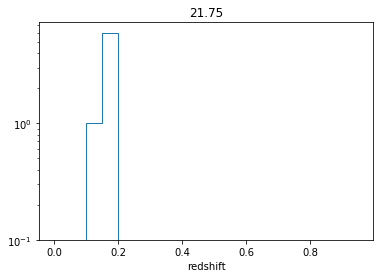

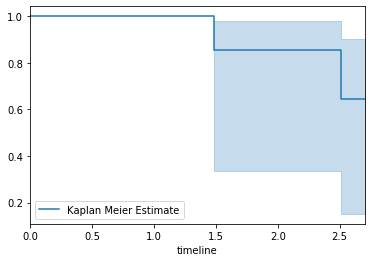

measured median using survival analysis is: inf


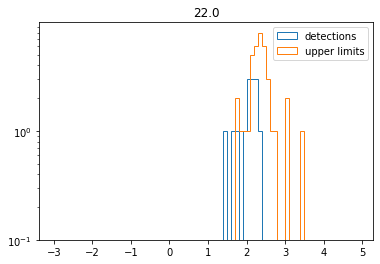

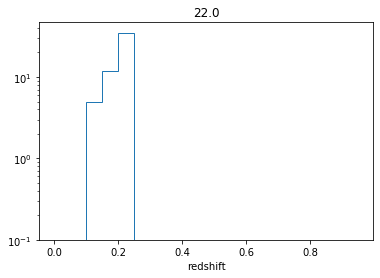

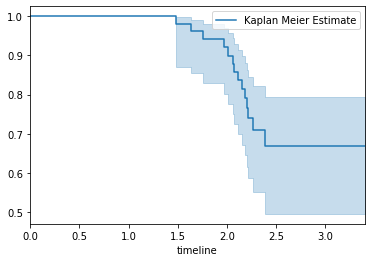

measured median using survival analysis is: inf


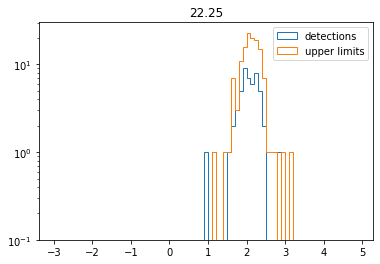

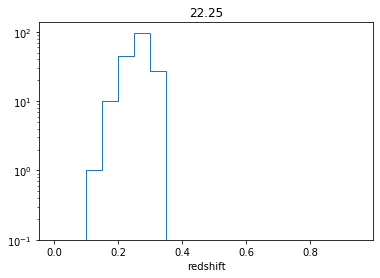

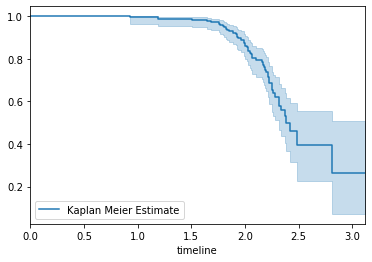

measured median using survival analysis is: 2.4160460955306


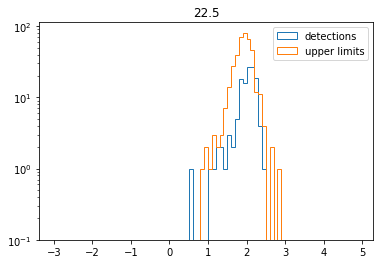

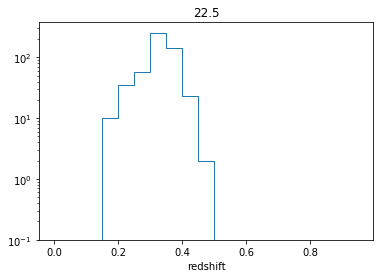

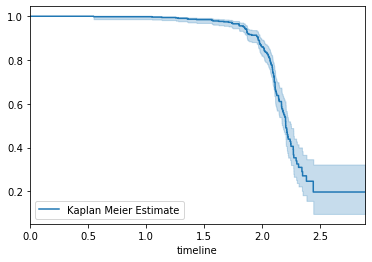

measured median using survival analysis is: 2.2024851544675066


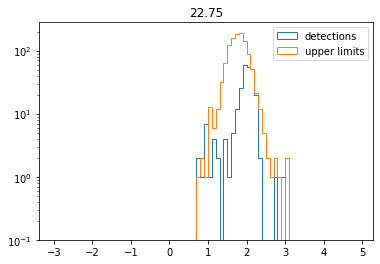

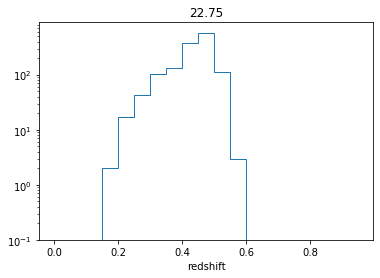

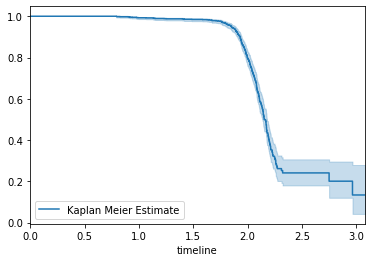

measured median using survival analysis is: 2.152637314820172


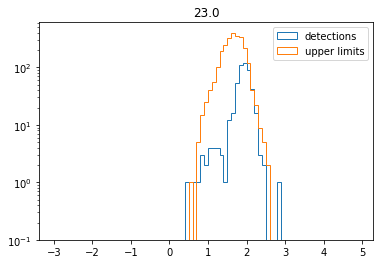

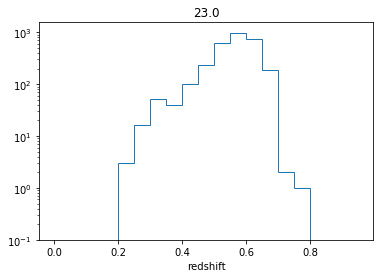

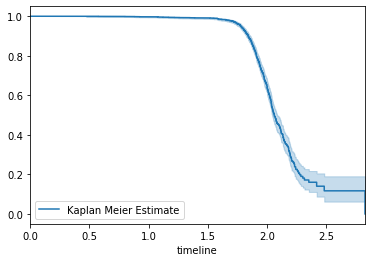

measured median using survival analysis is: 2.062177057988972


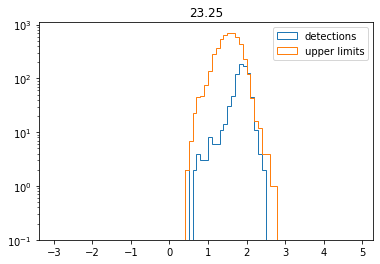

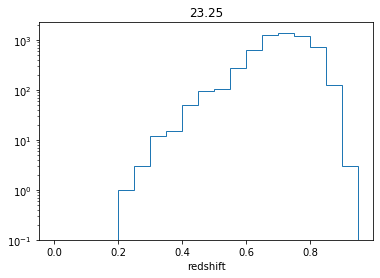

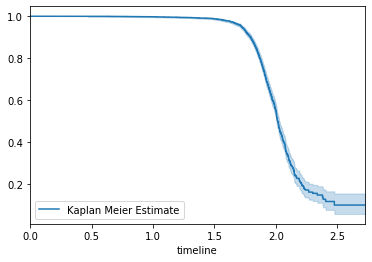

measured median using survival analysis is: 2.0151251645310637


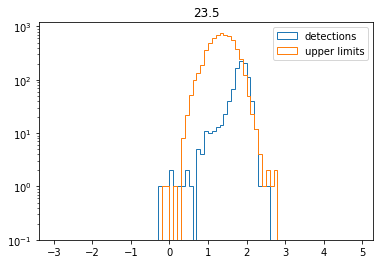

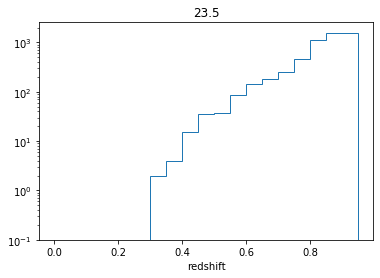

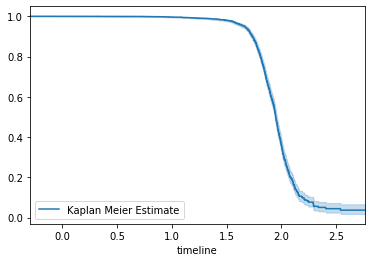

measured median using survival analysis is: 1.9479996482258493


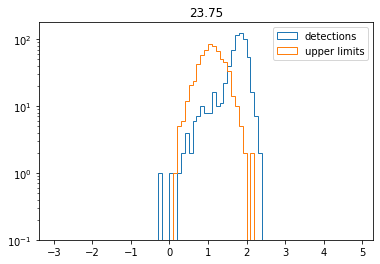

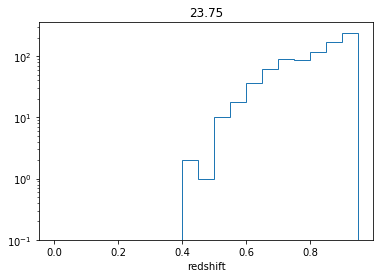

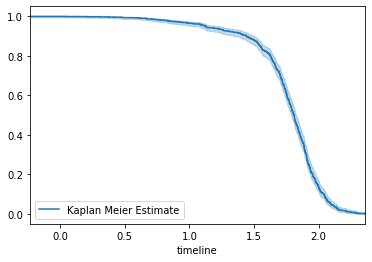

measured median using survival analysis is: 1.8085412795848903


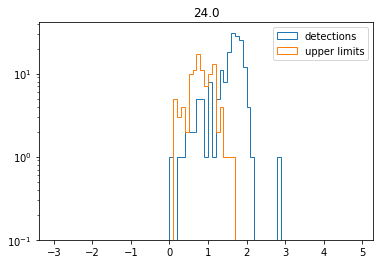

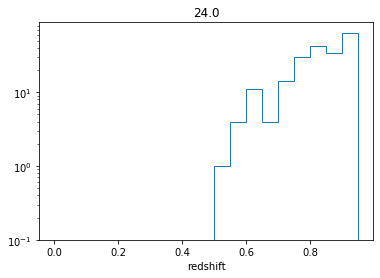

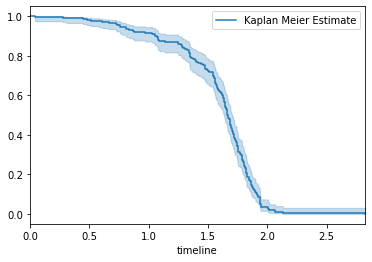

measured median using survival analysis is: 1.6638486674349267


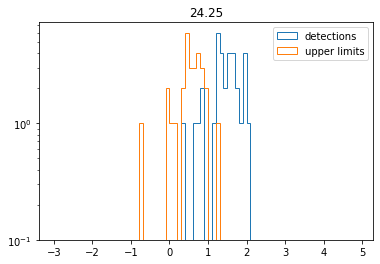

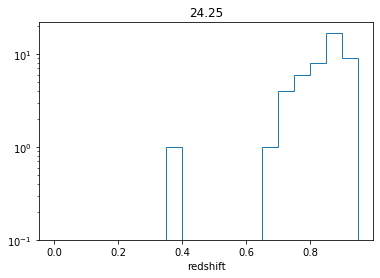

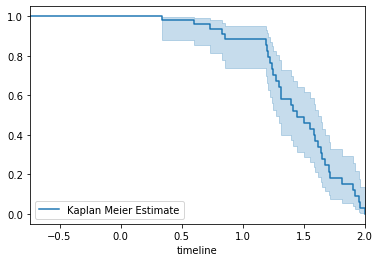

measured median using survival analysis is: 1.444745352746505


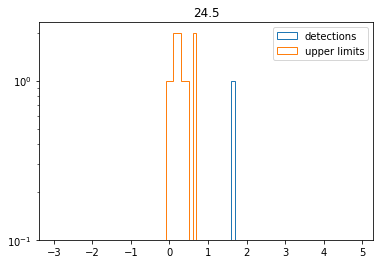

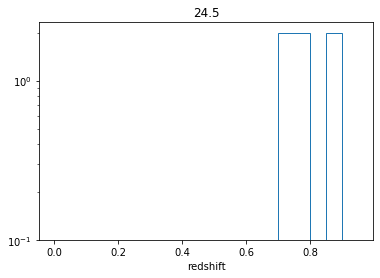

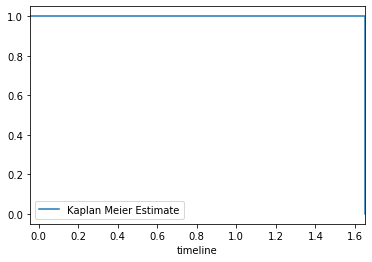

measured median using survival analysis is: 1.650433677270179


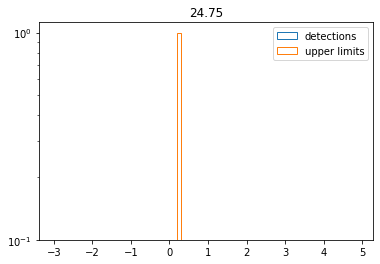

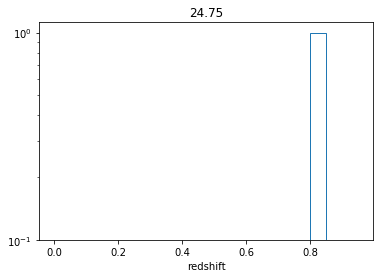

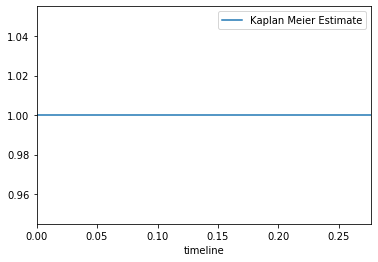

measured median using survival analysis is: inf


In [100]:
bins_lum = np.arange(21,25,0.25)

test = np.digitize(np.log10(lum_rad_sf),bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q_mag = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all_sf[mask])
    decs_binned.append(decs_all_sf[mask])
    redshift_binned.append(redshift_all_sf[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all_sf[mask],bins=np.arange(0,1,0.05),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q_mag.append(kmf.median_)

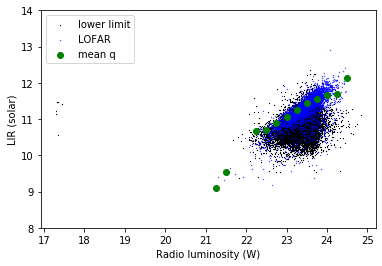

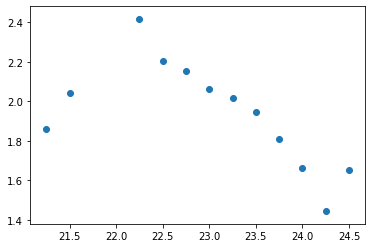

In [102]:
x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='lower limit',c='black')

y = np.log10(lofar_ldust[mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR',c='blue')



x = bins_lum[nums-1]
y = mean_q_mag + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q',c='green')

plt.ylim(8.0,14)
plt.xlabel('Radio luminosity (W)')
plt.ylabel('LIR (solar)')
plt.legend()
plt.show()

x = bins_lum[nums-1]
y = mean_q_mag
plt.scatter(x,y)


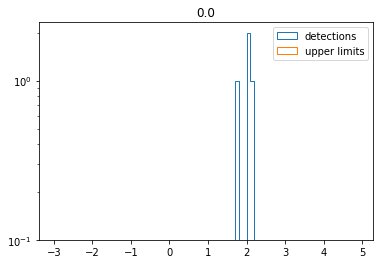

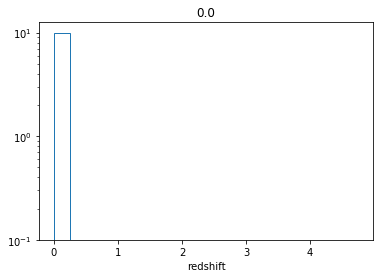

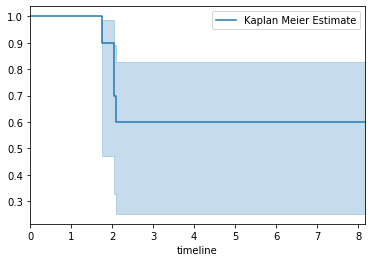

measured median using survival analysis is: inf


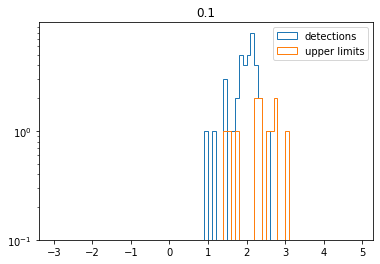

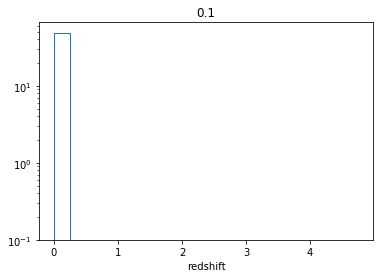

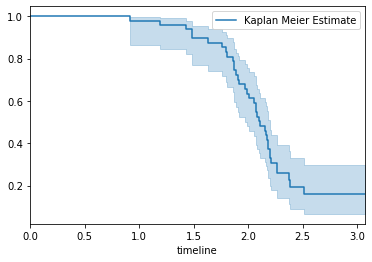

measured median using survival analysis is: 2.109103617057311


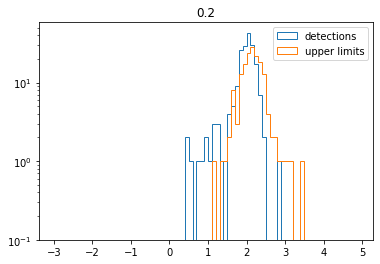

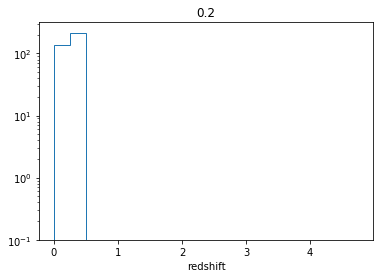

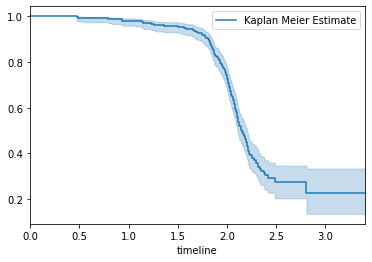

measured median using survival analysis is: 2.152637314820172


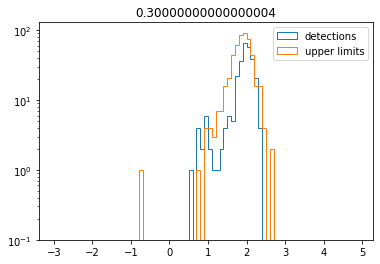

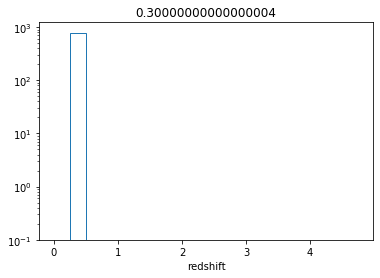

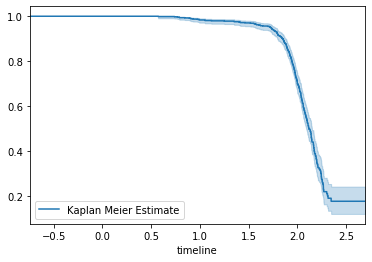

measured median using survival analysis is: 2.1196712840078646


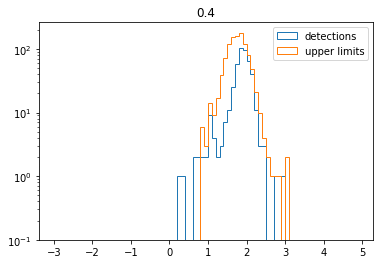

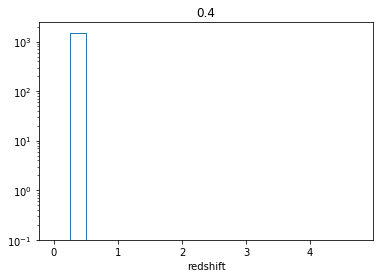

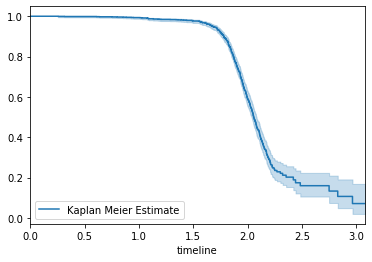

measured median using survival analysis is: 2.0552557580813406


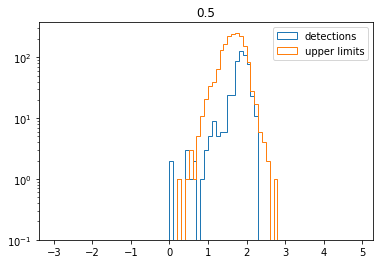

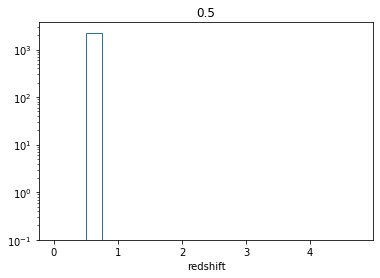

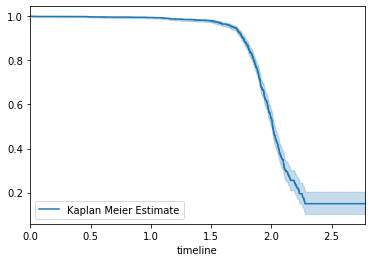

measured median using survival analysis is: 2.0109026698343975


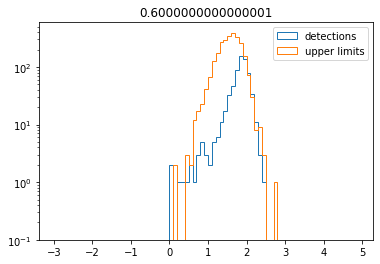

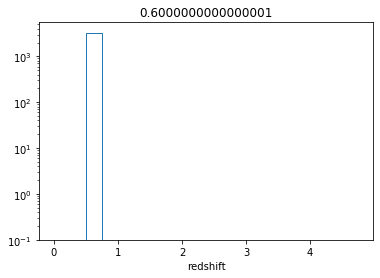

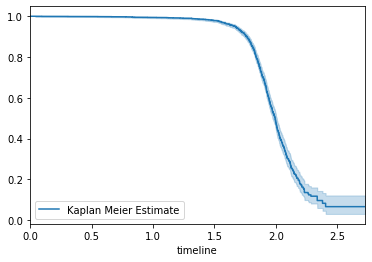

measured median using survival analysis is: 1.9946156864424331


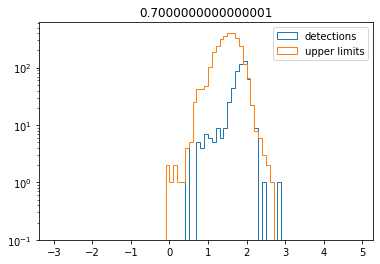

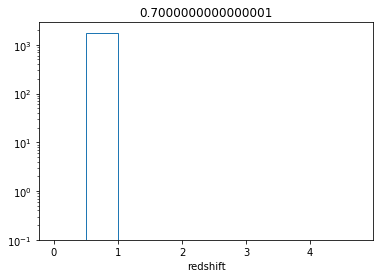

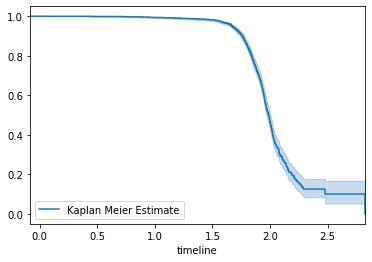

measured median using survival analysis is: 1.990391588360815


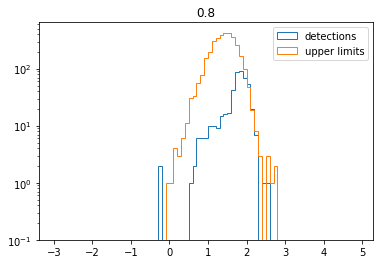

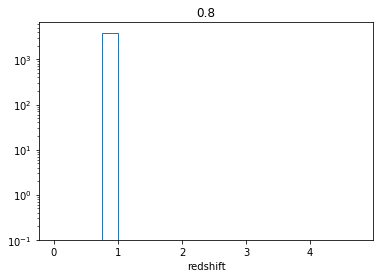

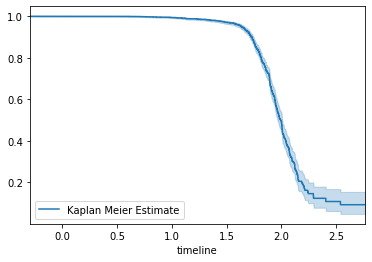

measured median using survival analysis is: 1.992613175046582


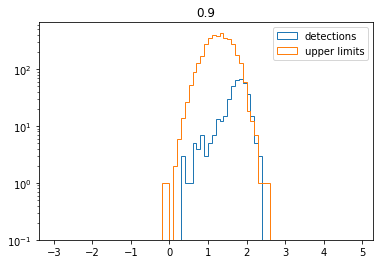

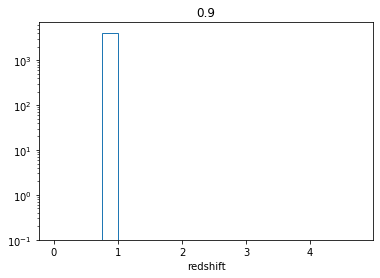

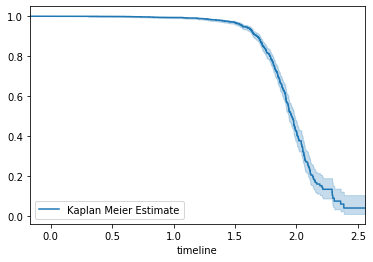

measured median using survival analysis is: 1.9601471328777684


In [107]:
bins_z = np.arange(0,1.0,0.1)

test = np.digitize(redshift_all_sf,bins=bins_z)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all_sf[mask])
    decs_binned.append(decs_all_sf[mask])
    redshift_binned.append(redshift_all_sf[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all_sf[mask],bins=np.arange(0,5,0.25),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q.append(kmf.median_)

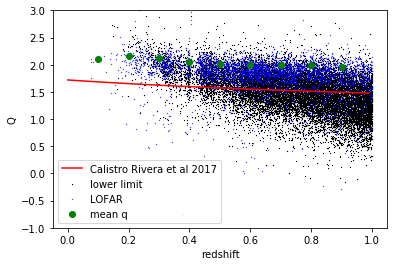

In [110]:
x = redshift_help
y = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
mask = ~det.astype(bool)
y = q_sf[mask]
x = redshift_all_sf[mask]
plt.scatter(x,y,s=0.1,marker='^',label='lower limit',c='black')

mask = det.astype(bool)
y = q_sf[mask]
x = redshift_all_sf[mask]
plt.scatter(x,y,s=0.1,label='LOFAR',c='blue')

x = bins_z[nums-1]
y = mean_q
plt.scatter(x,y,label='mean q',c='green')

x = np.arange(0,1,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.ylim(-1,3)
plt.xlabel('redshift')
plt.ylabel('Q')
plt.legend()
plt.show()

## Calculate the FIRC for all sources that have a stellar mass above some limit using AGNfitter

In [454]:
#calculate FIR luminosities and radio luminsoities

#get Ldust from SED fits for LOFAR sources
ldust_colnames = ['LIR']
ldust_err_colnames = ['Ldust_sigma']
sed_fitters = ['agnfitter']
lofar_ldust,lofar_ldust_err = get_best_ldust(lofar_sed,ldust_colnames,ldust_err_colnames,sed_fitters)
print(len(np.unique(lofar_ldust))==len(lofar_ldust))

mask_lofar_mass = (lofar_sed['Z_BEST']<1.0) #& (lofar_sed['Mass_median']>10.5) 
mask_agn_mass = mask_agn[mask_lofar_mass]
ras_lofar = lofar_sed['RA'][mask_lofar_mass]
decs_lofar = lofar_sed['DEC'][mask_lofar_mass]
lofar_ldust = lofar_ldust[mask_lofar_mass]
lofar_ldust_err = lofar_ldust_err[mask_lofar_mass]
print(len(np.unique(lofar_ldust))==len(lofar_ldust))

#add in the ldust measurments from CIGALE for HELP sources
mask_help_mass = (magphys_stellar_mass['Z_BEST']<1.0) & (magphys_stellar_mass['Mass_median']>10.5) & (np.log10(magphys_stellar_mass['SFR_bayes'])>0)
help_ldust = magphys_stellar_mass['Ldust_bayes'][mask_help_mass]*3.8E26
#help_ldust_err = magphys_stellar_mass['Ldust_bayes'][mask_help_mass]
ras_help = magphys_stellar_mass['RA'][mask_help_mass]
decs_help = magphys_stellar_mass['DEC'][mask_help_mass]
mstar_help = magphys_stellar_mass['Mass_median'][mask_help_mass]

#radio luminosities for the LOFAR sources
radio_flux = lofar_sed['Total_flux'][mask_lofar_mass]
radio_flux_err = lofar_sed['E_Peak_flux'][mask_lofar_mass]

redshift = lofar_sed['Z_BEST'][mask_lofar_mass]
mask = redshift<=0
redshift[mask] = 0.001

dist = cosmo.luminosity_distance(redshift).to(u.m).value

alpha=-0.7

lum_rad_lofar = radio_flux*4*np.pi*dist**2 * 1E-26 * (1+redshift)**(-1-alpha)
#mask out nan luminosities caused by radio sources with no redshift
mask = (~np.isnan(redshift)) & (~np.isnan(lofar_ldust))
mstar_lofar = lofar_sed['Mass_median'][mask_lofar_mass][mask]
lum_rad_lofar = lum_rad_lofar[mask]
lofar_ldust = lofar_ldust[mask]
ras_lofar = ras_lofar[mask]
decs_lofar = decs_lofar[mask]

#upper limits on the radio luminosties for the HELP sources
redshift_help = magphys_stellar_mass['Z_BEST'][mask_help_mass]
mask = redshift_help<=0
redshift_help[mask] = 0.001

dist = cosmo.luminosity_distance(redshift_help).to(u.m).value

lum_rad_upper = rad_upper_lims[mask_help_mass]*4*np.pi*dist**2 * 1E-26 * (1+redshift_help)**(-1-alpha)

#create the joint LOFAR, HELP radio luminosity array
lum_rad_sf = lum_rad_lofar.data.data[mask_agn_mass]
lum_rad_agn = lum_rad_lofar.data.data[~mask_agn_mass]
lum_rad_upper = lum_rad_upper.data.data

#create the arrays for the ldust measurements
ldust_sf = lofar_ldust[mask_agn_mass]
ldust_agn = lofar_ldust[~mask_agn_mass]
ldust_upper = help_ldust

#create arrays for the q values for sf, agn and the radio non detections
q_sf = np.log10(ldust_sf/3.75E12) - np.log10(lum_rad_sf)
q_agn = np.log10(ldust_agn/3.75E12) - np.log10(lum_rad_agn)
q_lower_limit = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)


#all the lum_rad_lofar sources are detected and all the HELP sources are not detected


ras_sf = ras_lofar.data.data[mask_agn_mass]
decs_sf = decs_lofar.data.data[mask_agn_mass]
redshift_sf = redshift.data.data[mask_agn_mass]
mstar_sf = mstar_lofar[mask_agn_mass]

ras_agn = ras_lofar.data.data[~mask_agn_mass]
decs_agn = decs_lofar.data.data[~mask_agn_mass]
redshift_agn = redshift.data.data[~mask_agn_mass]
mstar_agn = mstar_lofar[~mask_agn_mass]

ras_limit = ras_help.data.data
decs_limit = decs_help.data.data
redshift_limit = redshift_help.data.data
mstar_limit = mstar_help

agnfitter
False
False


In [457]:
lofar_ldust,lofar_ldust_err = get_best_ldust(lofar_sed,ldust_colnames,ldust_err_colnames,sed_fitters)
len(lofar_ldust)
len(np.unique(lofar_ldust))

agnfitter


20210

In [458]:
len(lofar_ldust)

31645

measured median from the detections is: 1.5838169020916588
measured median using survival analysis is: 1.9187291044588441


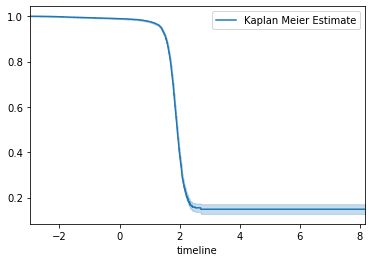

median q = -24.661054492157966


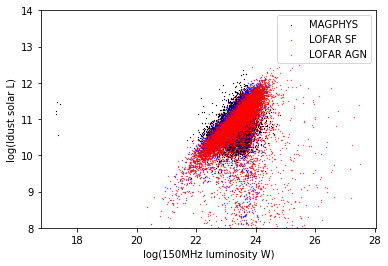

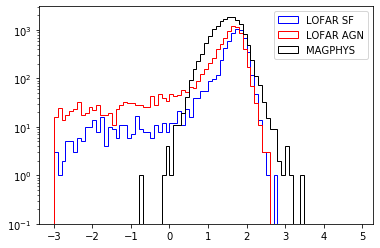

In [339]:
data = np.append(q_sf,q_lower_limit)
det = np.append(np.ones(len(q_sf)),np.zeros(len(q_lower_limit)))
mask = ~np.isinf(data)
data = data[mask]
det = det[mask]
const = np.max(q_sf)

print('measured median from the detections is: {}'.format(np.median(data)))

kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(data, det,label='Kaplan Meier Estimate')

## Create an estimate
print('measured median using survival analysis is: {}'.format(kmf.median_))
kmf.plot()
plt.show()

print('median q = {}'.format(kmf.median_-np.log10(3.8E26)))

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='MAGPHYS',c='black')

y = np.log10(lofar_ldust[mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR SF',c='blue')

y = np.log10(lofar_ldust[~mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[~mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR AGN',c='red')



plt.xlabel('log(150MHz luminosity W)')
plt.ylabel('log(ldust solar L)')
plt.ylim(8.0,14)
plt.legend()
plt.show()

bins = np.arange(-3,5,0.1)
q_lofar = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
plt.hist(q_sf,log=True,label='LOFAR SF',bins=bins,histtype='step',color='blue')
plt.hist(q_agn,log=True,label='LOFAR AGN',bins=bins,histtype='step',color='red')

q_help = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.hist(q_lower_limit,log=True,label='MAGPHYS',bins=bins,histtype='step',color='black')
plt.legend()
plt.show()

no data in luminosity bin


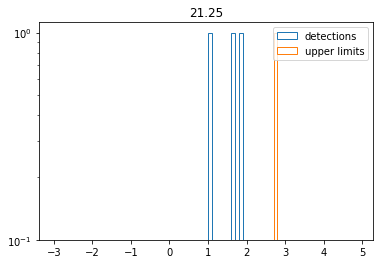

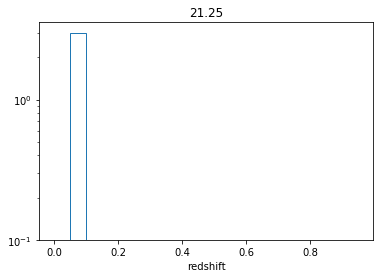

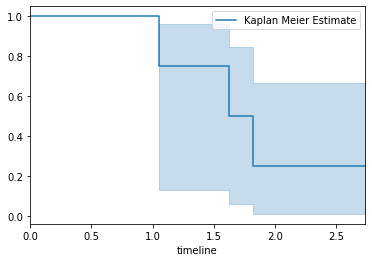

/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/lifelines/fitters/kaplan_meier_fitter.py:287: FutureWarning: Please use `median_survival_time_` property instead. Future property `median_` will be removed.
  FutureWarning,


measured median using survival analysis is: 1.6229374478740048


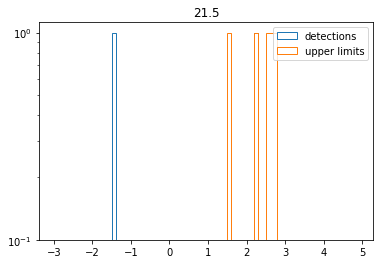

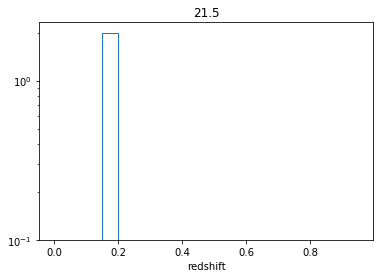

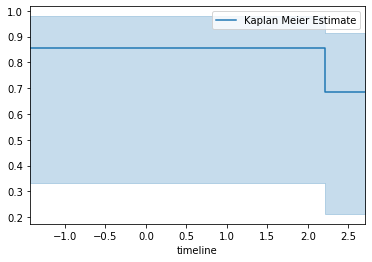

measured median using survival analysis is: inf


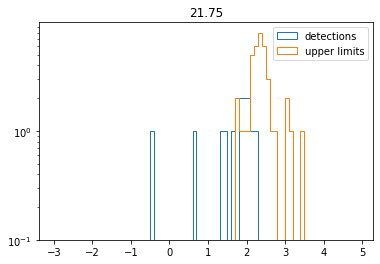

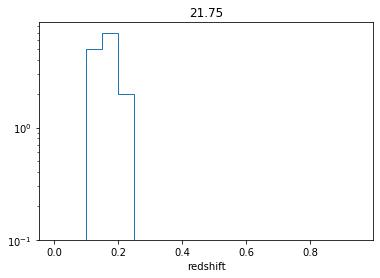

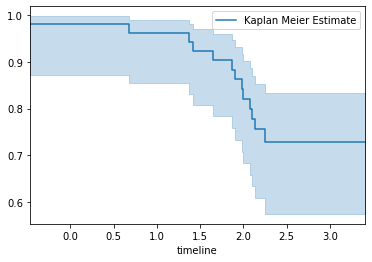

measured median using survival analysis is: inf


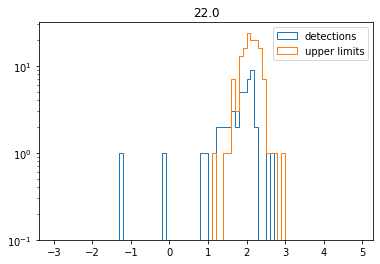

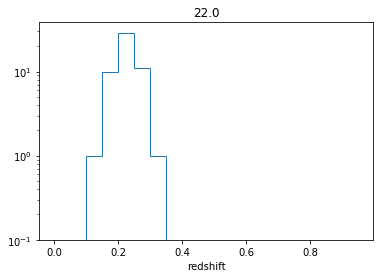

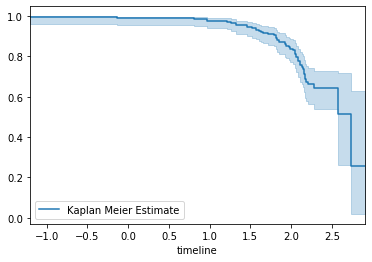

measured median using survival analysis is: 2.7311745052608636


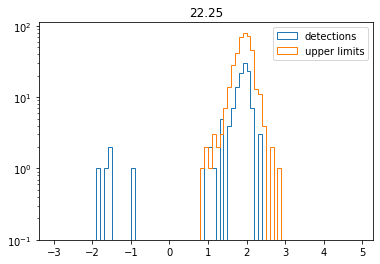

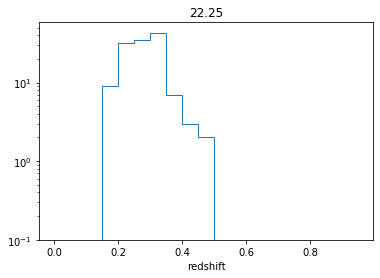

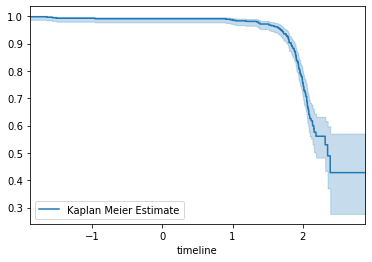

measured median using survival analysis is: 2.3559677580989806


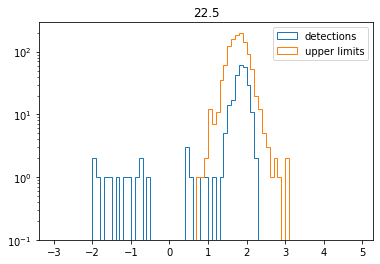

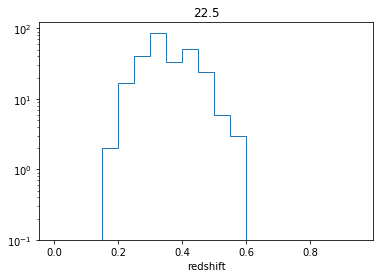

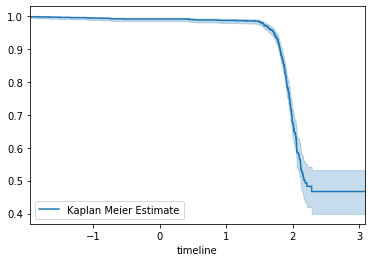

measured median using survival analysis is: 2.1816581404597883


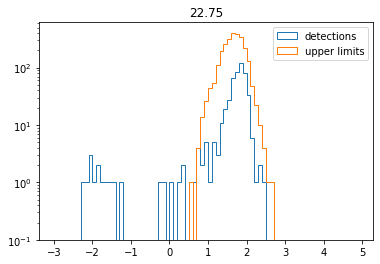

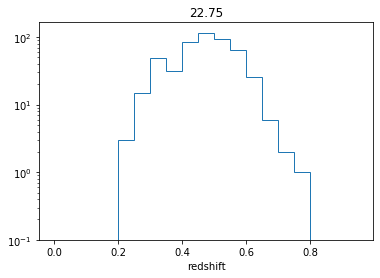

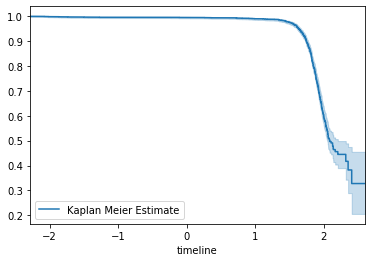

measured median using survival analysis is: 2.0882852876464675


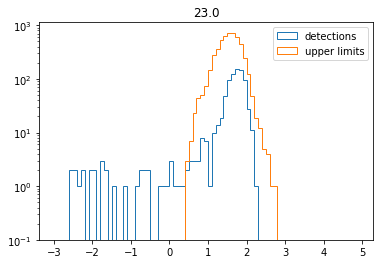

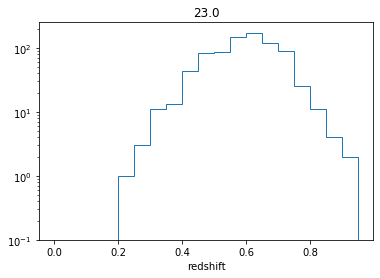

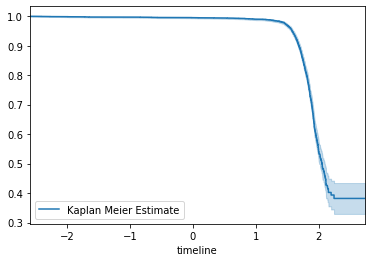

measured median using survival analysis is: 2.0513042270665593


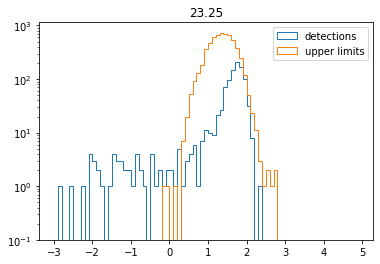

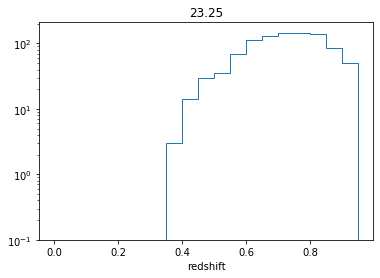

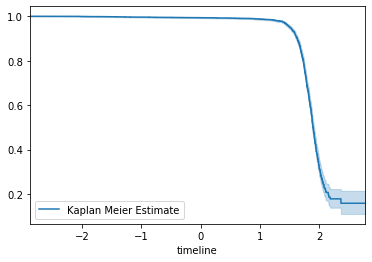

measured median using survival analysis is: 1.8942889520104984


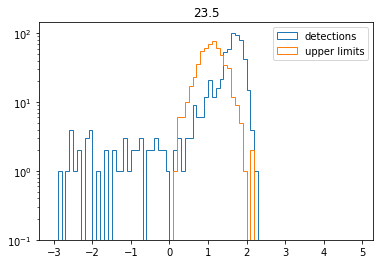

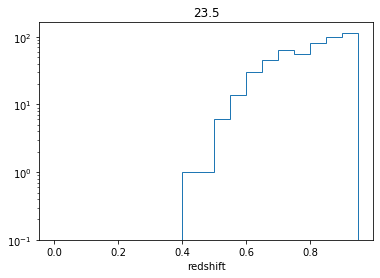

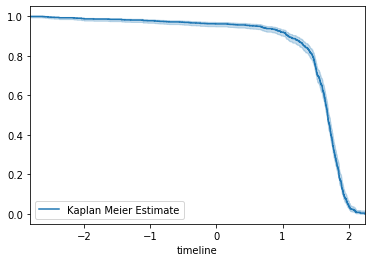

measured median using survival analysis is: 1.680872729514853


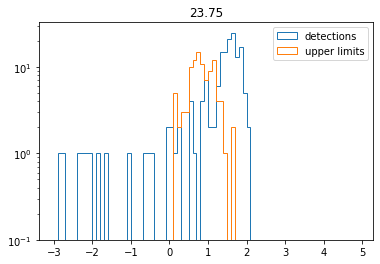

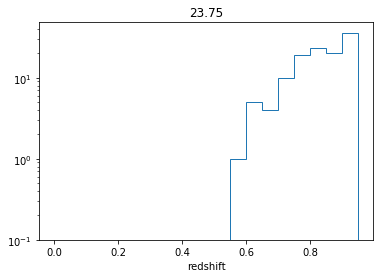

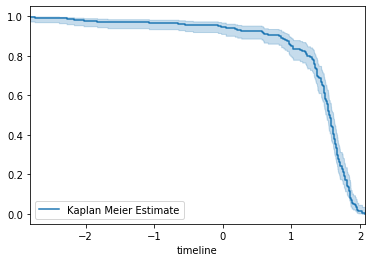

measured median using survival analysis is: 1.5562576104277213


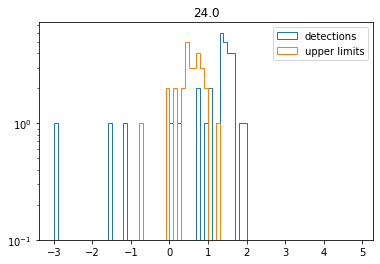

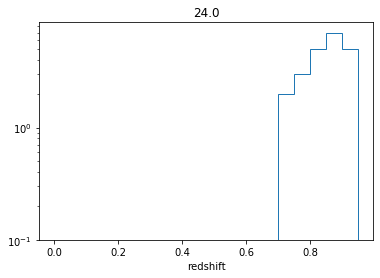

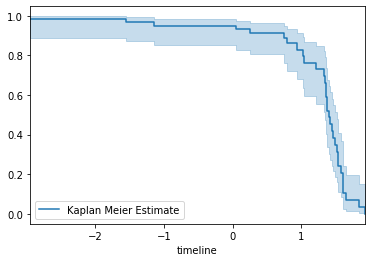

measured median using survival analysis is: 1.4094749081481552


In [314]:
bins_lum = np.arange(21,25,0.25)
lums_center = get_center(bins_lum)

bin_sf = np.digitize(np.log10(lum_rad_sf),bins=bins_lum)
nums_sf,counts = np.unique(bin_sf,return_counts=True)
bin_limit = np.digitize(np.log10(lum_rad_upper),bins=bins_lum)
nums_limit = np.unique(bin_limit)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q_mag = []
mean_lum = []
for n,num in enumerate(nums_sf):
    mask_sf = (bin_sf==num) #& (redshift_all<np.max(redshift))
    mask_limit = (bin_limit==num)
    data = np.append(q_sf[mask_sf],q_lower_limit[mask_limit])
    det = np.append(np.ones(len(q_sf[mask_sf])),np.zeros(len(q_lower_limit[mask_limit])))
    mask = ~np.isinf(data)
    data = data[mask]
    det = det[mask]
    
    #ras_binned.append(ras_all_sf[mask])
    #decs_binned.append(decs_all_sf[mask])
    redshift_binned.append(redshift_sf[mask_sf])
    mean_lum.append(lums_center[n])
    
    if len(data)==0:
        print('no data in luminosity bin')
        mean_q_mag.append(np.nan)
        continue
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_sf[mask_sf],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lower_limit[mask_limit],log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_sf[mask_sf],bins=np.arange(0,1,0.05),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(data, det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q_mag.append(kmf.median_)

mean_q_mag = np.array(mean_q_mag)
mean_lum = np.array(mean_lum)

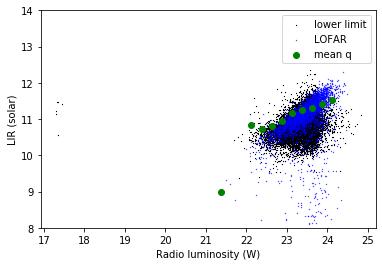

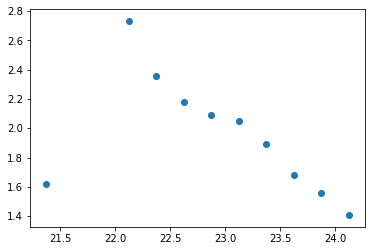

In [315]:
x = np.log10(lum_rad_upper)
y = np.log10(ldust_upper/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='lower limit',c='black')

y = np.log10(lofar_ldust[mask_agn_mass]/3.8E26)
x = np.log10(lum_rad_lofar[mask_agn_mass])
plt.scatter(x,y,s=0.1,label='LOFAR',c='blue')


x = np.array(mean_lum)
y = np.array(mean_q_mag) + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q',c='green')

plt.ylim(8.0,14)
plt.xlabel('Radio luminosity (W)')
plt.ylabel('LIR (solar)')
plt.legend()
plt.show()

x = mean_lum
y = mean_q_mag
plt.scatter(x,y)
plt.show()



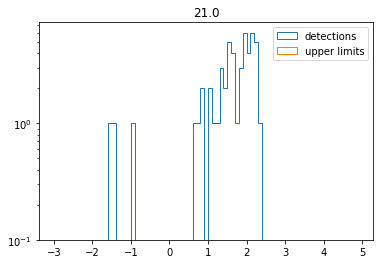

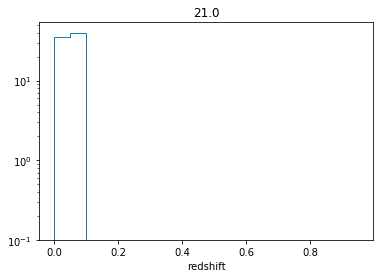

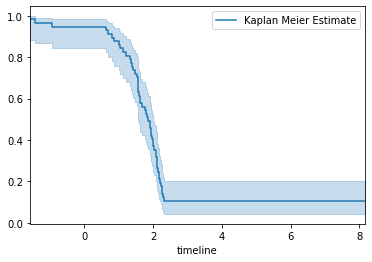

measured median using survival analysis is: 1.8468841757132388


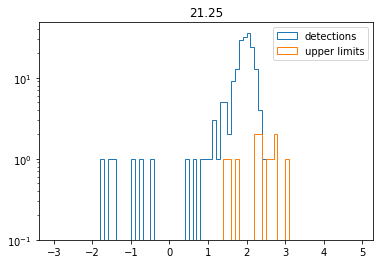

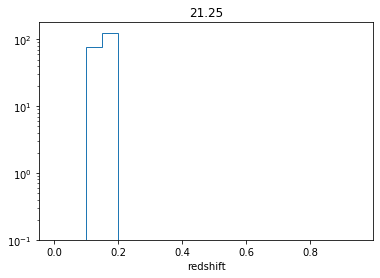

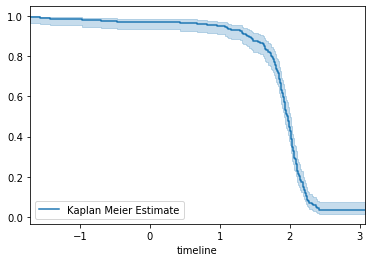

measured median using survival analysis is: 1.9746378684782222


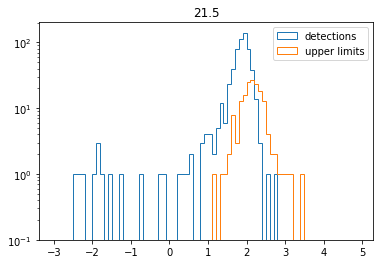

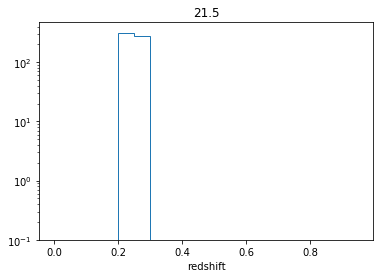

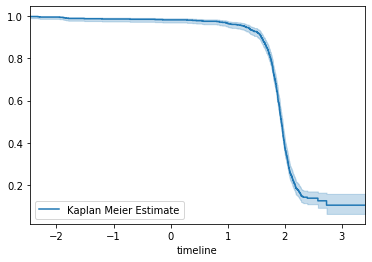

measured median using survival analysis is: 1.9386136936479375


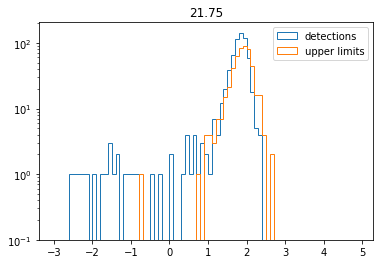

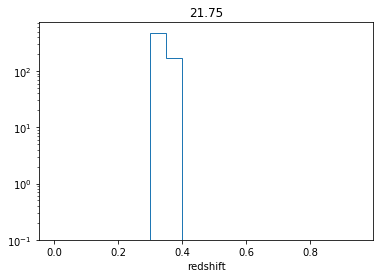

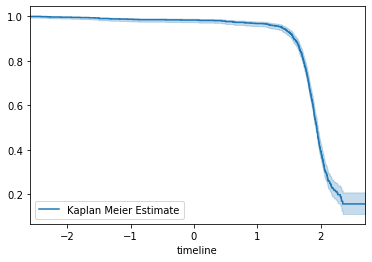

measured median using survival analysis is: 1.936650482425744


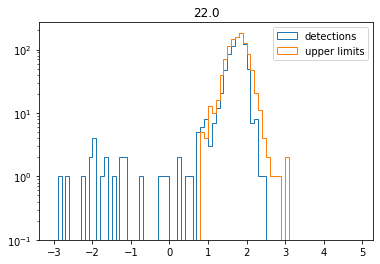

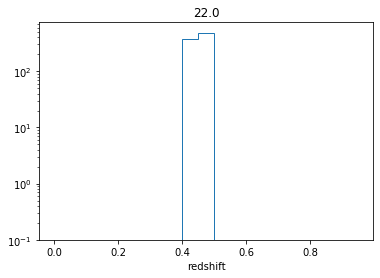

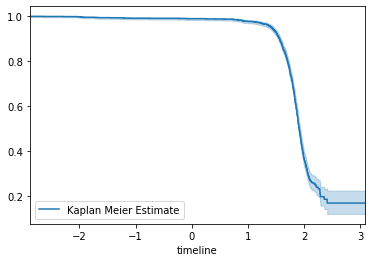

measured median using survival analysis is: 1.9120170750074053


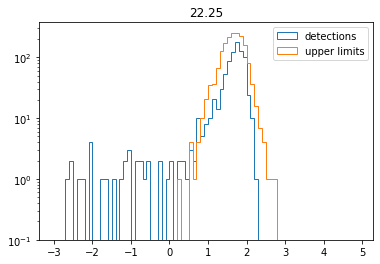

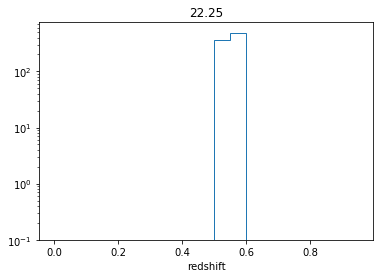

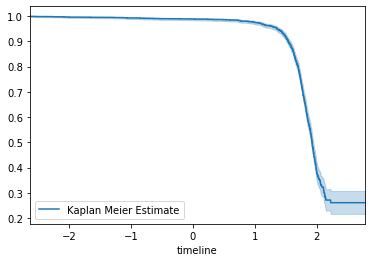

measured median using survival analysis is: 1.9273854802828438


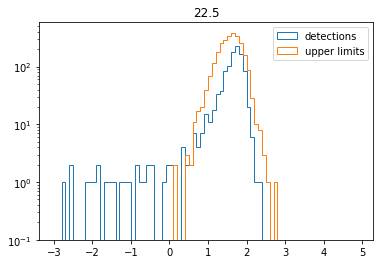

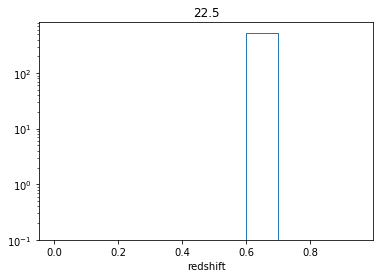

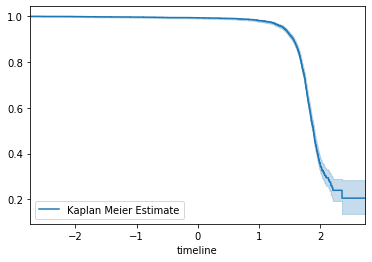

measured median using survival analysis is: 1.8912715630874928


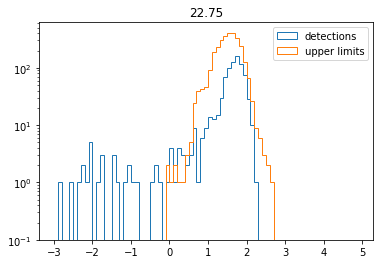

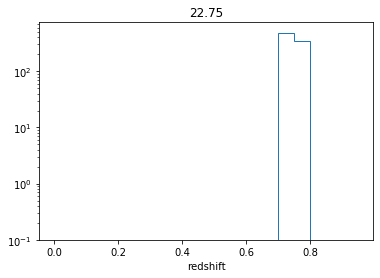

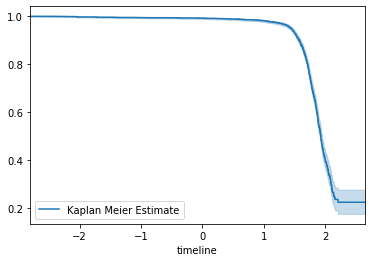

measured median using survival analysis is: 1.9290860860792307


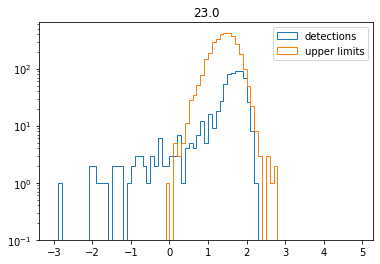

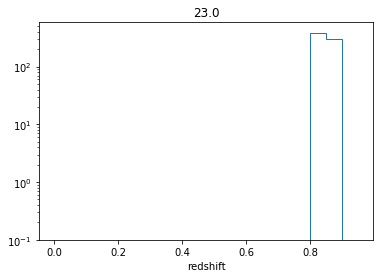

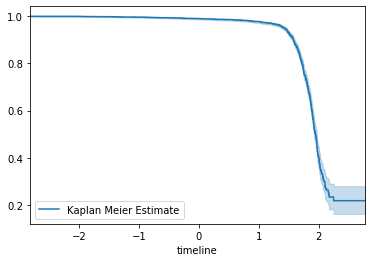

measured median using survival analysis is: 1.9438357417256853


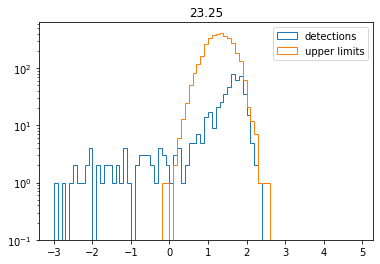

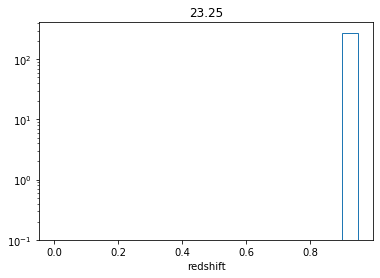

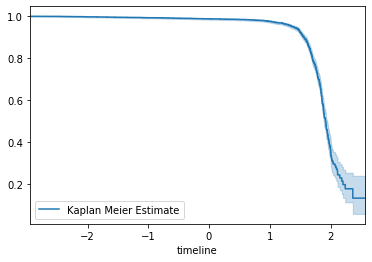

measured median using survival analysis is: 1.918710028816431


In [335]:
bins_z = np.arange(0,1.1,0.1)
z_center = get_center(bins_z)

bin_sf = np.digitize(redshift_sf,bins=bins_z)
nums_sf,counts = np.unique(bin_sf,return_counts=True)
bin_limit = np.digitize(redshift_limit,bins=bins_z)
nums_limit = np.unique(bin_limit)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q_red = []
mean_z = []
for n,num in enumerate(nums_sf):
    mask_sf = (bin_sf==num) #& (redshift_all<np.max(redshift))
    mask_limit = (bin_limit==num)
    data = np.append(q_sf[mask_sf],q_lower_limit[mask_limit])
    det = np.append(np.ones(len(q_sf[mask_sf])),np.zeros(len(q_lower_limit[mask_limit])))
    mask = ~np.isinf(data)
    data = data[mask]
    det = det[mask]
    
    #ras_binned.append(ras_all_sf[mask])
    #decs_binned.append(decs_all_sf[mask])
    redshift_binned.append(redshift_sf[mask_sf])
    mean_z.append(z_center[n])
    
    if len(data)==0:
        print('no data in luminosity bin')
        mean_q_red.append(np.nan)
        continue
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_sf[mask_sf],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lower_limit[mask_limit],log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_sf[mask_sf],bins=np.arange(0,1,0.05),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(data, det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q_red.append(kmf.median_)

mean_q_red = np.array(mean_q_red)
z_center = np.array(z_center)

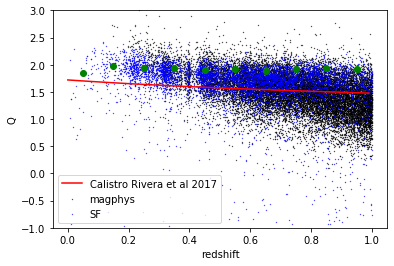

In [336]:
x = redshift_limit
y = q_lower_limit
plt.scatter(x,y,s=0.1,label='magphys',c='black')

x = redshift_sf
y = q_sf
plt.scatter(x,y,s=0.1,label='SF',c='blue')

x = mean_z
y = mean_q_red
plt.scatter(x,y,c='green')

x = np.arange(0,1,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.ylim(-1,3)
plt.xlabel('redshift')
plt.ylabel('Q')
plt.legend()
plt.show()

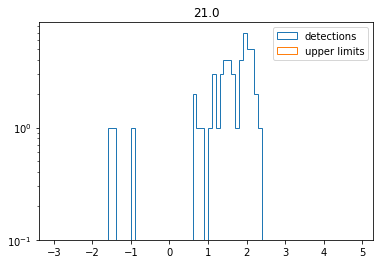

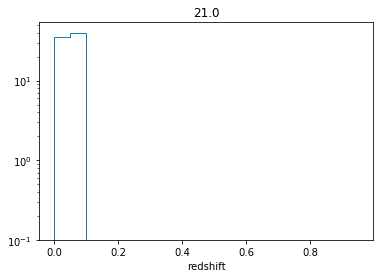

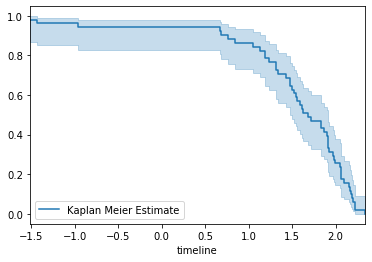

/its/home/im281/.conda/envs/herschelhelp/lib/python3.6/site-packages/lifelines/fitters/kaplan_meier_fitter.py:287: FutureWarning: Please use `median_survival_time_` property instead. Future property `median_` will be removed.
  FutureWarning,


measured median using survival analysis is: 1.6797746793230814


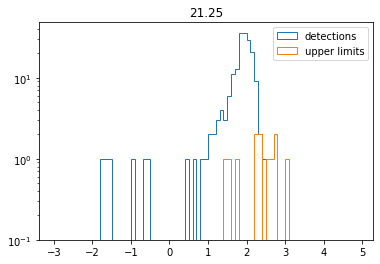

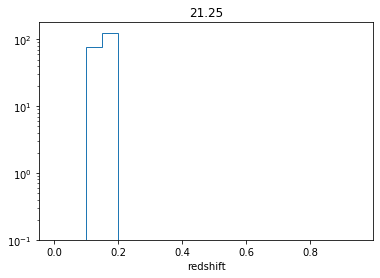

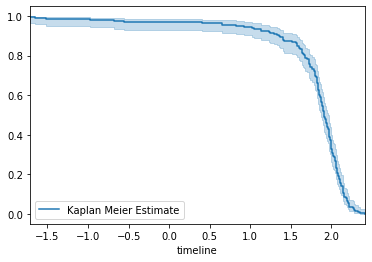

measured median using survival analysis is: 1.9082108218782885


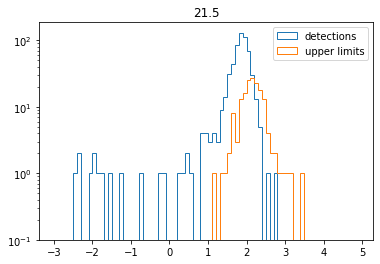

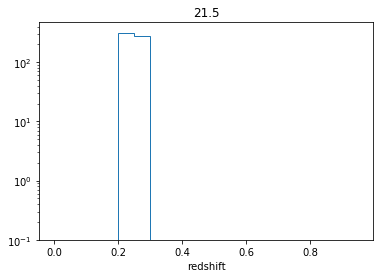

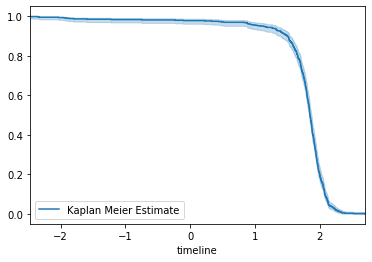

measured median using survival analysis is: 1.850764435130177


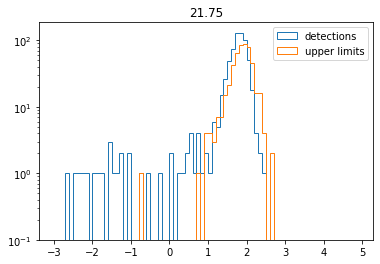

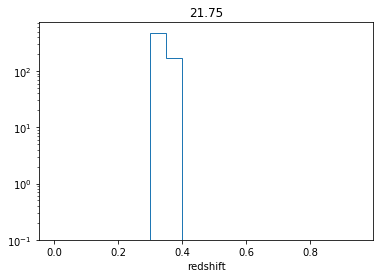

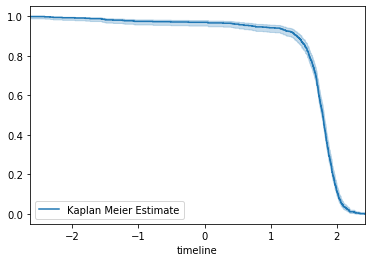

measured median using survival analysis is: 1.7879373357558173


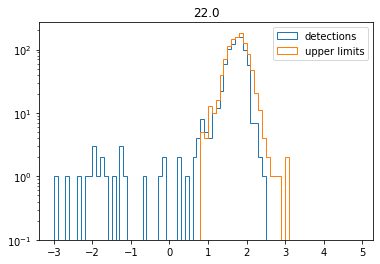

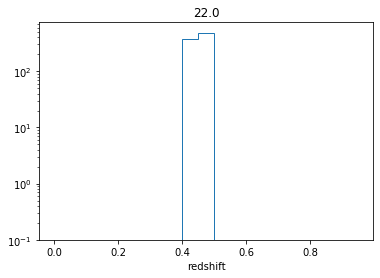

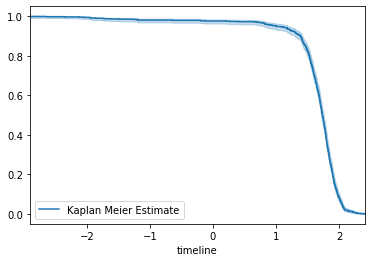

measured median using survival analysis is: 1.7360480746096378


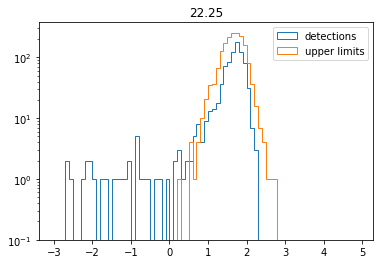

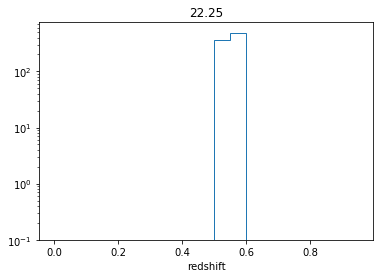

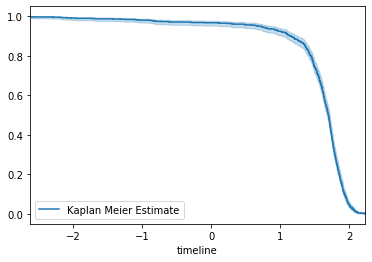

measured median using survival analysis is: 1.6997917688167163


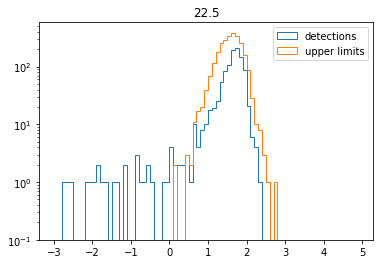

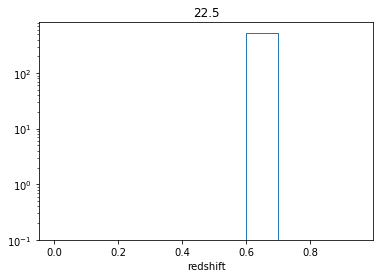

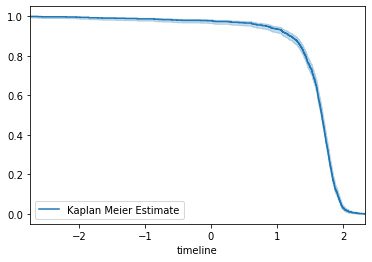

measured median using survival analysis is: 1.6777798302792917


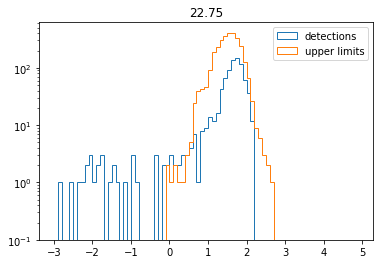

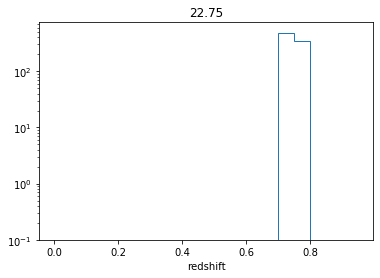

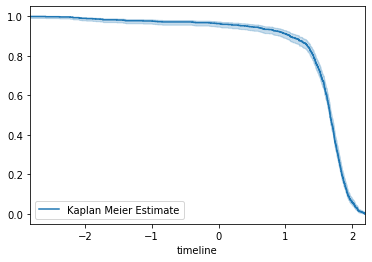

measured median using survival analysis is: 1.669500420164347


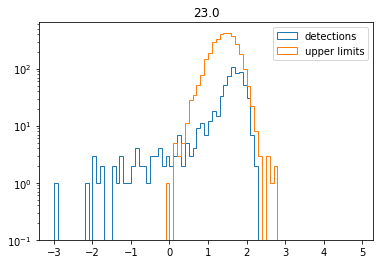

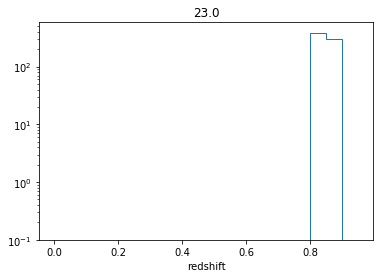

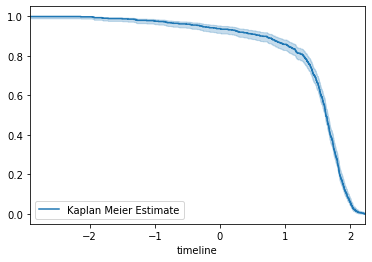

measured median using survival analysis is: 1.6266940360970281


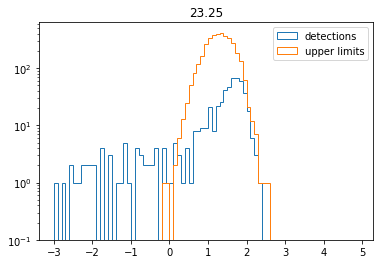

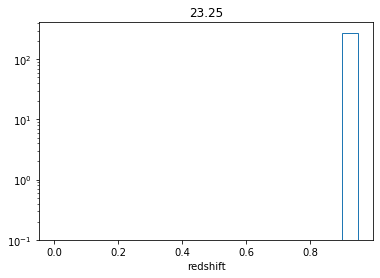

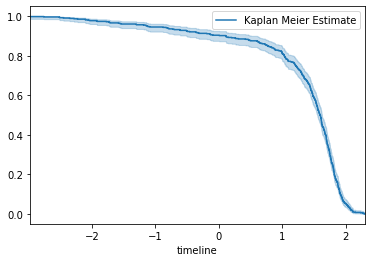

measured median using survival analysis is: 1.593759465746981


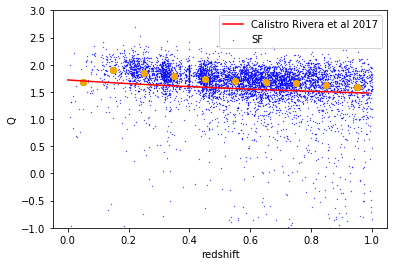

In [459]:
bins_z = np.arange(0,1.1,0.1)
z_center = get_center(bins_z)

bin_sf = np.digitize(redshift_sf,bins=bins_z)
nums_sf,counts = np.unique(bin_sf,return_counts=True)
bin_limit = np.digitize(redshift_limit,bins=bins_z)
nums_limit = np.unique(bin_limit)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q_red = []
median_q_red = []
mean_z = []
for n,num in enumerate(nums_sf):
    mask_sf = (bin_sf==num) #& (redshift_all<np.max(redshift))
    mask_limit = (bin_limit==num)
    data = q_sf[mask_sf]
    det = np.ones(len(q_sf[mask_sf]))
    mask = ~np.isinf(data)
    data = data[mask]
    det = det[mask]
    
    #ras_binned.append(ras_all_sf[mask])
    #decs_binned.append(decs_all_sf[mask])
    redshift_binned.append(redshift_sf[mask_sf])
    mean_z.append(z_center[n])
    
    if len(data)==0:
        print('no data in luminosity bin')
        mean_q_red.append(np.nan)
        continue
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_sf[mask_sf],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lower_limit[mask_limit],log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_sf[mask_sf],bins=np.arange(0,1,0.05),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(data, det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q_red.append(kmf.median_)
    median_q_red.append(np.median(data))

median_q_red = np.array(median_q_red)    
mean_q_red = np.array(mean_q_red)
z_center = np.array(z_center)


x = redshift_sf
y = q_sf
plt.scatter(x,y,s=0.1,label='SF',c='blue')

x = mean_z
y = mean_q_red
plt.scatter(x,y,c='green')

x = np.arange(0,1,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.ylim(-1,3)
plt.xlabel('redshift')
plt.ylabel('Q')
plt.legend()
plt.show()

In [467]:
np.max(q)

nan

(-1, 3)

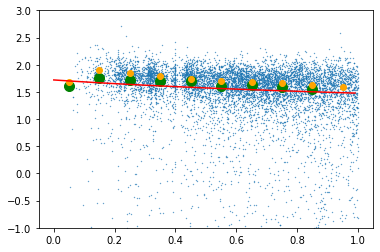

In [475]:
mask = (lofar_sed['Z_BEST']<1.0) & (lofar_sed['Mass_median']>10.5) & (~np.isnan(lofar_sed['q150']))
z = lofar_sed['Z_BEST'][mask]
q = lofar_sed['q150'][mask]

plt.scatter(z,q,s=0.1)

medians = scipy.stats.binned_statistic(z,q,'median',bins=np.arange(0,1,0.1)).statistic
x = get_center(np.arange(0,1,0.1))
plt.scatter(x,medians,s=100,c='green')

x = mean_z
y = mean_q_red
plt.scatter(x,y,c='orange')

x = np.arange(0,1,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.ylim(-1,3)

In [472]:
medians.statistic

array([1.60211421, 1.74750198, 1.72422942, 1.70247862, 1.69140169,
       1.60990123, 1.61821144, 1.5992531 , 1.54650808])

1542
810


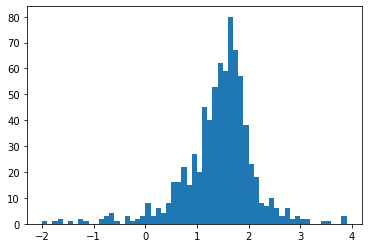

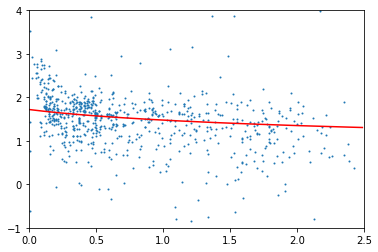

In [447]:
## check code with the Calistro et al 2017 data

calistro_table = Table.read('../lofar/deep_fields/Bootes/data/CR17_LOFARpaper_alldata.fits')
print(len(calistro_table))
z = calistro_table['z_HB']
dist = cosmo.luminosity_distance(z).to(u.m).value

lir = calistro_table['LFIR_e']-7 #convert from erg/s to W

flux = calistro_table['LOFARtotflux']

alpha = -0.73
radlum = lum_rad_lofar = flux*4*np.pi*dist**2 * 1E-26 * (1+z)**(-1-alpha)

q = lir-np.log10(3.75E12) - np.log10(radlum)

mask = (calistro_table['LTO_e']/calistro_table['LSB_e'])<1
print(np.sum(mask))

plt.hist(q[mask],bins=np.arange(-2,4,0.1))
plt.show()


plt.scatter(z[mask],q[mask],s=1)

x = np.arange(0,2.5,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.xlim(0,2.5)
plt.ylim(-1,4)
plt.show()

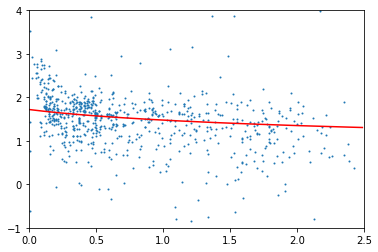

In [453]:
#calculate FIR luminosities and radio luminsoities

calistro_table = Table.read('../lofar/deep_fields/Bootes/data/CR17_LOFARpaper_alldata.fits')

#get Ldust from SED fits for LOFAR sources
lofar_ldust = calistro_table['LFIR_e']-7

 
mask_agn_mass = (calistro_table['LTO_e']/calistro_table['LSB_e'])<1
lofar_ldust = lofar_ldust[mask_agn_mass]




#radio luminosities for the LOFAR sources
radio_flux = calistro_table['LOFARtotflux'][mask_agn_mass]

redshift = calistro_table['z_HB'][mask_agn_mass]

dist = cosmo.luminosity_distance(redshift).to(u.m).value

alpha=-0.73

lum_rad_lofar = radio_flux*4*np.pi*dist**2 * 1E-26 * (1+redshift)**(-1-alpha)
#mask out nan luminosities caused by radio sources with no redshift
mask = (~np.isnan(redshift)) & (~np.isnan(lofar_ldust))
lum_rad_lofar = lum_rad_lofar[mask]
lofar_ldust = lofar_ldust[mask]

#create the joint LOFAR, HELP radio luminosity array
lum_rad_sf = lum_rad_lofar

#create the arrays for the ldust measurements
ldust_sf = lofar_ldust

#create arrays for the q values for sf, agn and the radio non detections
q_sf = ldust_sf - np.log10(3.75E12) - np.log10(lum_rad_sf)


plt.scatter(redshift,q_sf,s=1)

x = np.arange(0,2.5,0.01)
y = calistro_fit(x)
plt.plot(x,y,c='red',label='Calistro Rivera et al 2017')

plt.xlim(0,2.5)
plt.ylim(-1,4)
plt.show()

## Calculate the FIRC for all sources that have a stellar mass above some limit using CIGALE

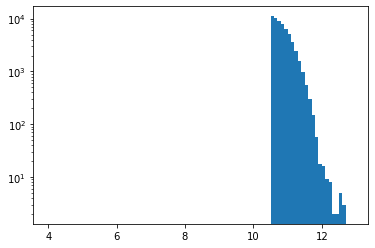

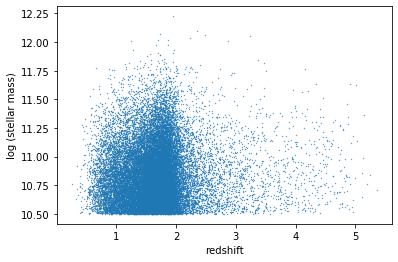

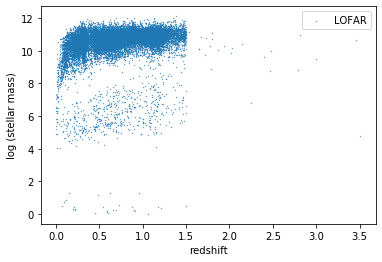

In [204]:
#look at the stellar mass distribution to decide on where to put the limit
data = joined_cigale_lofar_mstar['Mass_median']
bins = np.arange(4,13,0.1)
plt.hist(data,log=True,bins=bins)

plt.show()

x = joined_cigale_lofar_mstar['bayes.universe.redshift']
y = joined_cigale_lofar_mstar['Mass_median']
plt.scatter(x,y,s=0.1,label='HELP')
plt.xlabel('redshift')
plt.ylabel('log (stellar mass)')
plt.show()

x = lofar_sed['z1_median']
y = lofar_sed['Mass_median']
plt.scatter(x,y,s=0.1,label='LOFAR')
plt.xlabel('redshift')
plt.ylabel('log (stellar mass)')
plt.legend()
plt.show()

In [205]:
lofar_sed_volume_mask = (lofar_sed['z1_median']<1.0) & (lofar_sed['Mass_median']>10.5)
print(np.sum(lofar_sed_volume_mask))
cigale_sed_volume_mask = (joined_cigale_lofar_mstar['bayes.universe.redshift']<1.0) & (joined_cigale_lofar_mstar['Mass_median']>10.5)
print(np.sum(cigale_sed_volume_mask))

8183
2521


In [328]:
uniq_ras,counts = np.unique(ras,return_counts=True)
ind = np.argmax(counts)
common_ra = uniq_ras[ind]
common_ra

masked

In [332]:
ras.mask

array([ True, False, False, ...,  True,  True,  True])

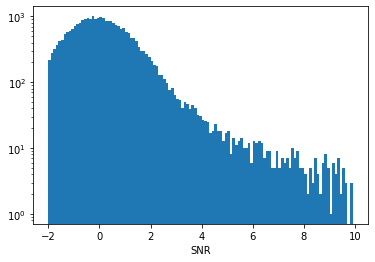

In [333]:
#snr = radim_data/radim_err
#plt.hist(snr,bins=np.arange(-2,10,0.1),log=True)

#Calculate upper limits on the radio flux from the LOFAR image for the HELP objects
mask = (joined_cigale_lofar_mstar['Z_BEST']<1.0) & (joined_cigale_lofar_mstar['Mass_median']>10.5)
mask = ~joined_cigale_lofar_mstar['ra'].mask
ras = joined_cigale_lofar_mstar['ra'][mask]
decs = joined_cigale_lofar_mstar['dec'][mask]

x,y = np.round(radim_wcs.wcs_world2pix(ras,decs,0,ra_dec_order=True),0).astype(int)
rad_flux = radim_data[x,y]
#rad_flux = np.array([np.max(radim_data[x[n]-5:x[n]+4,y[n]-5:y[n]+4]) for n in range(len(x))])
#flux_index = np.array([np.argmax(radim_data[x[n]-5:x[n]+4,y[n]-5:y[n]+4]) for n in range(len(x))])

x,y = np.round(radim_wcs_err.wcs_world2pix(ras,decs,0,ra_dec_order=True),0).astype(int)
rad_errs = radim_err[x,y]
#rad_errs = np.array([(radim_err[x[n]-5:x[n]+4,y[n]-5:y[n]+4].flatten()[flux_index[n]]) for n in range(len(x))])
rad_upper_lims = rad_errs*5



SNR = rad_flux/rad_errs
bins = np.arange(-2,10,0.1)
plt.hist(SNR,bins=bins,log=True)

plt.xlabel('SNR')
plt.show()

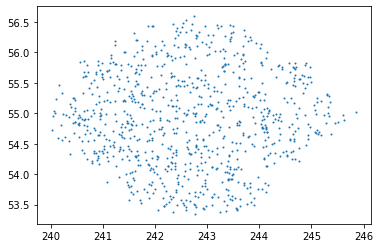

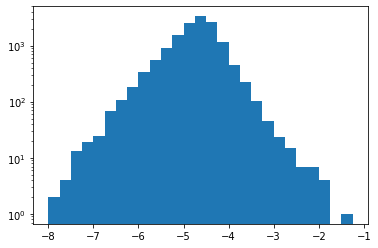

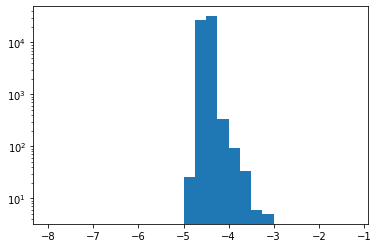

In [289]:
bins = np.arange(-2,10,0.1)
bins_in = np.digitize(SNR,bins=bins)
uniq,counts = np.unique(bins_in,return_counts=True)
ind = np.argmax(counts)
mask = bins_in==ind
x = ras[mask]
y = decs[mask]
plt.scatter(x,y,s=1)
plt.show()

plt.hist(np.log10(rad_flux),bins=np.arange(-8,-1,0.25),log=True)
plt.show()

plt.hist(np.log10(rad_errs),bins=np.arange(-8,-1,0.25),log=True)
plt.show()

In [319]:
#calculate FIR luminosities and radio luminsoities

#get Ldust from SED fits for LOFAR sources
ldust_colnames = ['Ldust_best']
ldust_err_colnames = ['Ldust_sigma']
sed_fitters = ['magphys']
lofar_ldust,lofar_ldust_err = get_best_ldust(lofar_sed,ldust_colnames,ldust_err_colnames,sed_fitters)

mask_lofar_mass = (lofar_sed['Z_BEST']<1.0) & (lofar_sed['Mass_median']>10.5)
ras_lofar = lofar_sed['RA'][mask_lofar_mass]
decs_lofar = lofar_sed['DEC'][mask_lofar_mass]
lofar_ldust = lofar_ldust[mask_lofar_mass]
lofar_ldust_err = lofar_ldust_err[mask_lofar_mass]

#add in the ldust measurments from CIGALE for HELP sources
mask_help_mass = (joined_cigale_lofar_mstar['bayes.universe.redshift']<1.0) & (joined_cigale_lofar_mstar['Mass_median']>10.5)
help_ldust = joined_cigale_lofar_mstar['bayes.dust.luminosity'][mask_help_mass]
help_ldust_err = joined_cigale_lofar_mstar['bayes.dust.luminosity_err'][mask_help_mass]
ras_help = joined_cigale_lofar_mstar['ra'][mask_help_mass]
decs_help = joined_cigale_lofar_mstar['dec'][mask_help_mass]
mstar_help = joined_cigale_lofar_mstar['Mass_median'][mask_help_mass]

#radio luminosities for the LOFAR sources
radio_flux = lofar_sed['Peak_flux'][mask_lofar_mass]
radio_flux_err = lofar_sed['E_Peak_flux'][mask_lofar_mass]

redshift = lofar_sed['Z_BEST'][mask_lofar_mass]
mask = redshift<=0
redshift[mask] = 0.001

dist = cosmo.luminosity_distance(redshift).to(u.m).value

alpha=-0.73

lum_rad_lofar = radio_flux*4*np.pi*dist**2 * 1E-26 * (1+redshift)**(-1-alpha)
#mask out nan luminosities caused by radio sources with no redshift
mask = (~np.isnan(redshift)) & (~np.isnan(lofar_ldust))
mstar_lofar = lofar_sed['Mass_median'][mask_lofar_mass][mask]
lum_rad_lofar = lum_rad_lofar[mask]
lofar_ldust = lofar_ldust[mask]
ras_lofar = ras_lofar[mask]
decs_lofar = decs_lofar[mask]

#radio luminosties for the HELP sources
redshift_help = joined_cigale_lofar_mstar['bayes.universe.redshift'][mask_help_mass]
mask = redshift_help<=0
redshift_help[mask] = 0.001

dist = cosmo.luminosity_distance(redshift_help).to(u.m).value

alpha=-0.8

lum_rad_upper = rad_upper_lims[mask_help_mass]*4*np.pi*dist**2 * 1E-26 * (1+redshift_help)**(-1-alpha)

#create the joint LOFAR, HELP radio luminosity array
lum_rad = np.append(lum_rad_lofar.data.data,lum_rad_upper)
#convert the radio luminosities to watts from Janskys
#lum_rad = lum_rad/1E26

#create a joint ldust array
ldust = np.append(lofar_ldust,help_ldust)
ldust_err = np.append(lofar_ldust_err,help_ldust_err)

#set flags for detection in the radio map

#all the lum_rad_lofar sources are detected and all the HELP sources are not detected
det_radio = np.append(np.ones(len(lum_rad_lofar)),np.zeros(len(lum_rad_upper)))

ras_all = np.append(ras_lofar.data.data,ras_help.data.data)
decs_all = np.append(decs_lofar.data.data,decs_help.data.data)
redshift_all = np.append(redshift.data.data,redshift_help.data.data)
mstar_all = np.append(mstar_lofar,mstar_help)

You can see that there is a huge difference in the redshift distributions of the detections compared to the upper limits. The majority of these high redhsift sources have high IR luminosities. Therefore if i restrict the upper limits to be in the same redshift range as the detections you get problems of estimating Q for the highest radio luminsity bins and you have imposed a artifical cutoff in Q by restricting the redshift space. This correlation could be due to CIGALE not allowing for extreme temperatures. So rather than fitting a hot/cold galaxy at low.high redshift it just assigns a more typical temperture and then fits the redshift to match that temperature. 

I will try matching the CIGALE sources to the radio sources with a NN crossmatch and see if changing the redshift for either the radio or FIR source will get a better Q value.

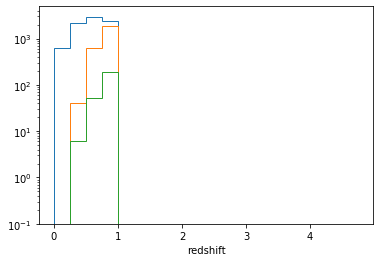

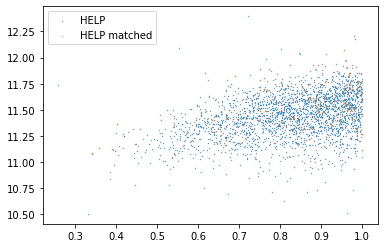

In [226]:
lofar_coords = SkyCoord(ra=ras_lofar*u.degree,dec=decs_lofar*u.degree)
help_coords = SkyCoord(ra=ras_help,dec=decs_help)

idx,d2d,_ = help_coords.match_to_catalog_sky(lofar_coords)

mask = d2d.value*3600<18
bins = np.arange(0,5,0.25)

plt.hist(redshift,bins=bins,log=True,histtype='step',label='LOFAR')
plt.hist(redshift_help,bins=bins,log=True,histtype='step',label='HELP')
plt.hist(redshift_help[mask],bins=bins,log=True,histtype='step',label='HELP matched')
plt.xlabel('redshift')
plt.show()

x = redshift_help
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP')
x = redshift_help[mask]
y = np.log10(help_ldust[mask]/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP matched')
plt.legend()
plt.show()

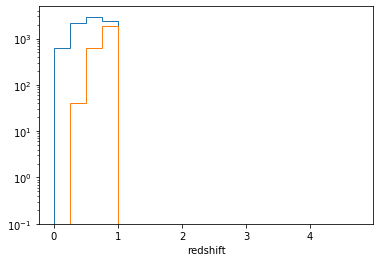

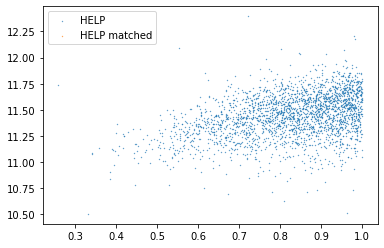

In [227]:
mask_ldust = np.log10(help_ldust/3.8E26)>12.5
lofar_coords = SkyCoord(ra=ras_lofar*u.degree,dec=decs_lofar*u.degree)
help_coords = SkyCoord(ra=ras_help[mask_ldust],dec=decs_help[mask_ldust])

idx,d2d,_ = help_coords.match_to_catalog_sky(lofar_coords)

mask = d2d.value*3600<18
bins = np.arange(0,5,0.25)

plt.hist(redshift,bins=bins,log=True,histtype='step',label='LOFAR')
plt.hist(redshift_help,bins=bins,log=True,histtype='step',label='HELP')
plt.hist(redshift_help[mask_ldust],bins=bins,log=True,histtype='step',label='HELP matched')
plt.xlabel('redshift')
plt.show()

x = redshift_help
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP')
x = redshift_help[mask_ldust][mask]
y = np.log10(help_ldust[mask_ldust][mask]/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP matched')
plt.legend()
plt.show()

measured median from the detections is: 1.8854715510079085
measured median using survival analysis is: 1.9343517515311106


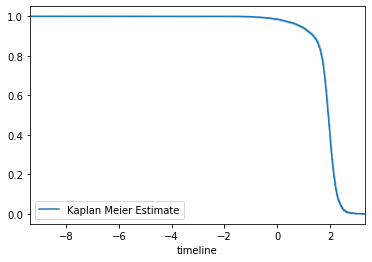

median q = -24.6454318450857


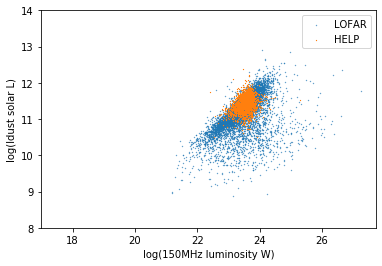

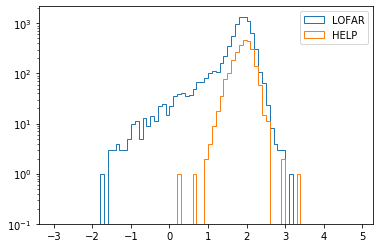

In [320]:
q = np.log10(ldust/3.75E12) - np.log10(lum_rad)
mask = ~np.isinf(q)
const = np.max(q)
#q = const - q
#q_lim = const - q_lim

data = q[mask]
#data[flag_detected] = q_lim[flag_detected]
det = det_radio[mask]
print('measured median from the detections is: {}'.format(np.median(data)))

kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(data, det,label='Kaplan Meier Estimate')

## Create an estimate
print('measured median using survival analysis is: {}'.format(kmf.median_))
kmf.plot()
plt.show()

print('median q = {}'.format(kmf.median_-np.log10(3.8E26)))

y = np.log10(lofar_ldust/3.8E26)
x = np.log10(lum_rad_lofar)
plt.scatter(x,y,s=0.1,label='LOFAR')

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='HELP')

plt.xlabel('log(150MHz luminosity W)')
plt.ylabel('log(ldust solar L)')
plt.ylim(8.0,14)
plt.legend()
plt.show()

bins = np.arange(-3,5,0.1)
q_lofar = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
plt.hist(q_lofar,log=True,label='LOFAR',bins=bins,histtype='step')

q_help = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.hist(q_help,log=True,label='HELP',bins=bins,histtype='step')
plt.legend()
plt.show()

## Examine median Q for different luminosity bins to see if the FIRC isn't linear

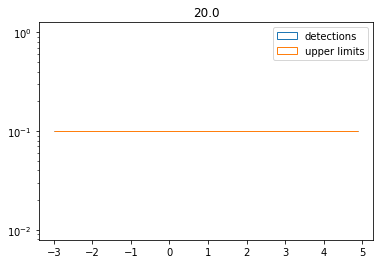

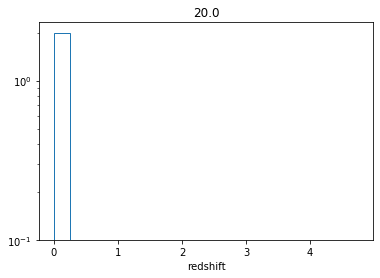

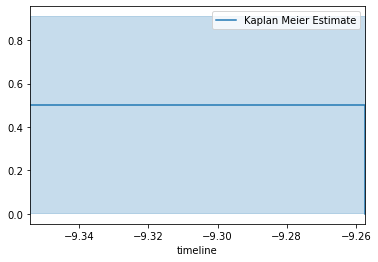

measured median using survival analysis is: -9.354134682627235


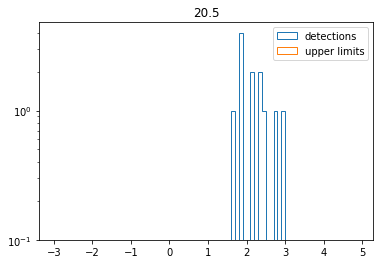

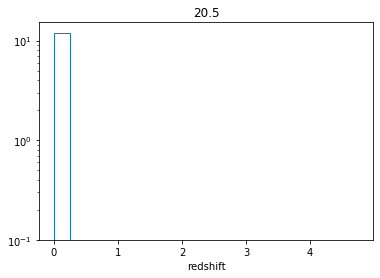

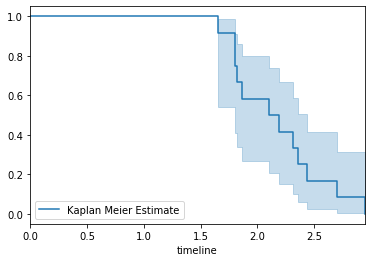

measured median using survival analysis is: 2.1047446353145034


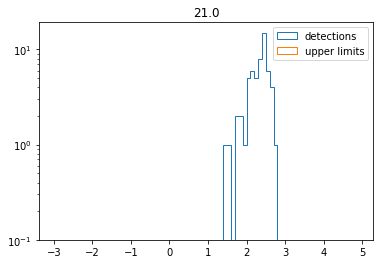

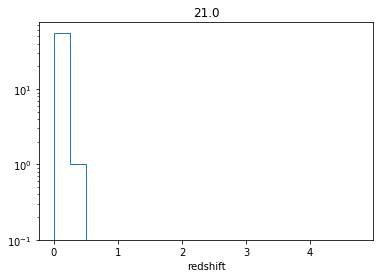

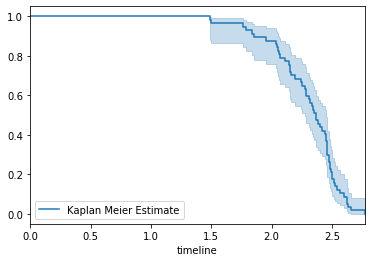

measured median using survival analysis is: 2.367992619312041


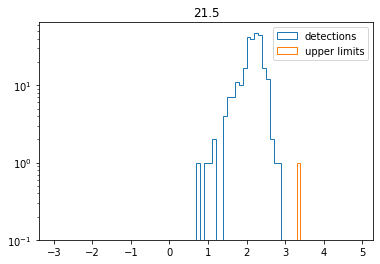

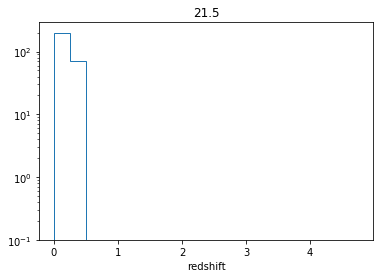

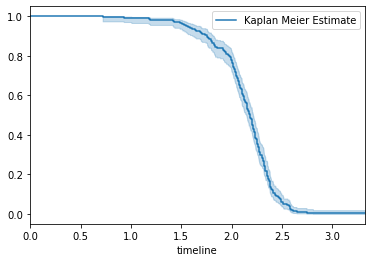

measured median using survival analysis is: 2.1790811608389653


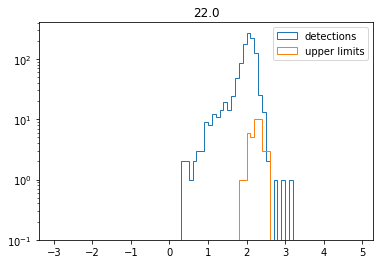

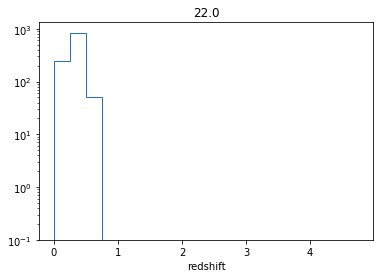

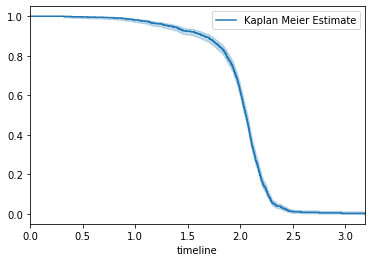

measured median using survival analysis is: 2.0545917468592556


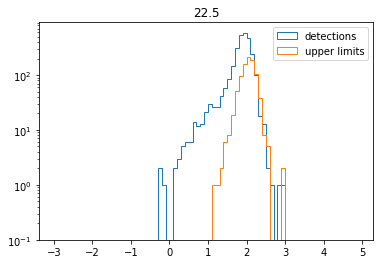

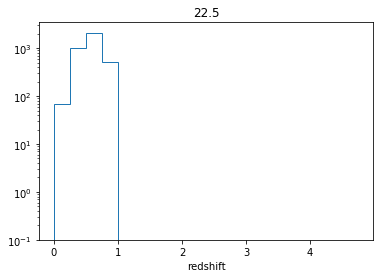

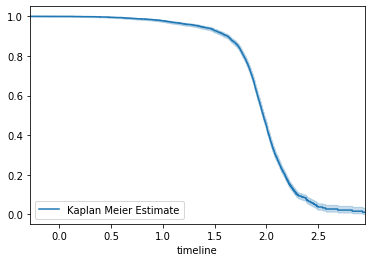

measured median using survival analysis is: 1.9687966633758158


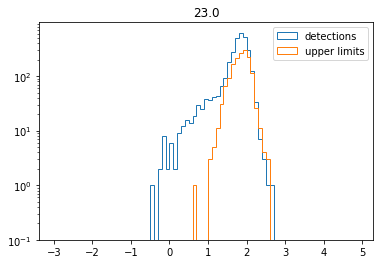

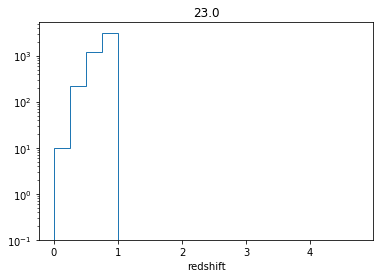

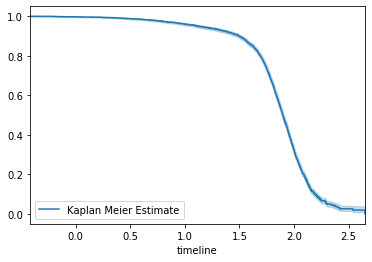

measured median using survival analysis is: 1.896799875026307


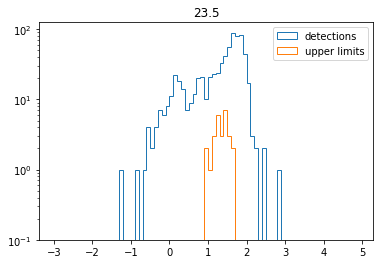

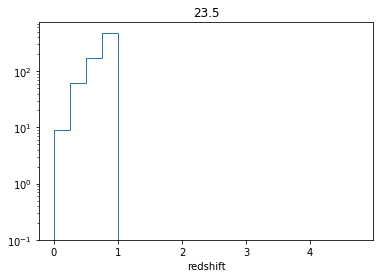

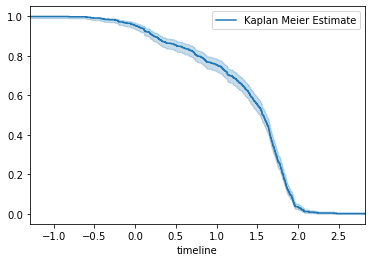

measured median using survival analysis is: 1.5684226715361191


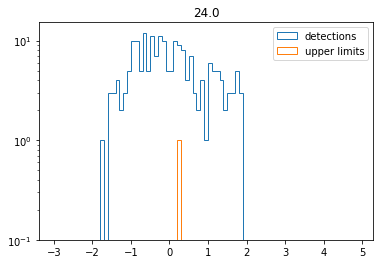

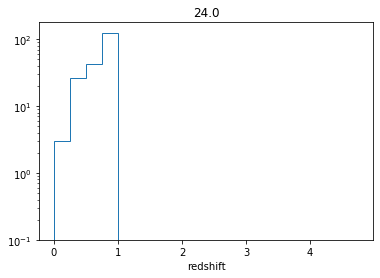

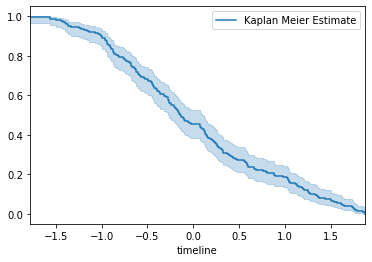

measured median using survival analysis is: -0.137794522644473


In [321]:
bins_lum = np.arange(20,25,0.5)

test = np.digitize(np.log10(lum_rad),bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q_cig = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all[mask])
    decs_binned.append(decs_all[mask])
    redshift_binned.append(redshift_all[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all[mask],bins=np.arange(0,5,0.25),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q_cig.append(kmf.median_)

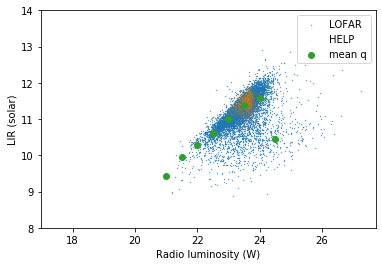

In [322]:
y = np.log10(lofar_ldust/3.8E26)
x = np.log10(lum_rad_lofar)
plt.scatter(x,y,s=0.1,label='LOFAR')

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='HELP',alpha=0.1)

x = np.arange(20,25,0.5)[nums-1]
y = mean_q_cig + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q')

plt.ylim(8.0,14)
plt.xlabel('Radio luminosity (W)')
plt.ylabel('LIR (solar)')
plt.legend()
plt.show()

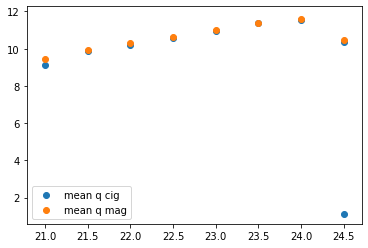

In [324]:
#Compare Mag and Cig

x = np.arange(20,25,0.5)[nums-1]
y = mean_q_cig + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q cig')

x = np.arange(20,25,0.5)[nums-1]
y = mean_q_mag + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q mag')

plt.legend()
plt.show()

### Look at the redshift evolution

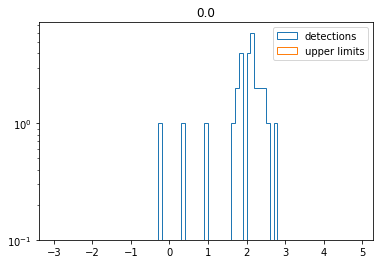

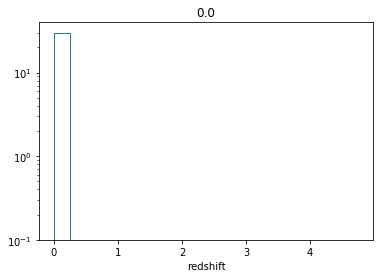

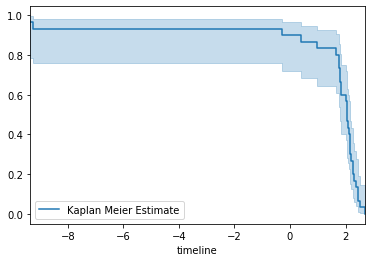

measured median using survival analysis is: 2.0494349705761934


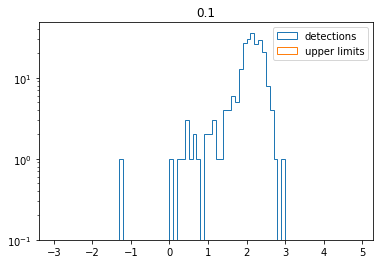

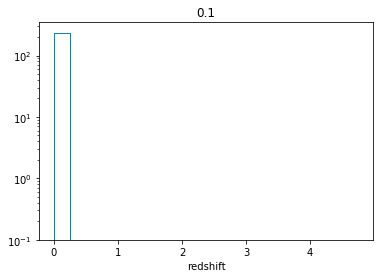

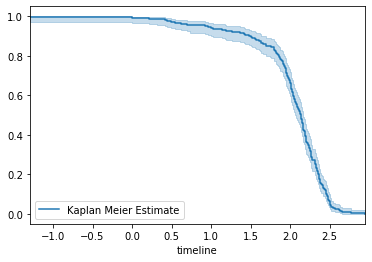

measured median using survival analysis is: 2.1346052466516383


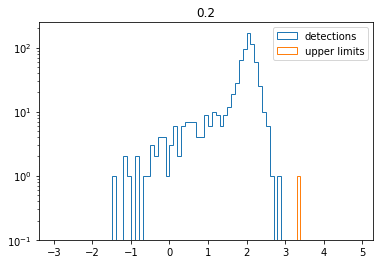

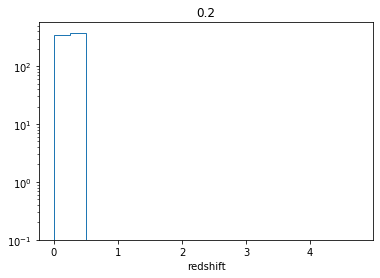

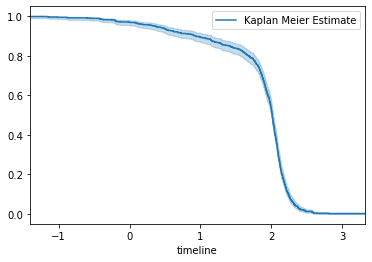

measured median using survival analysis is: 2.014825868619514


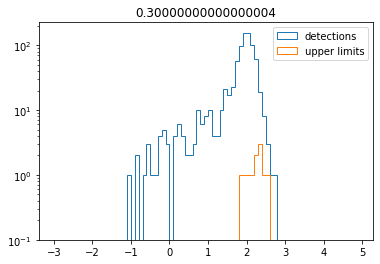

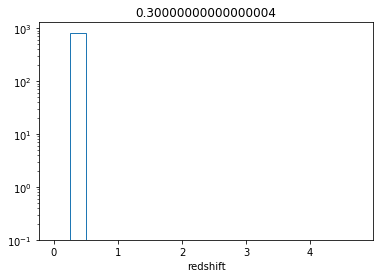

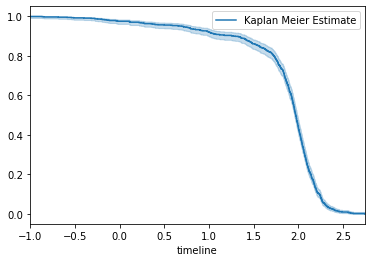

measured median using survival analysis is: 1.9698286588515401


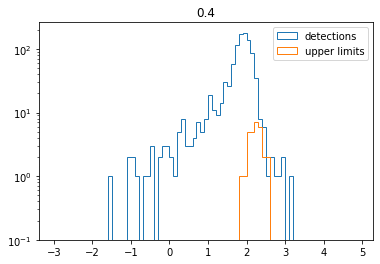

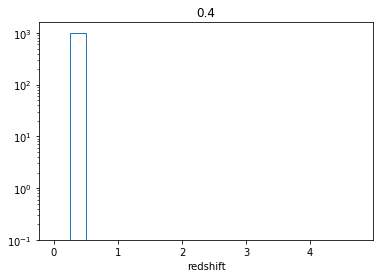

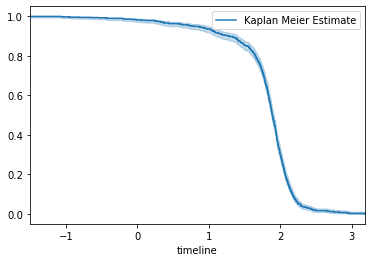

measured median using survival analysis is: 1.8901760139964203


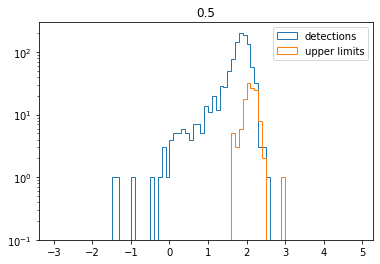

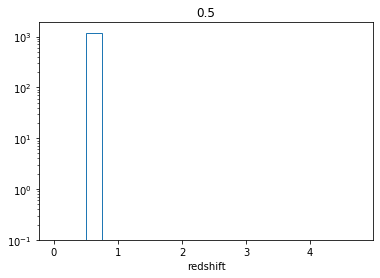

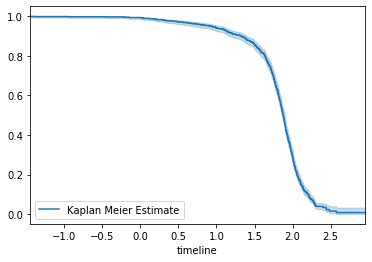

measured median using survival analysis is: 1.8776510715822425


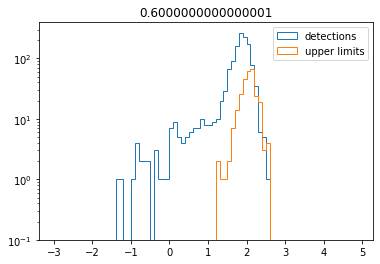

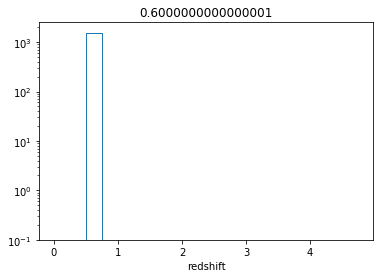

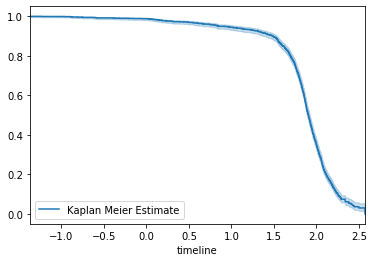

measured median using survival analysis is: 1.9054477911066385


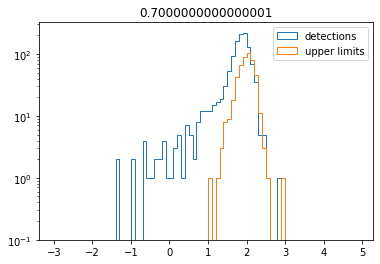

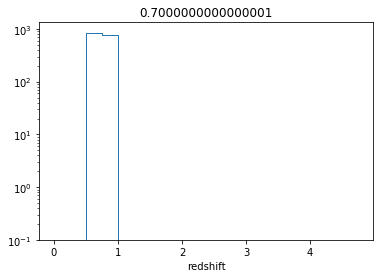

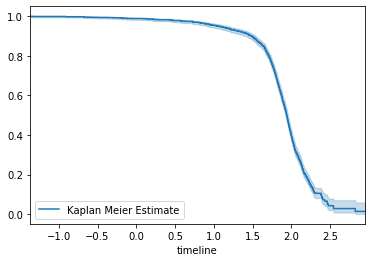

measured median using survival analysis is: 1.9397956996841756


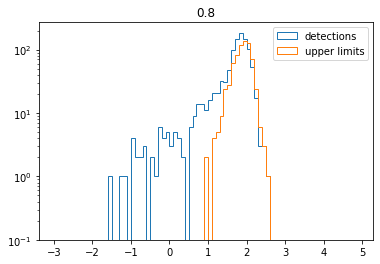

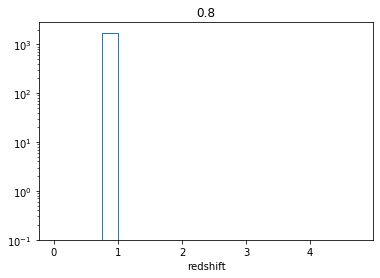

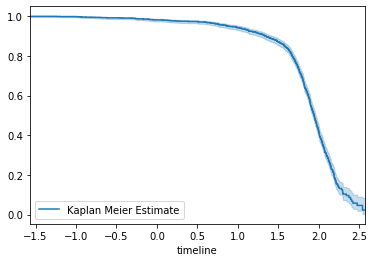

measured median using survival analysis is: 1.943529059517104


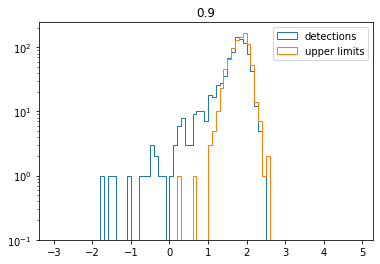

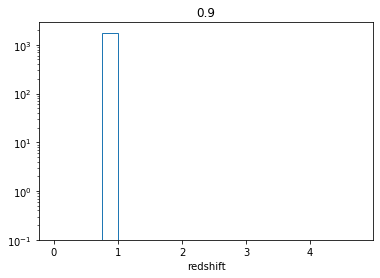

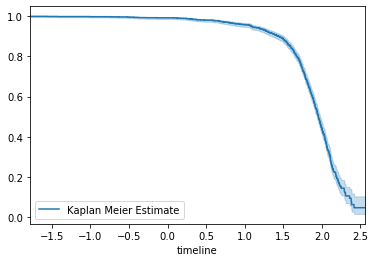

measured median using survival analysis is: 1.9556078913809003


In [138]:
bins_lum = np.arange(0,1.0,0.1)

test = np.digitize(redshift_all,bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all[mask])
    decs_binned.append(decs_all[mask])
    redshift_binned.append(redshift_all[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all[mask],bins=np.arange(0,5,0.25),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q.append(kmf.median_)

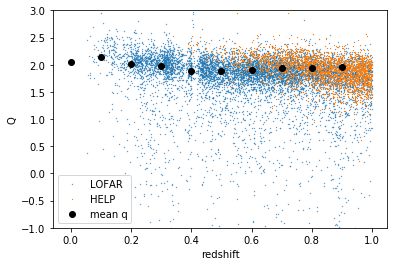

In [139]:
y = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
x = redshift
plt.scatter(x,y,s=0.1,label='LOFAR')

x = redshift_help
y = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.scatter(x,y,s=0.1,marker='^',label='HELP')

x = np.arange(0.0,1.0,0.1)[nums-1]
y = mean_q
plt.scatter(x,y,label='mean q',c='black')

plt.ylim(-1,3)
plt.xlabel('redshift')
plt.ylabel('Q')
plt.legend()
plt.show()

### Look at the FIRC as a function of Mstar

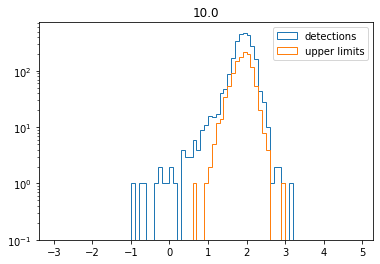

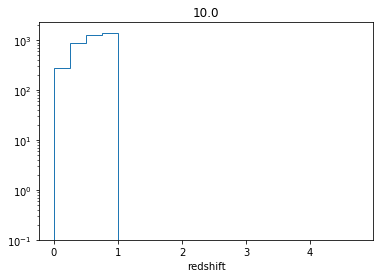

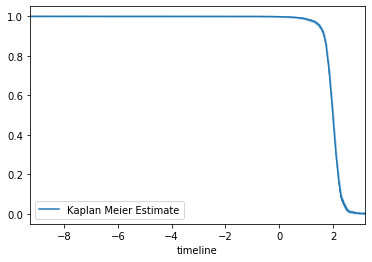

measured median using survival analysis is: 1.9943963193033731


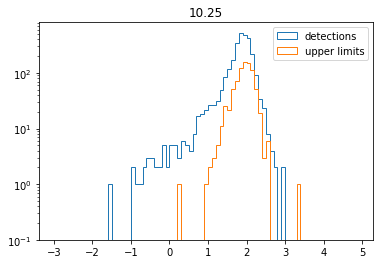

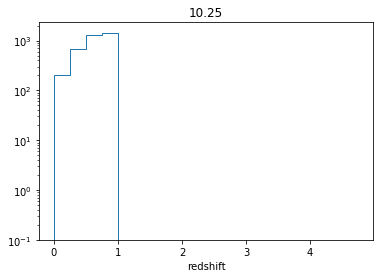

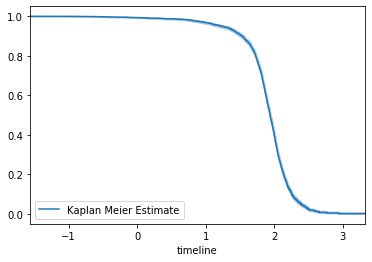

measured median using survival analysis is: 1.9397667140685364


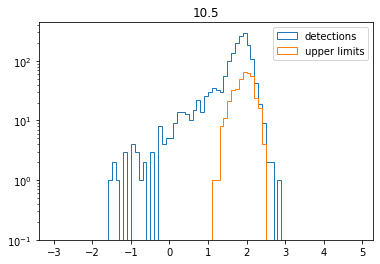

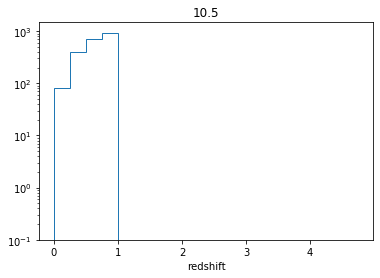

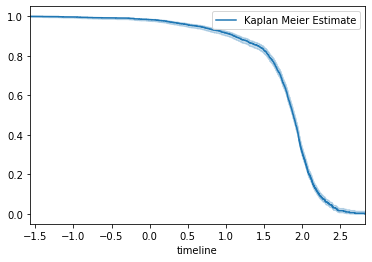

measured median using survival analysis is: 1.8835381757405045


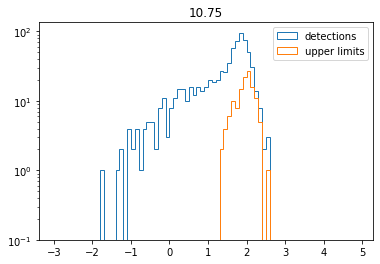

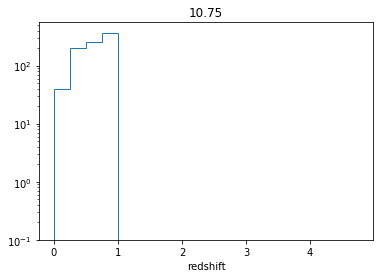

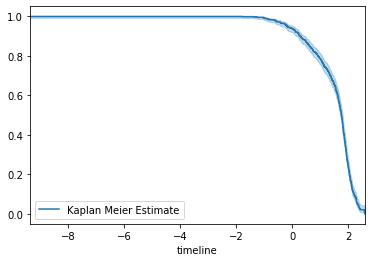

measured median using survival analysis is: 1.758275246542297


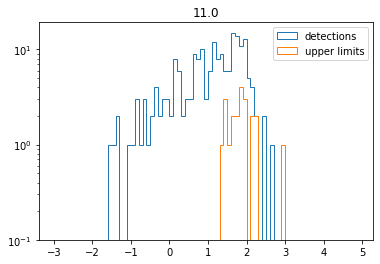

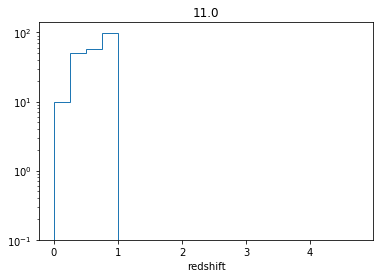

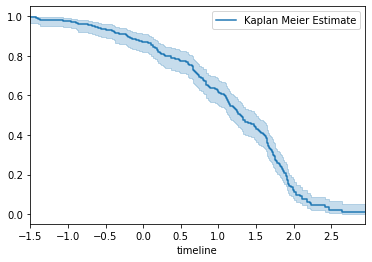

measured median using survival analysis is: 1.3030623245639568


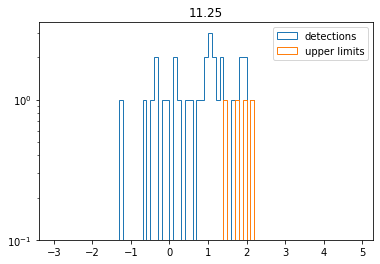

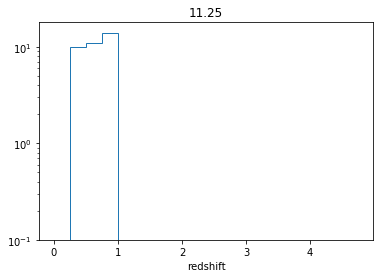

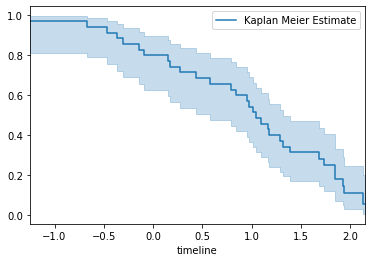

measured median using survival analysis is: 1.0387430235514294


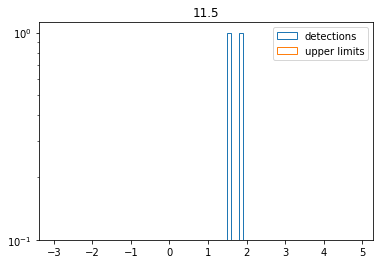

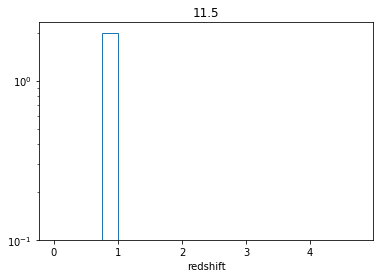

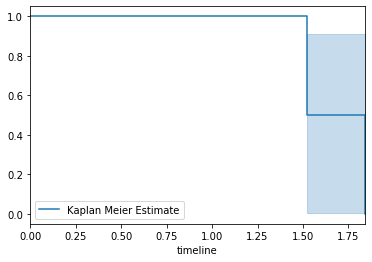

measured median using survival analysis is: 1.5225994223347143


In [140]:
bins_lum = np.arange(10,13,0.25)

test = np.digitize(mstar_all,bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all[mask])
    decs_binned.append(decs_all[mask])
    redshift_binned.append(redshift_all[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all[mask],bins=np.arange(0,5,0.25),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q.append(kmf.median_)

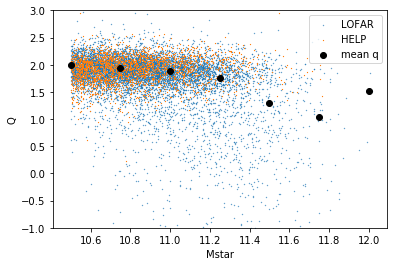

In [141]:
y = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
x = mstar_lofar
plt.scatter(x,y,s=0.1,label='LOFAR')

x = mstar_help
y = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.scatter(x,y,s=0.1,marker='^',label='HELP')

x = np.arange(10,13,0.25)[nums-1]
y = mean_q
plt.scatter(x,y,label='mean q',c='black')

plt.ylim(-1,3)
plt.xlabel('Mstar')
plt.ylabel('Q')
plt.legend()
plt.show()

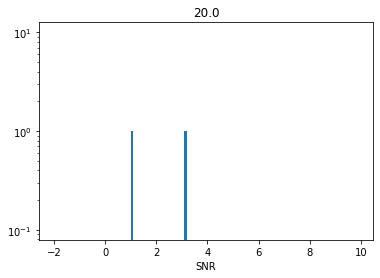

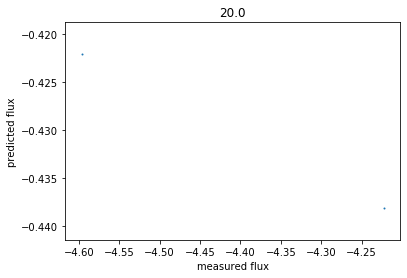

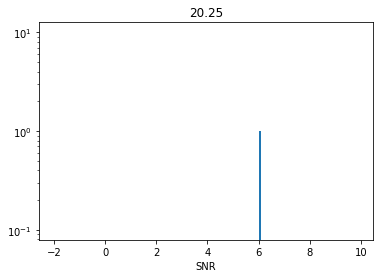

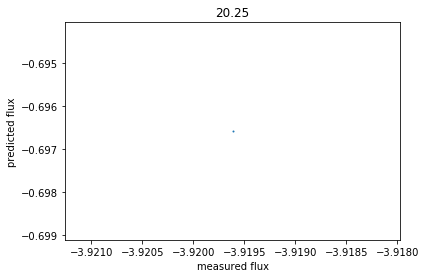

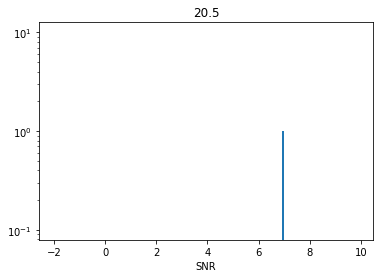

...

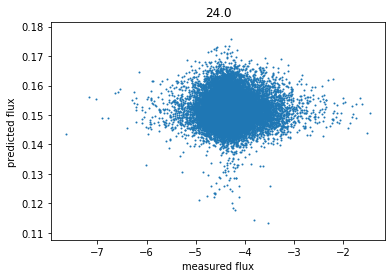

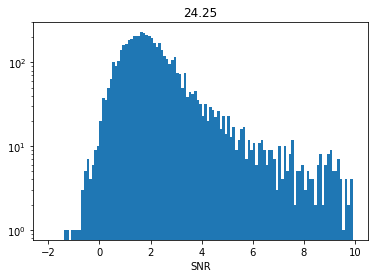

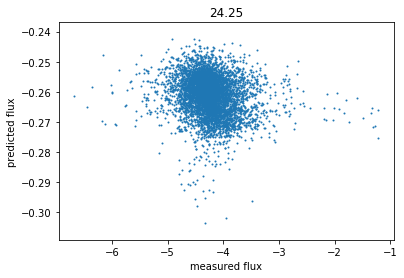

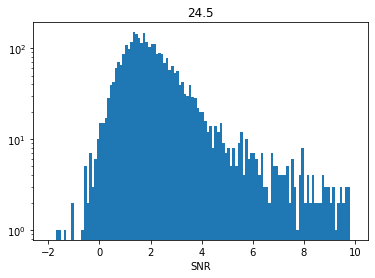

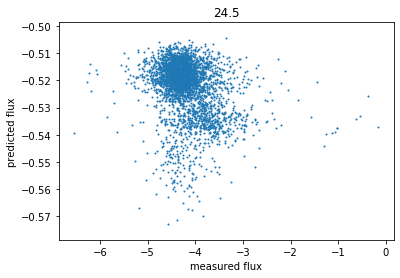

In [71]:
bins_lum = np.arange(20,25,0.25)

test = np.digitize(np.log10(lum_rad),bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

for n,num in enumerate(nums):
    
    mask = test==num
    
    ''' Old way of calculating the upper flux limits by using the position of the FIR source   
    x,y = np.round(radim_wcs_err.wcs_world2pix(ras_binned[n],decs_binned[n],0,ra_dec_order=True),0).astype(int)
    rad_errs = radim_err[x,y]

    x,y = np.round(radim_wcs.wcs_world2pix(ras_binned[n],decs_binned[n],0,ra_dec_order=True),0).astype(int)
    rad_flux = radim_data[x,y]'''

    # New way of finding the radio luminosity uppr limit by looking in a 7x7 square around teh source position
    #to find the pixel with the greatest flux
    x,y = np.round(radim_wcs.wcs_world2pix(ras_binned[n],decs_binned[n],0,ra_dec_order=True),0).astype(int)
    rad_flux_cutout = np.array([radim_data[x[n]-3:x[n]+4,y[n]-3:y[n]+4].flatten() for n in range(len(x))])
    arg_max_flux = np.argmax(rad_flux_cutout,axis=1)
    rad_flux = np.max(rad_flux_cutout,axis=1)
    
    x,y = np.round(radim_wcs_err.wcs_world2pix(ras_binned[n],decs_binned[n],0,ra_dec_order=True),0).astype(int)
    rad_errs_cutout = np.array([radim_err[x[n]-3:x[n]+4,y[n]-3:y[n]+4].flatten() for n in range(len(x))])
    rad_errs = np.array([rad_errs_cutout[n][arg_max_flux[n]] for n in range(len(arg_max_flux))])
    
    alpha = -0.8
    z = redshift_all[n]
    dist = cosmo.luminosity_distance(z).to(u.m).value
    pred_lum_rad = np.log10(ldust[mask]/3.75E12) - 1.6
    pred_flux = pred_lum_rad * (1+z)**(1+alpha) / (4*np.pi*dist**2 * 1E-26) *1E26

    SNR = rad_flux/rad_errs
    bins = np.arange(-2,10,0.1)
    plt.hist(SNR,bins=bins,log=True)
    plt.xlabel('SNR')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    x = np.log10(rad_flux)
    y = np.log10(pred_flux)
    plt.scatter(x,y,s=1)
    plt.xlabel('measured flux')
    plt.ylabel('predicted flux')

    plt.title('{}'.format(bins_lum[n]))
    plt.show()

In [ ]:
np.array([ name for name in names for names in help_list])
new_list = []
for array in help_list:
    for name in array:
        new_list.append(name)

(array([2.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 2.9700e+02, 7.4331e+04]),
 array([-1.09450186, -1.03551479, -0.97652772, -0.91754064, -0.85855357,
        -0.7995665 , -0.74057943, -0.68159236, -0.62260528, -0.56361821,
        -0.50463114]),
 <a list of 10 Patch objects>)

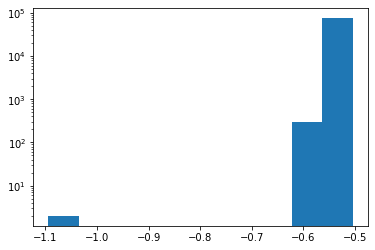

In [21]:
pred_lum_rad = np.log10(ldust/3.75E12) - 1.6
pred_flux = pred_lum_rad * (1+z)**(1+alpha) / (4*np.pi*dist**2 * 1E-26) *1E26
plt.hist(np.log10(pred_flux),log=True)

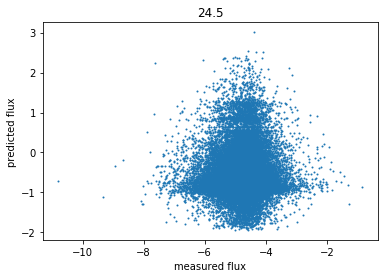

In [72]:
x,y = np.round(radim_wcs_err.wcs_world2pix(ras_all,decs_all,0,ra_dec_order=True),0).astype(int)
rad_errs = radim_err[x,y]

x,y = np.round(radim_wcs.wcs_world2pix(ras_all,decs_all,0,ra_dec_order=True),0).astype(int)
rad_flux = radim_data[x,y]
    
alpha = -0.8
z = redshift_all
dist = cosmo.luminosity_distance(z).to(u.m).value
pred_lum_rad = np.log10(ldust/3.75E12) - 1.6
pred_flux = pred_lum_rad * (1+z)**(1+alpha) / (4*np.pi*dist**2 * 1E-26) *1E26

    #SNR = rad_flux/rad_errs
    #bins = np.arange(-2,10,0.1)
    #plt.hist(SNR,bins=bins,log=True)
    
x = np.log10(rad_flux)
y = np.log10(pred_flux)
plt.scatter(x,y,s=1)
plt.xlabel('measured flux')
plt.ylabel('predicted flux')

plt.title('{}'.format(bins_lum[n]))
plt.show()

In [ ]:
moc_sw = pymoc.moc.MOC()
read_moc_fits(moc_sw,'../lofar/deep_fields/ELAIS-N1/data/data_release/final_mocs/EL_EN1_sw2_MOC_withadd.fits')
moc_k = pymoc.moc.MOC()
read_moc_fits(moc_k,'../lofar/deep_fields/ELAIS-N1/data/data_release/final_mocs/EL_EN1_K_MOC_withadd.fits')
moc_i = pymoc.moc.MOC()
read_moc_fits(moc_i,'../lofar/deep_fields/ELAIS-N1/data/data_release/final_mocs/EL_EN1_i_MOC_withadd.fits')
moc = moc_sw.intersection(moc_k)
moc = moc.intersection(moc_i)
moc_mask = inMoc(ras,decs,moc)

coords: ra:240.15726818972334  55.19414098029094
contours are at [-9.35417317e-05 -4.15045533e-05  1.05326251e-05  6.25698035e-05
  1.14606982e-04  1.66644160e-04  2.18681339e-04]
plotting 2 sources


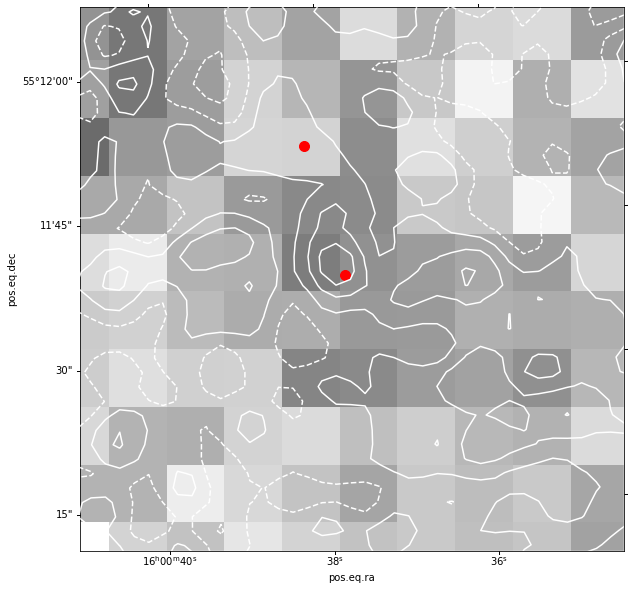

coords: ra:240.780000195057  54.1765421554993
contours are at [-5.54098957e-05 -1.93717511e-05  1.66663935e-05  5.27045380e-05
  8.87426826e-05  1.24780827e-04  1.60818972e-04]
plotting 5 sources


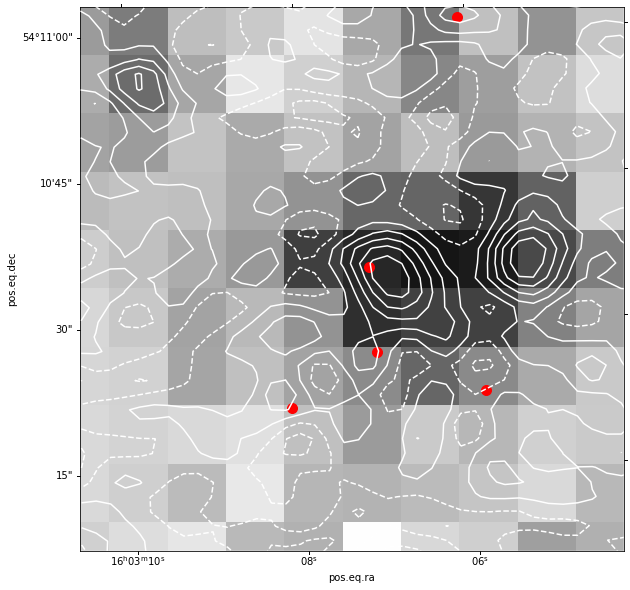

coords: ra:240.868120673057  54.9710071924993
contours are at [-5.21086838e-05 -1.76935007e-05  1.67216825e-05  5.11368656e-05
  8.55520487e-05  1.19967232e-04  1.54382415e-04]
plotting 8 sources


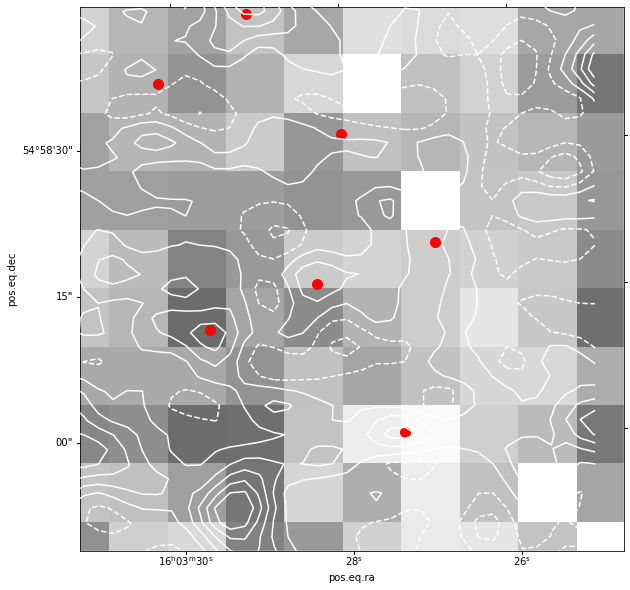

coords: ra:241.190008690057  54.5932850944993
contours are at [-6.12770127e-05 -2.50517444e-05  1.11735238e-05  4.73987921e-05
  8.36240603e-05  1.19849329e-04  1.56074597e-04]
plotting 8 sources


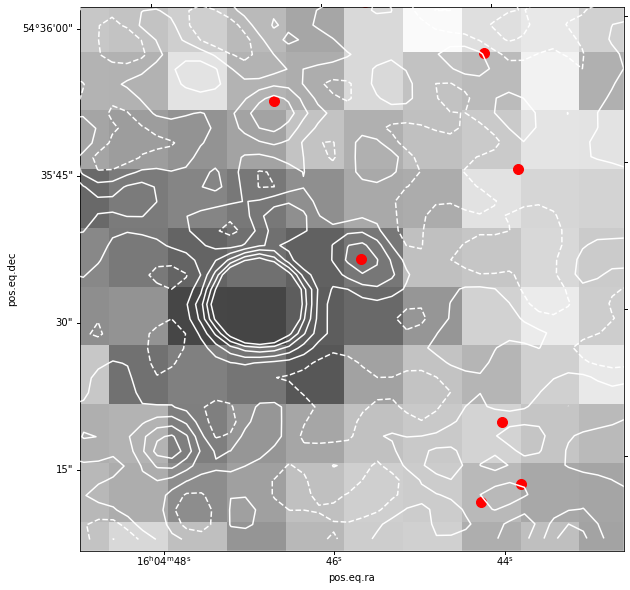

coords: ra:241.338235742057  54.0912195384993
contours are at [-5.56848090e-05 -2.83327850e-05 -9.80761038e-07  2.63712630e-05
  5.37232869e-05  8.10753109e-05  1.08427335e-04]
plotting 3 sources


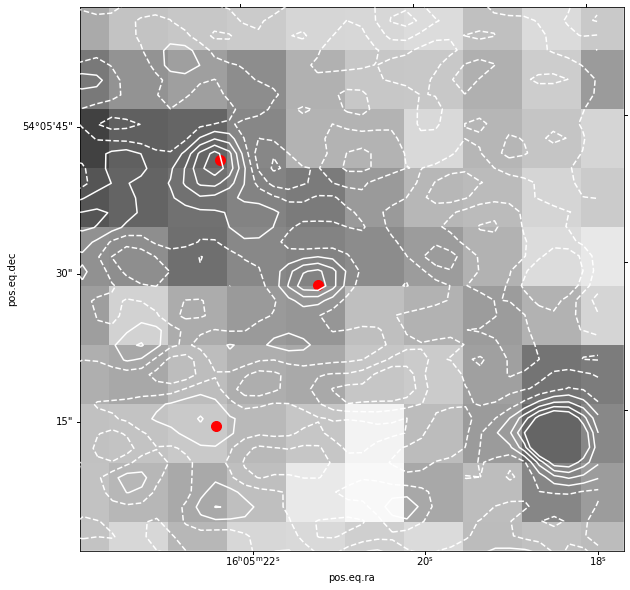

coords: ra:241.410118158057  56.0153552764993
contours are at [-7.78329732e-05 -3.62759449e-05  5.28108347e-06  4.68381118e-05
  8.83951402e-05  1.29952169e-04  1.71509197e-04]
plotting 3 sources


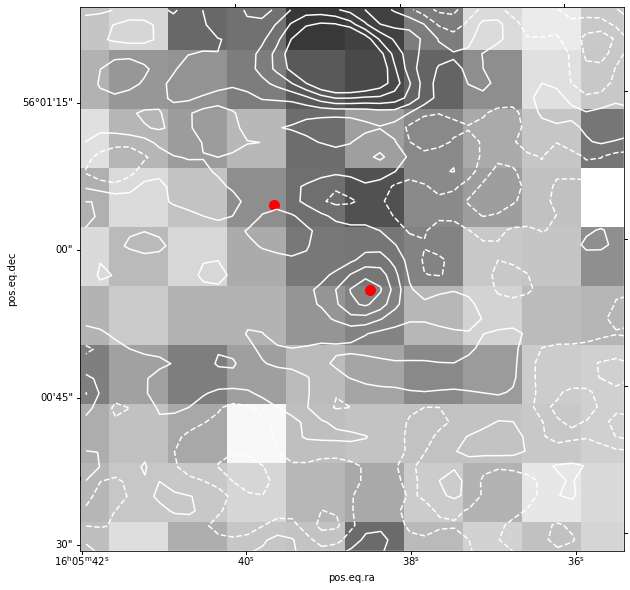

coords: ra:241.425006506057  55.0441312664993
contours are at [-4.36441758e-05 -1.69122393e-05  9.81969717e-06  3.65516337e-05
  6.32835702e-05  9.00155067e-05  1.16747443e-04]
plotting 3 sources


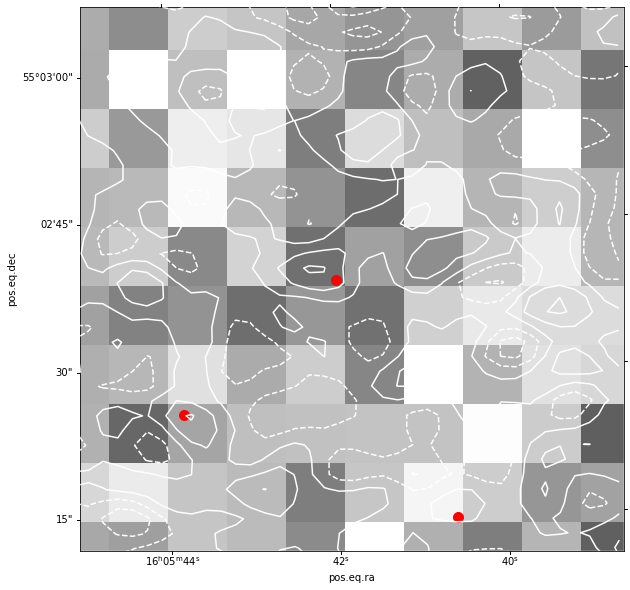

coords: ra:241.42876836705702  54.911969123499304
contours are at [-8.12392341e-05 -2.28919849e-05  3.54552643e-05  9.38025136e-05
  1.52149763e-04  2.10497012e-04  2.68844261e-04]
plotting 5 sources


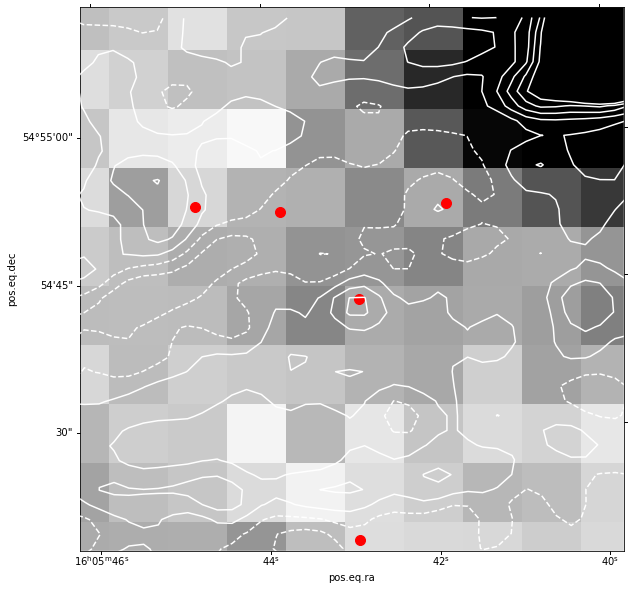

coords: ra:241.47129438105702  54.2145996104993
contours are at [-5.25398717e-05 -1.51735656e-05  2.21927406e-05  5.95590467e-05
  9.69253528e-05  1.34291659e-04  1.71657965e-04]
plotting 9 sources


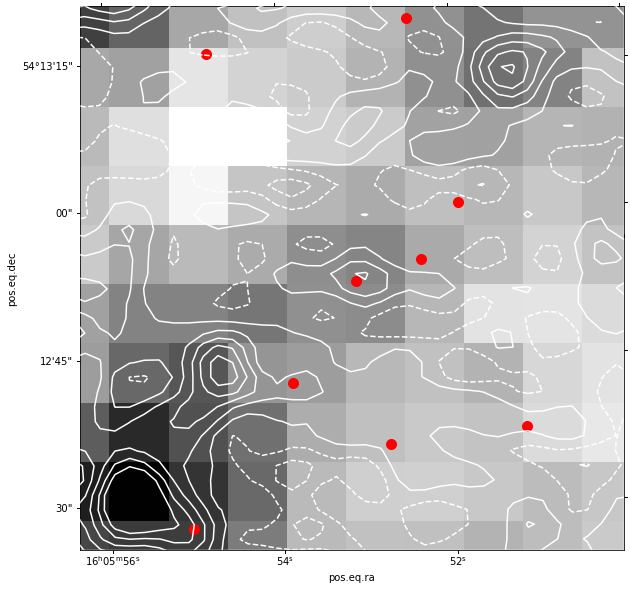

coords: ra:241.473683857057  54.7165444184993
contours are at [-6.54864013e-05 -2.45246330e-05  1.64371354e-05  5.73989038e-05
  9.83606722e-05  1.39322441e-04  1.80284209e-04]
plotting 9 sources


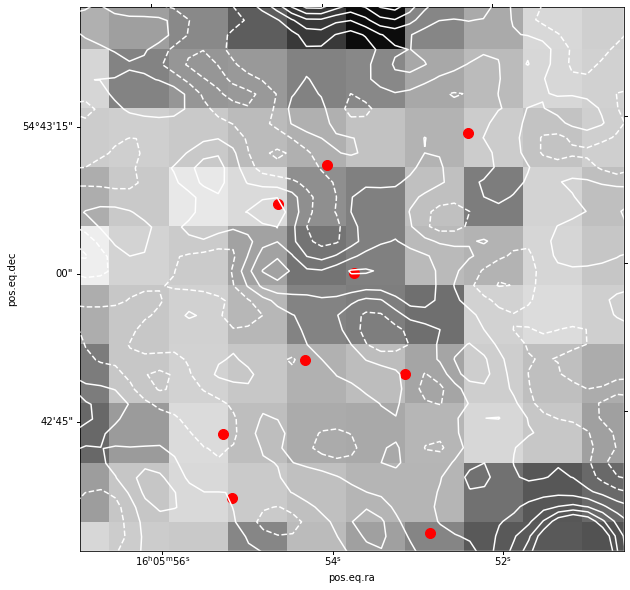

coords: ra:241.629655319057  54.9648747634993
contours are at [-5.51961828e-05 -1.82283223e-05  1.87395382e-05  5.57073987e-05
  9.26752592e-05  1.29643120e-04  1.66610980e-04]
plotting 9 sources


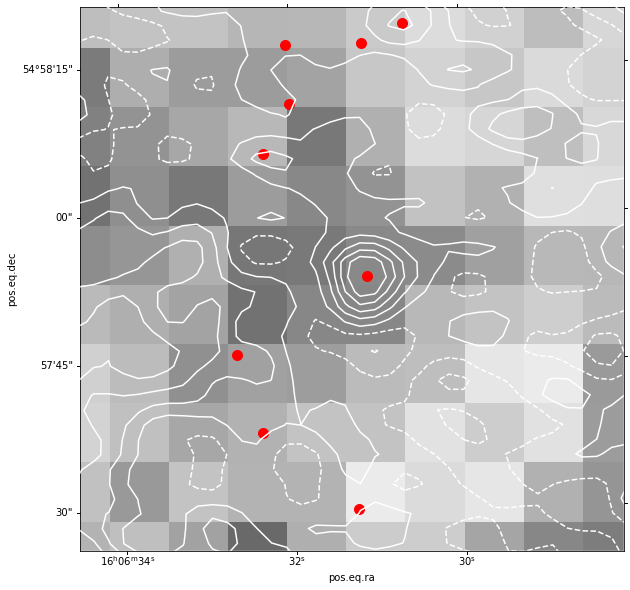

coords: ra:241.79354106705702  53.6979807334993
contours are at [-6.96568014e-05 -3.15127776e-05  6.63124623e-06  4.47752700e-05
  8.29192938e-05  1.21063318e-04  1.59207341e-04]
plotting 5 sources


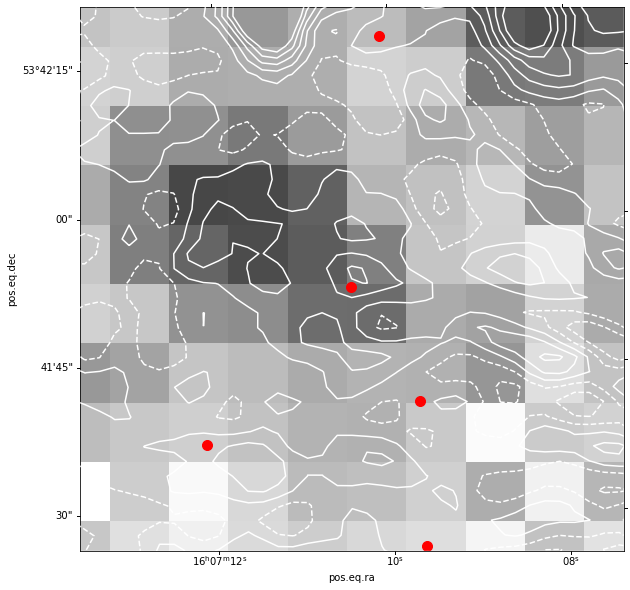

coords: ra:241.851550605057  55.7780945374993
contours are at [-5.74869836e-05 -2.55507472e-05  6.38548922e-06  3.83217256e-05
  7.02579620e-05  1.02194198e-04  1.34130435e-04]
plotting 2 sources


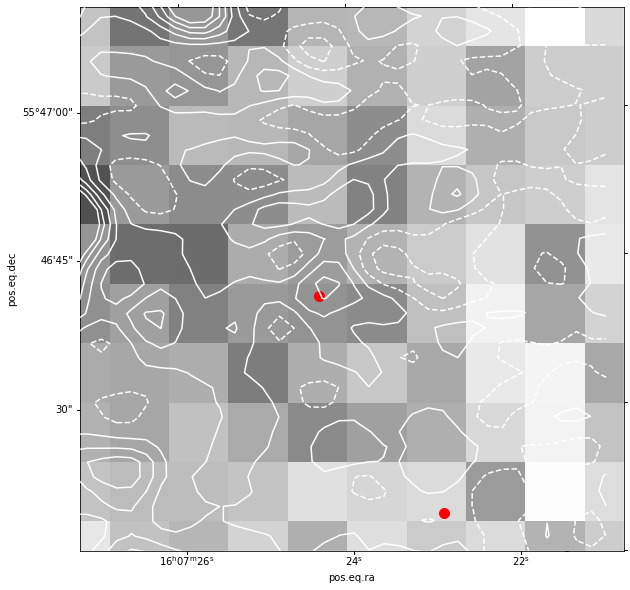

coords: ra:241.855333141057  54.3799475374993
contours are at [-4.61181692e-05 -1.99001495e-05  6.31787017e-06  3.25358899e-05
  5.87539095e-05  8.49719292e-05  1.11189949e-04]
plotting 5 sources


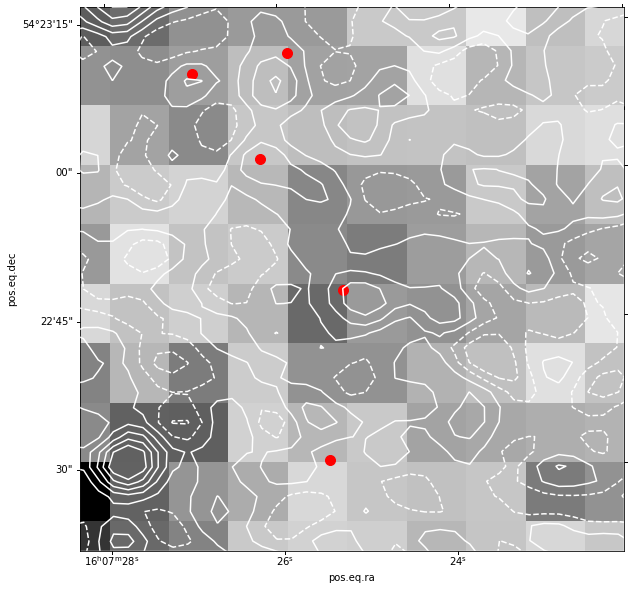

coords: ra:241.85709365405702  54.299458826499304
contours are at [-4.72093039e-05 -1.96386113e-05  7.93208125e-06  3.55027738e-05
  6.30734664e-05  9.06441590e-05  1.18214852e-04]
plotting 7 sources


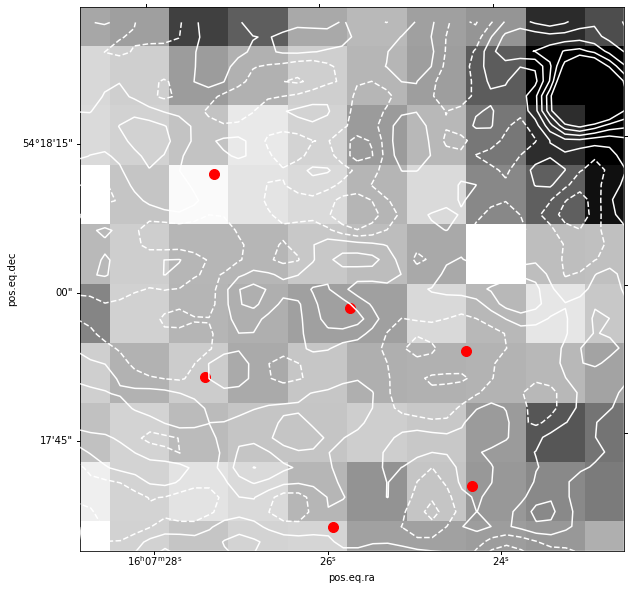

coords: ra:241.994267759057  53.4783727984993
contours are at [-6.51513066e-05 -2.52265024e-05  1.46983018e-05  5.46231059e-05
  9.45479101e-05  1.34472714e-04  1.74397518e-04]
plotting 4 sources


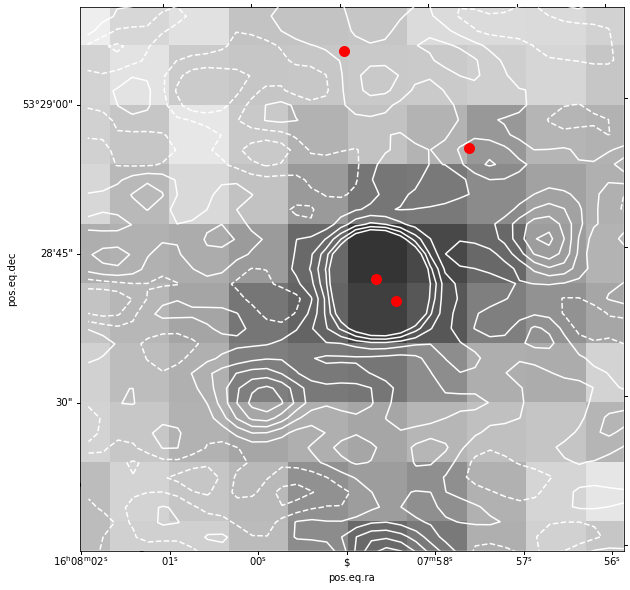

coords: ra:242.070926070057  53.4224985404993
contours are at [-6.79152368e-05 -2.49645438e-05  1.79861491e-05  6.09368421e-05
  1.03887535e-04  1.46838228e-04  1.89788921e-04]
plotting 2 sources


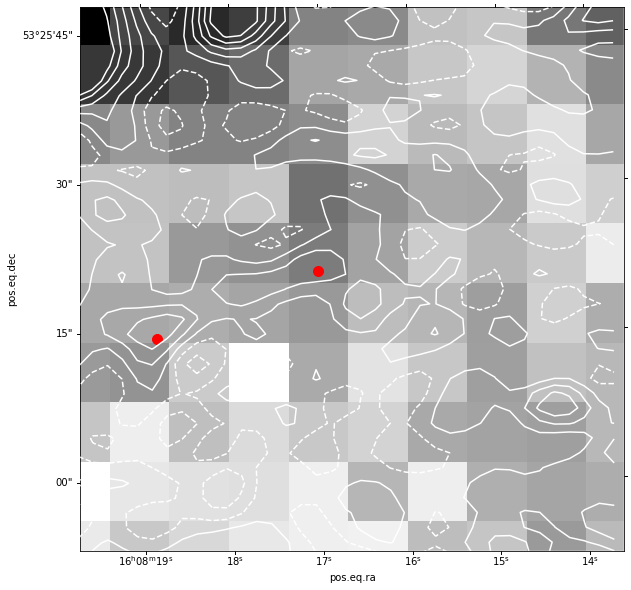

coords: ra:242.08740957898874  53.58753773737362
contours are at [-5.75408741e-05 -1.98265419e-05  1.78877902e-05  5.56021224e-05
  9.33164545e-05  1.31030787e-04  1.68745119e-04]
plotting 9 sources


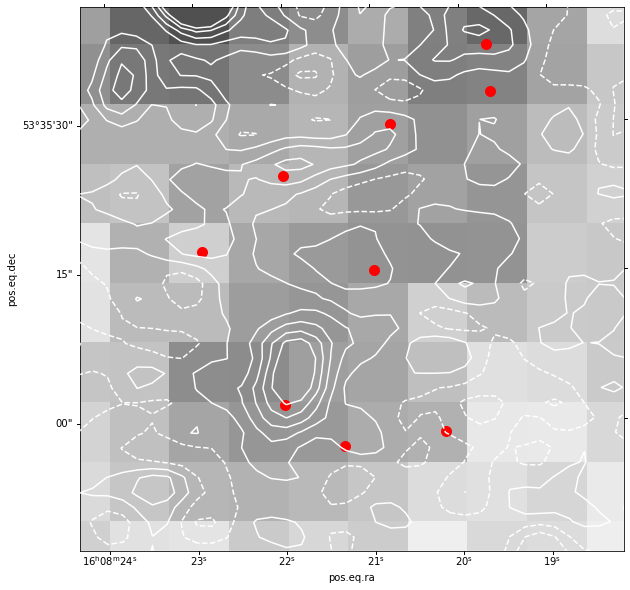

coords: ra:242.161135751057  53.3925184354993
contours are at [-6.95231045e-05 -3.22937888e-05  4.93552698e-06  4.21648427e-05
  7.93941585e-05  1.16623474e-04  1.53852790e-04]
plotting 2 sources


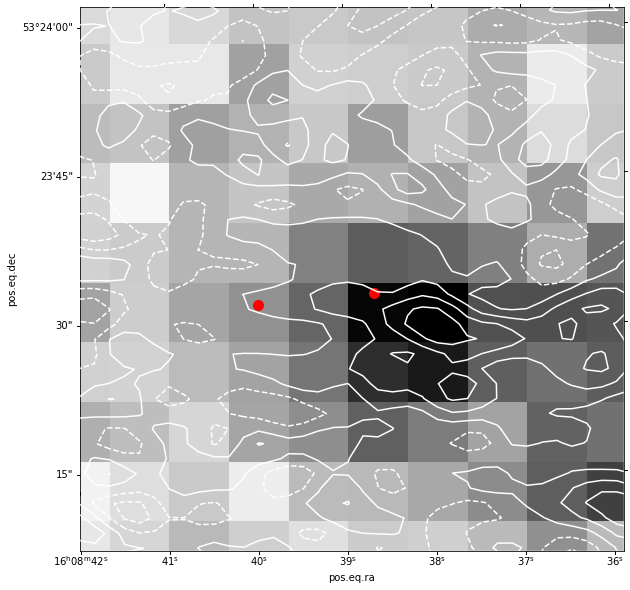

coords: ra:242.31332260705702  53.7360187684993
contours are at [-5.17276189e-05 -2.20763214e-05  7.57497606e-06  3.72262736e-05
  6.68775711e-05  9.65288685e-05  1.26180166e-04]
plotting 5 sources


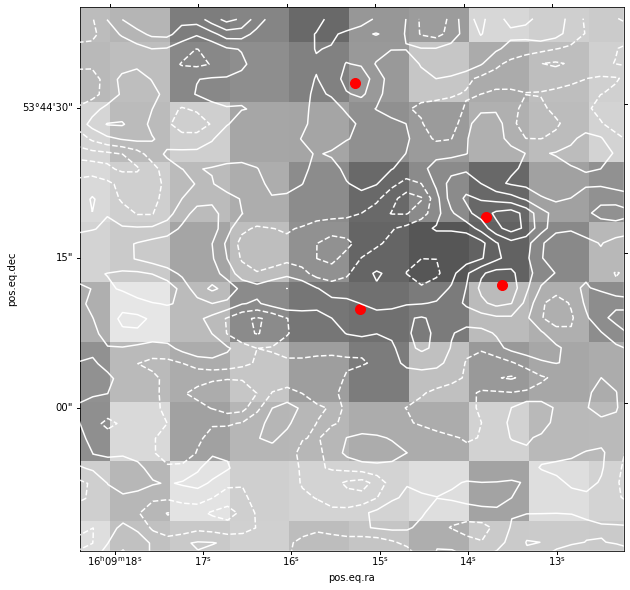

coords: ra:242.354545421057  53.7930221154993
contours are at [-5.55418783e-05 -1.95198491e-05  1.65021800e-05  5.25242092e-05
  8.85462384e-05  1.24568268e-04  1.60590297e-04]
plotting 4 sources


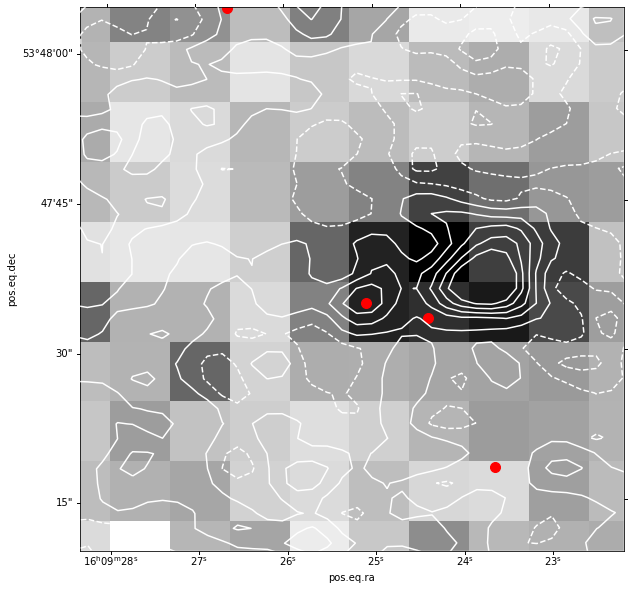

coords: ra:242.41188830905702  55.4500145244993
contours are at [-1.78164296e-04 -4.14842680e-05  9.51957594e-05  2.31875787e-04
  3.68555814e-04  5.05235842e-04  6.41915869e-04]
plotting 6 sources


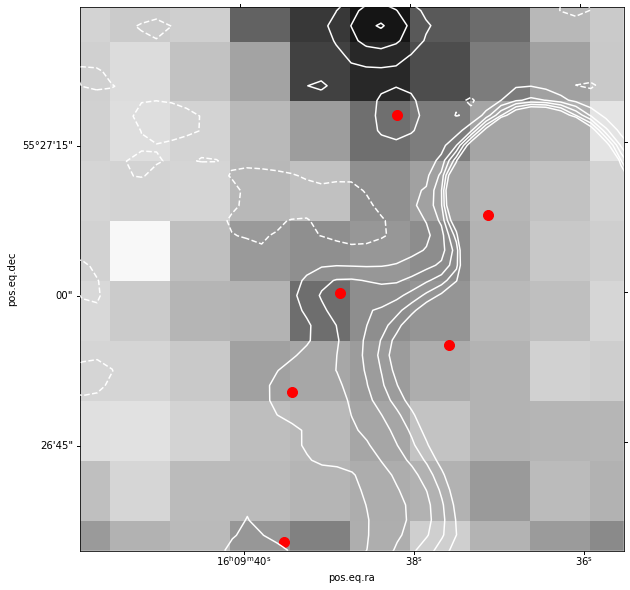

coords: ra:242.43073910905701  54.2765697124993
contours are at [-5.01997797e-05 -1.64257706e-05  1.73482385e-05  5.11222475e-05
  8.48962566e-05  1.18670266e-04  1.52444275e-04]
plotting 7 sources


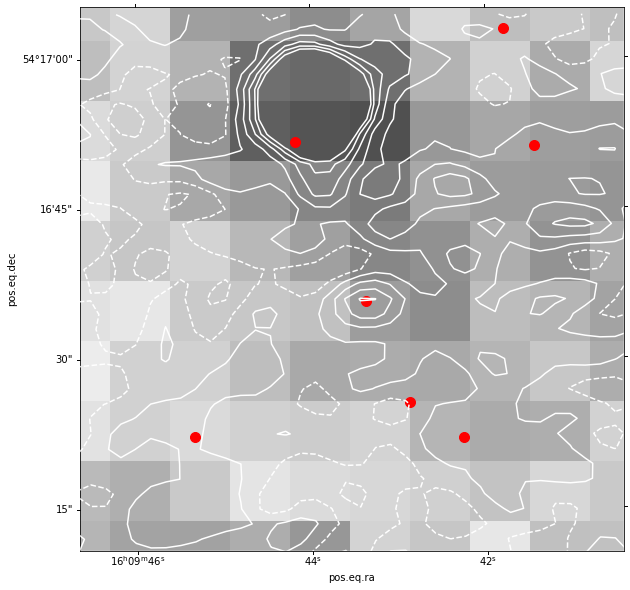

coords: ra:242.46524382605702  53.6819232514993
contours are at [-5.42314161e-05 -2.18463428e-05  1.05387306e-05  4.29238039e-05
  7.53088773e-05  1.07693951e-04  1.40079024e-04]
plotting 13 sources


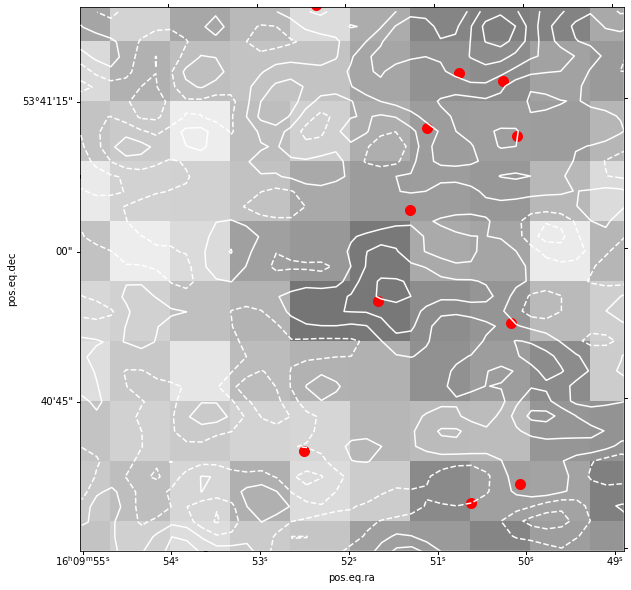

coords: ra:242.476243553057  53.7335149574993
contours are at [-7.61605596e-05 -2.91862481e-05  1.77880633e-05  6.47623748e-05
  1.11736686e-04  1.58710998e-04  2.05685309e-04]
plotting 9 sources


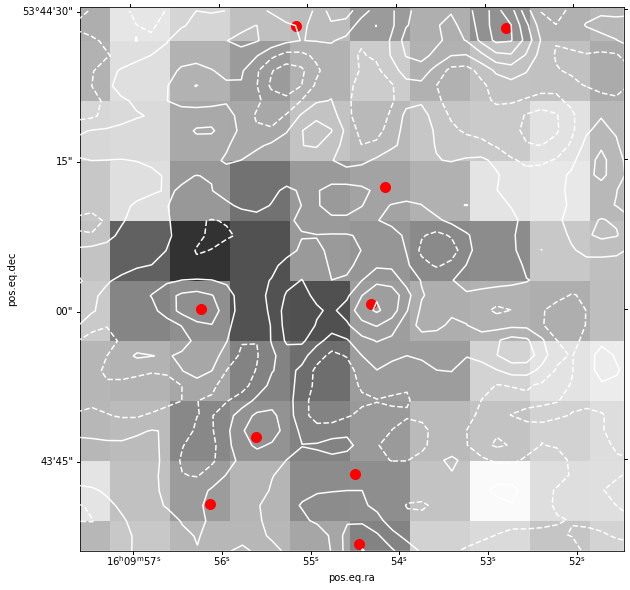

coords: ra:242.495456105057  55.0203338154993
contours are at [-2.10730357e-04 -6.69880953e-05  7.67541663e-05  2.20496428e-04
  3.64238689e-04  5.07980951e-04  6.51723213e-04]
plotting 9 sources


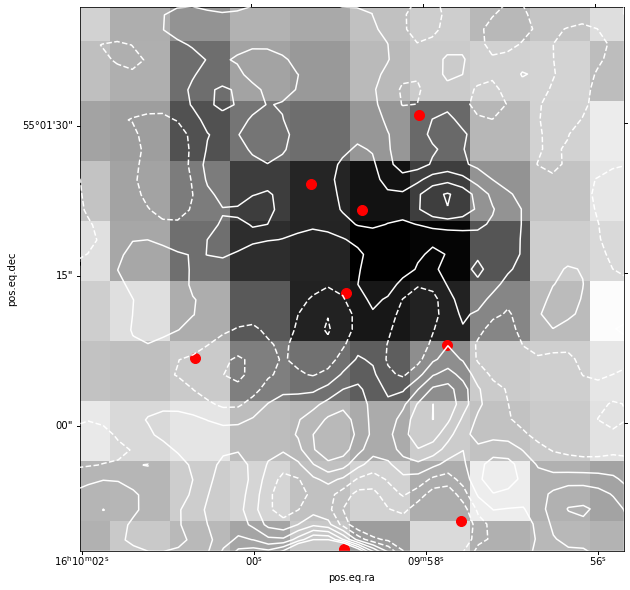

coords: ra:242.496017481057  53.5605122224993
contours are at [-5.48326255e-05 -1.77965184e-05  1.92395888e-05  5.62756959e-05
  9.33118030e-05  1.30347910e-04  1.67384017e-04]
plotting 2 sources


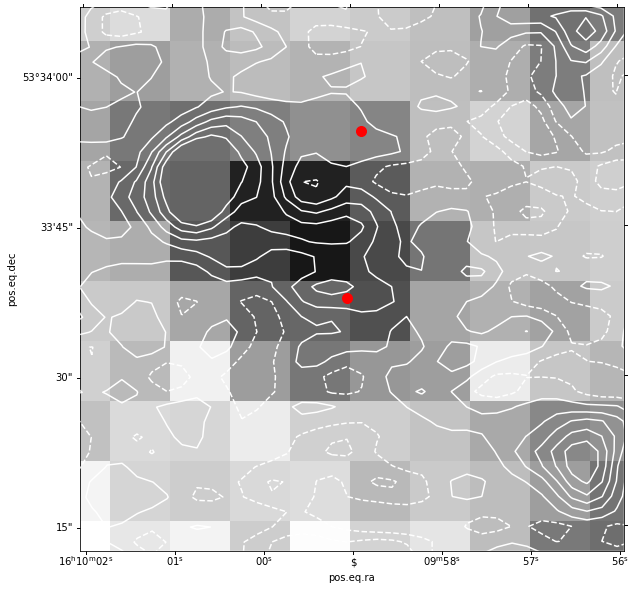

coords: ra:242.59820376105702  53.5560491594993
contours are at [-7.10415258e-05 -3.10438751e-05  8.95377562e-06  4.89514263e-05
  8.89490770e-05  1.28946728e-04  1.68944378e-04]
plotting 3 sources


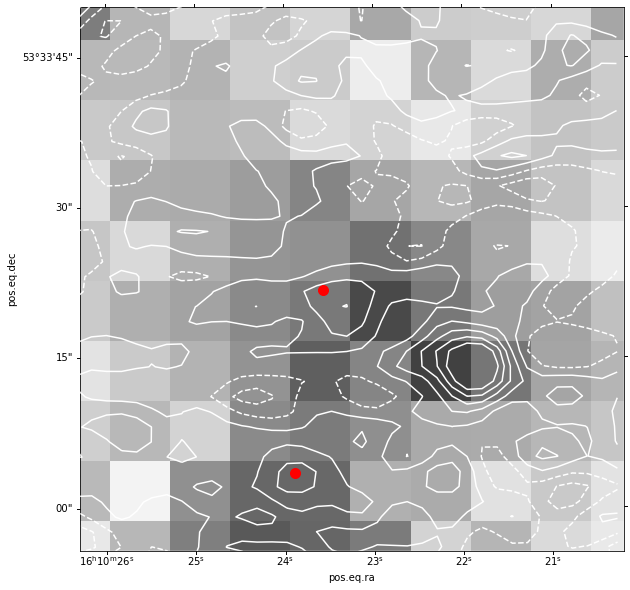

coords: ra:242.677655696057  53.4376043044993
contours are at [-8.30813561e-05 -2.70606212e-05  2.89601138e-05  8.49808487e-05
  1.41001584e-04  1.97022319e-04  2.53043054e-04]
plotting 7 sources


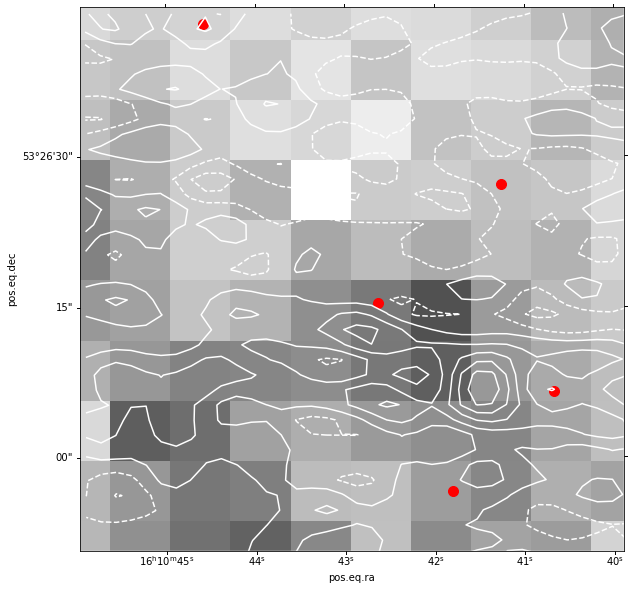

coords: ra:242.709334069057  54.4032017964993
contours are at [-5.27868634e-05 -2.70313482e-05 -1.27583309e-06  2.44796821e-05
  5.02351972e-05  7.59907124e-05  1.01746228e-04]
plotting 7 sources


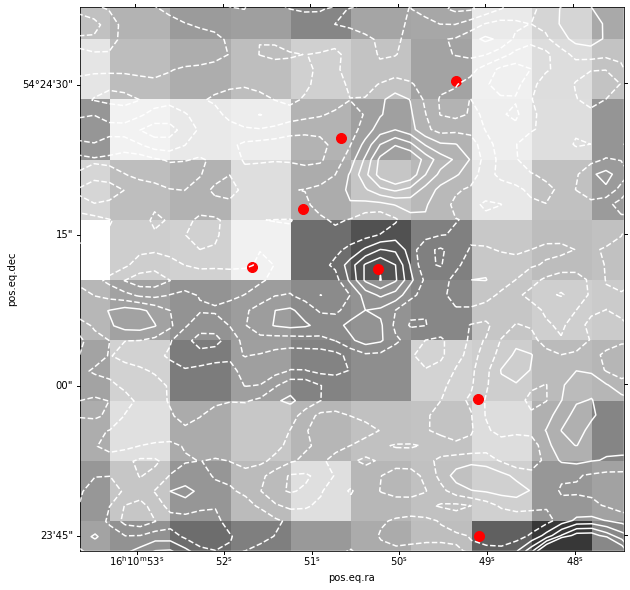

coords: ra:242.721281036057  54.4256960434993
contours are at [-4.54938248e-05 -1.75209613e-05  1.04519021e-05  3.84247656e-05
  6.63976290e-05  9.43704925e-05  1.22343356e-04]
plotting 9 sources


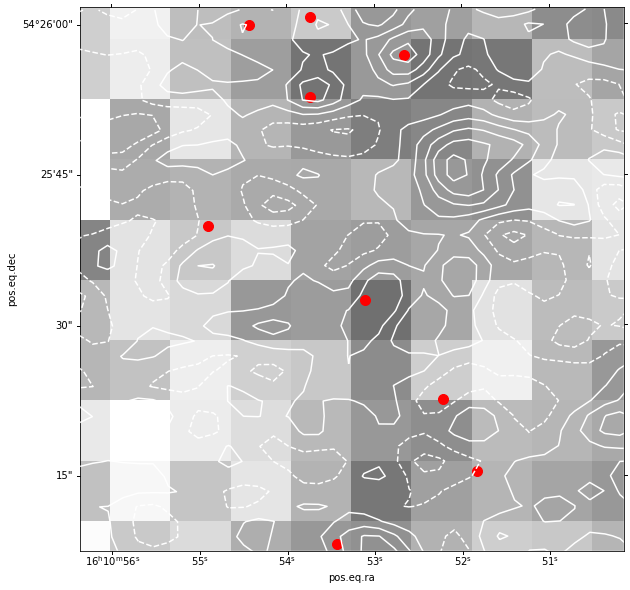

coords: ra:242.724905314057  53.4653122244993
contours are at [-8.21001899e-05 -3.87021702e-05  4.69584945e-06  4.80938691e-05
  9.14918888e-05  1.34889908e-04  1.78287928e-04]
plotting 3 sources


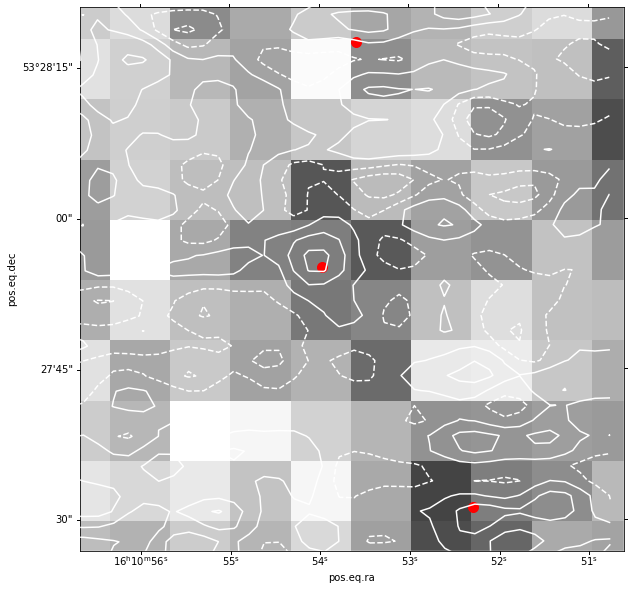

coords: ra:242.73137983005702  53.8010240294993
contours are at [-5.85759296e-05 -3.16728841e-05 -4.76983865e-06  2.21332068e-05
  4.90362523e-05  7.59392977e-05  1.02842343e-04]
plotting 5 sources


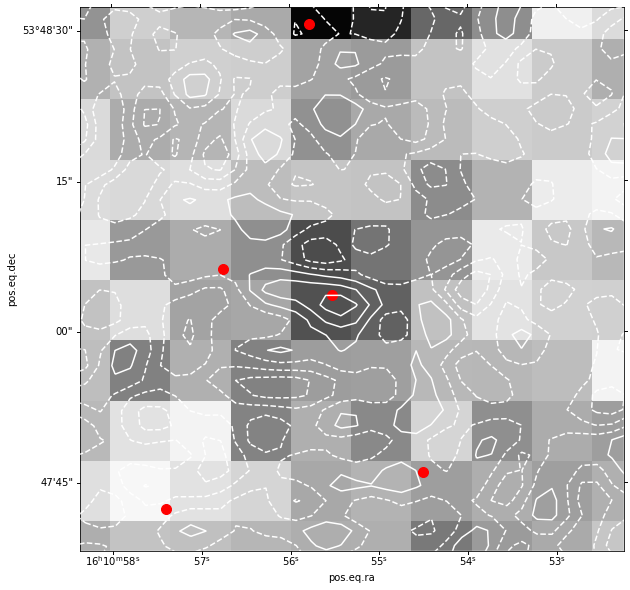

coords: ra:242.748846449057  53.5063449704993
contours are at [-1.04077052e-04 -3.99980801e-05  2.40808914e-05  8.81598628e-05
  1.52238834e-04  2.16317806e-04  2.80396777e-04]
plotting 5 sources


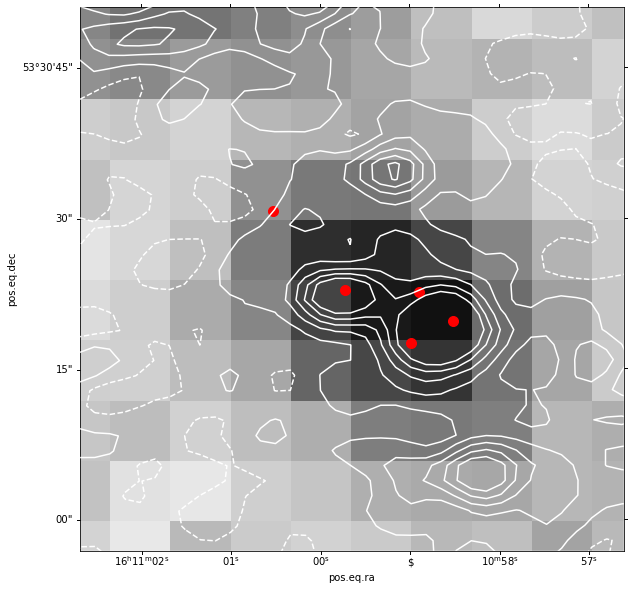

coords: ra:242.769622610057  53.3659344984993
contours are at [-8.48590597e-05 -3.42536980e-05  1.63516636e-05  6.69570253e-05
  1.17562387e-04  1.68167749e-04  2.18773110e-04]
plotting 8 sources


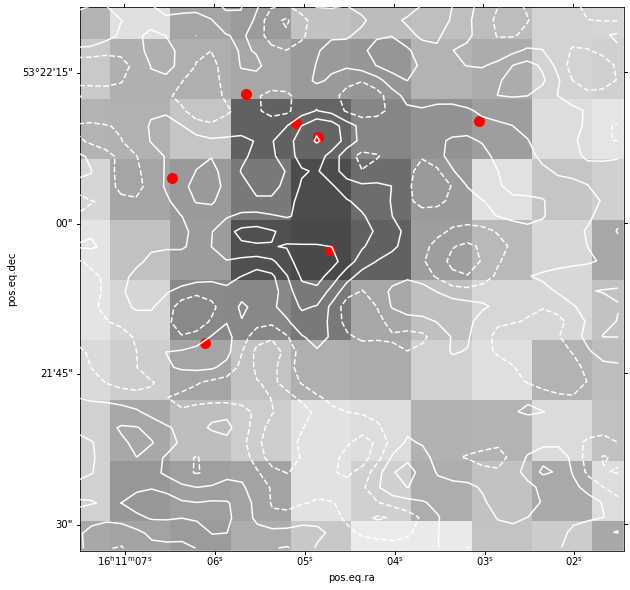

coords: ra:242.810437990057  54.7011851844993
contours are at [-6.51317844e-05 -2.24817812e-05  2.01682220e-05  6.28182251e-05
  1.05468228e-04  1.48118232e-04  1.90768235e-04]
plotting 7 sources


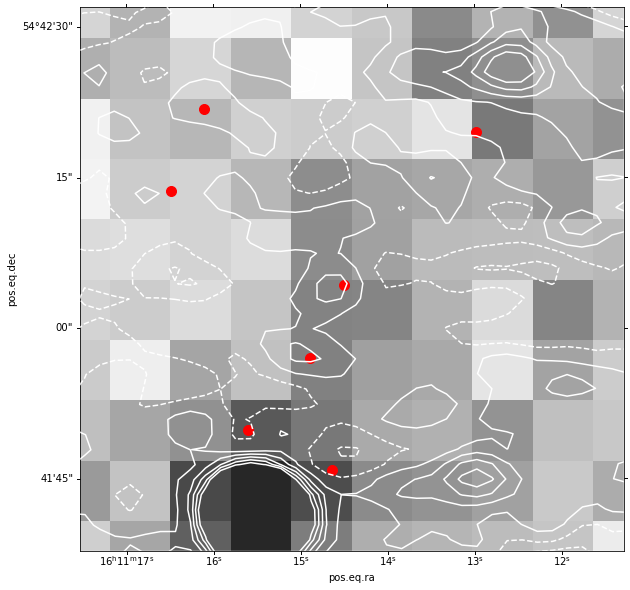

coords: ra:242.84062930405702  55.2129309564993
contours are at [-4.93709992e-05 -1.70002698e-05  1.53704595e-05  4.77411888e-05
  8.01119182e-05  1.12482647e-04  1.44853377e-04]
plotting 8 sources


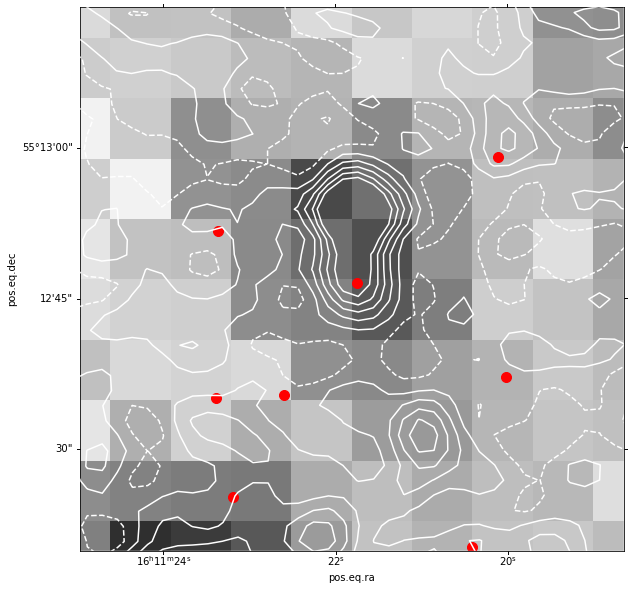

coords: ra:242.853482582057  54.8598223254993
contours are at [-4.54722651e-05 -2.06049754e-05  4.26231420e-06  2.91296038e-05
  5.39968935e-05  7.88641831e-05  1.03731473e-04]
plotting 8 sources


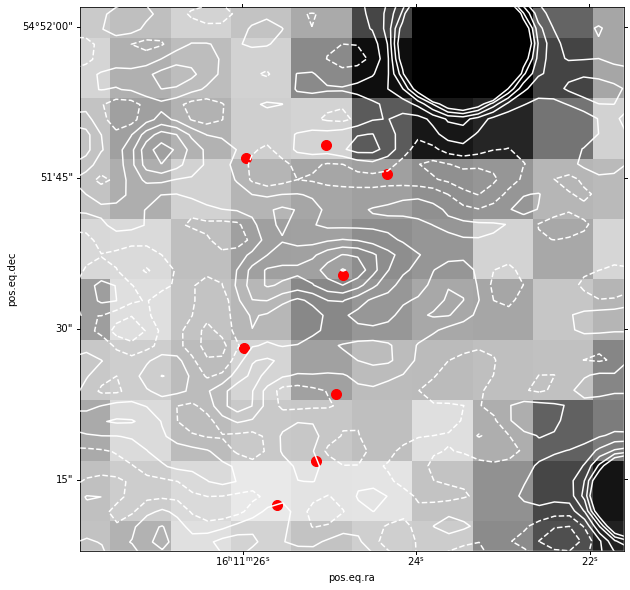

coords: ra:242.91574484005702  54.0100598934993
contours are at [-1.14836799e-04 -4.73352774e-05  2.01662445e-05  8.76677665e-05
  1.55169288e-04  2.22670810e-04  2.90172332e-04]
plotting 9 sources


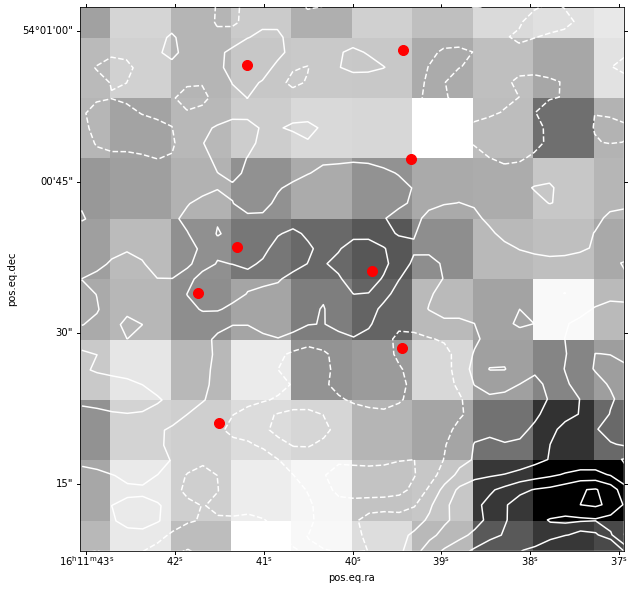

coords: ra:242.91788774705702  54.2070827904993
contours are at [-5.30061451e-05 -2.21687703e-05  8.66860450e-06  3.95059793e-05
  7.03433541e-05  1.01180729e-04  1.32018104e-04]
plotting 15 sources


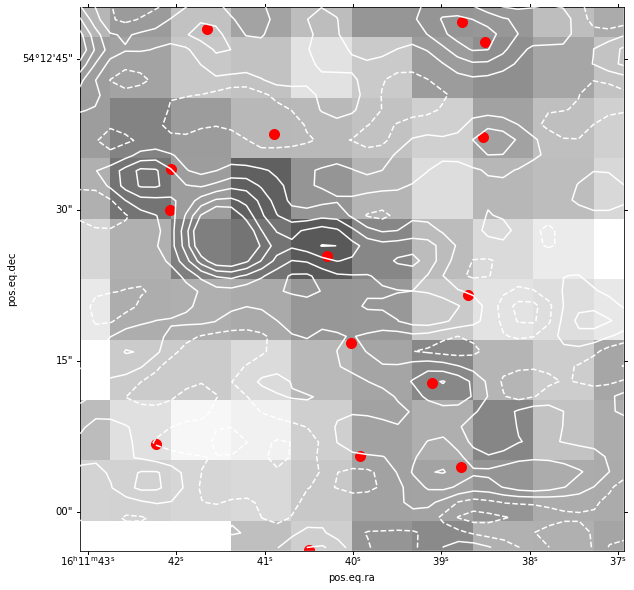

coords: ra:243.081097414057  54.1457482004993
contours are at [-4.34818473e-05 -1.52776891e-05  1.29264691e-05  4.11306273e-05
  6.93347854e-05  9.75389436e-05  1.25743102e-04]
plotting 9 sources


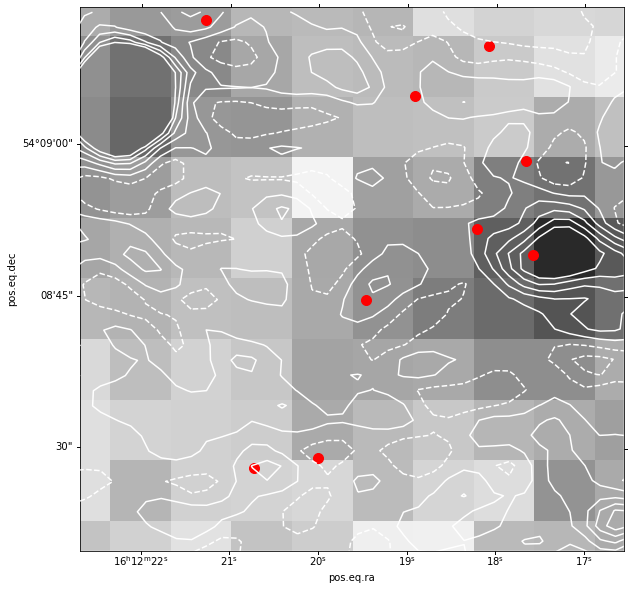

coords: ra:243.119249151057  54.1104799744993
contours are at [-4.67747747e-05 -1.91730280e-05  8.42871863e-06  3.60304653e-05
  6.36322120e-05  9.12339586e-05  1.18835705e-04]
plotting 5 sources


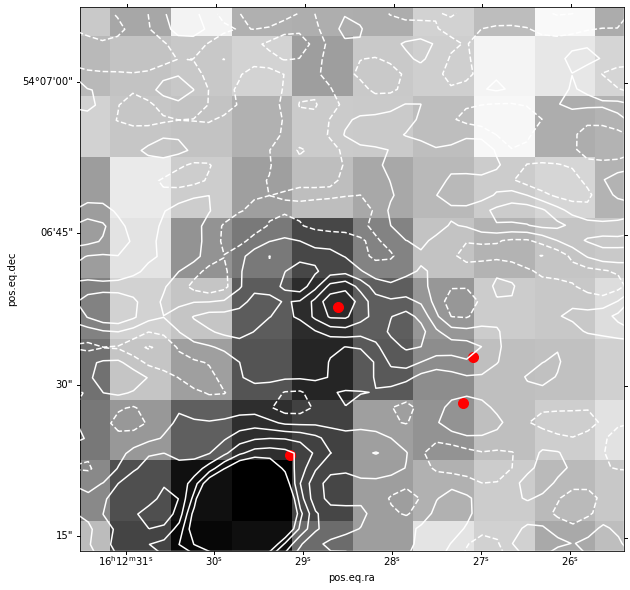

coords: ra:243.20980238605702  54.5560806474993
contours are at [-4.34758660e-05 -1.60134190e-05  1.14490279e-05  3.89114748e-05
  6.63739217e-05  9.38363686e-05  1.21298816e-04]
plotting 7 sources


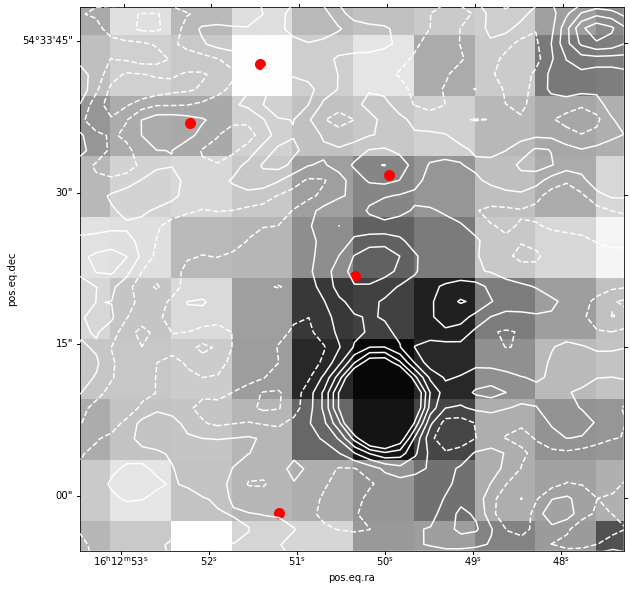

coords: ra:243.29057696805702  55.8912602434993
contours are at [-6.90179621e-05 -3.14347336e-05  6.14849491e-06  4.37317234e-05
  8.13149520e-05  1.18898180e-04  1.56481409e-04]
plotting 4 sources


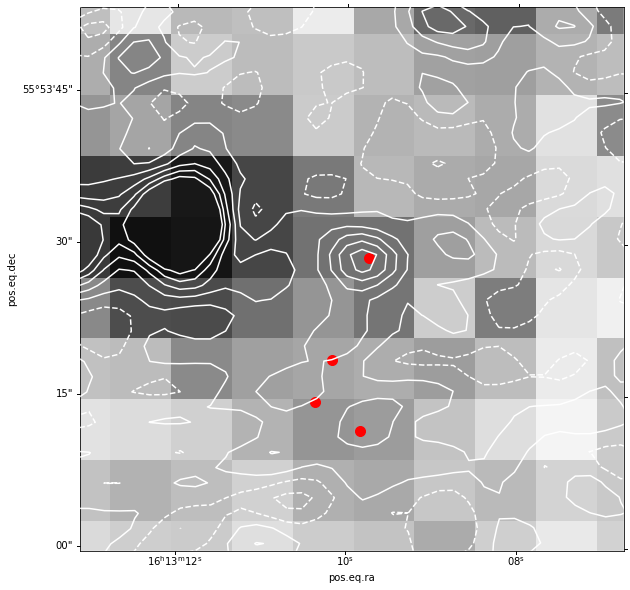

coords: ra:243.33327495005702  54.2685510594993
contours are at [-1.47783458e-04 -3.61604597e-05  7.54625383e-05  1.87085536e-04
  2.98708534e-04  4.10331532e-04  5.21954530e-04]
plotting 6 sources


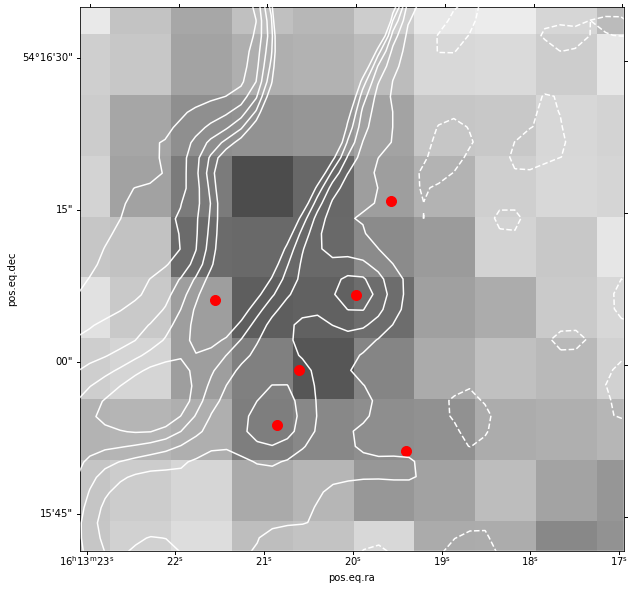

coords: ra:243.40897048205701  53.9121788004993
contours are at [-4.70224778e-05 -2.08849926e-05  5.25249252e-06  3.13899777e-05
  5.75274628e-05  8.36649479e-05  1.09802433e-04]
plotting 8 sources


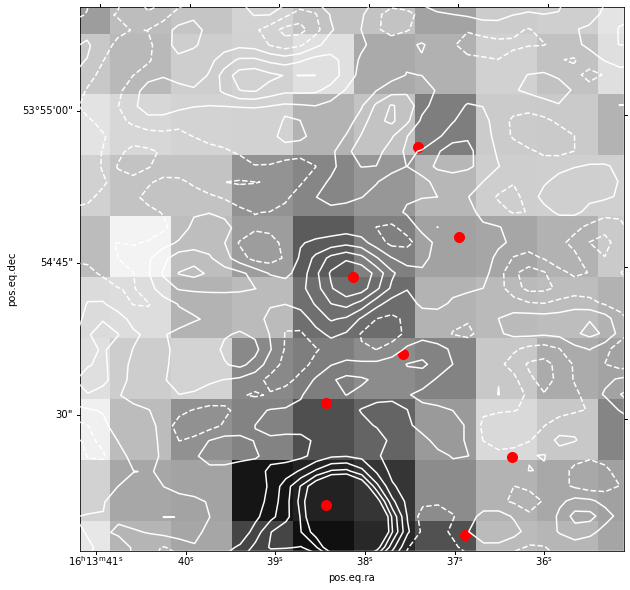

coords: ra:243.42232890205702  53.9847057164993
contours are at [-5.08630356e-05 -2.40853328e-05  2.69236990e-06  2.94700726e-05
  5.62477754e-05  8.30254781e-05  1.09803181e-04]
plotting 3 sources


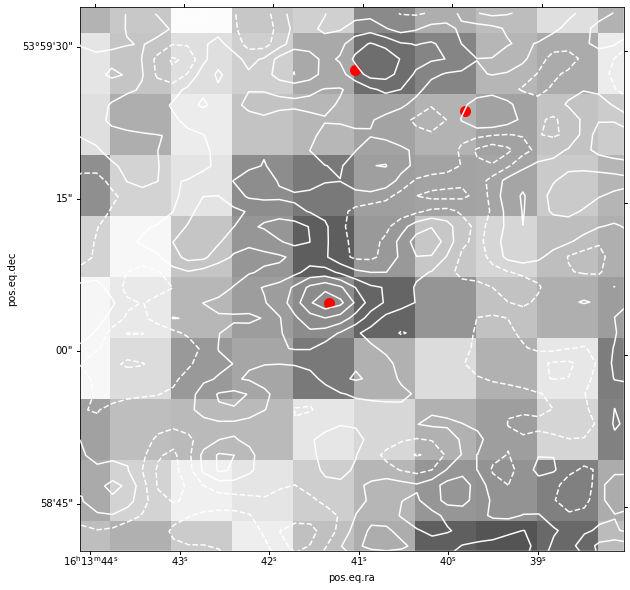

coords: ra:243.47237698805702  54.1145179504993
contours are at [-5.87567936e-05 -2.13856012e-05  1.59855911e-05  5.33567835e-05
  9.07279758e-05  1.28099168e-04  1.65470361e-04]
plotting 10 sources


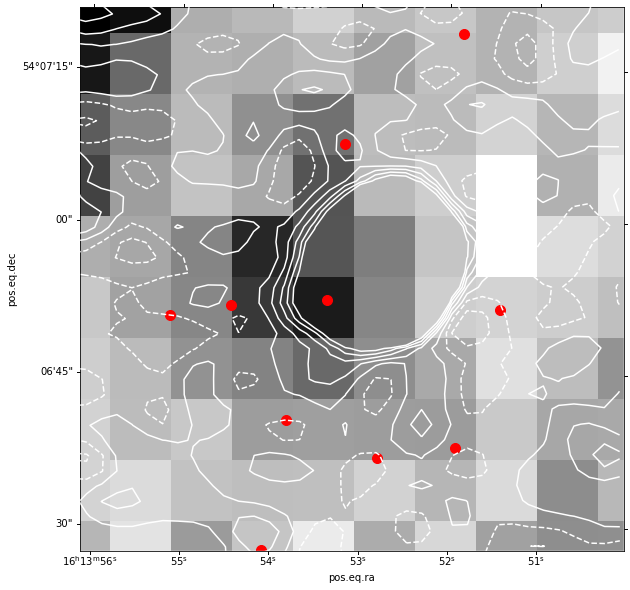

coords: ra:243.608372261057  55.5323986864993
contours are at [-7.30072041e-05 -2.95167962e-05  1.39736118e-05  5.74640197e-05
  1.00954428e-04  1.44444836e-04  1.87935244e-04]
plotting 5 sources


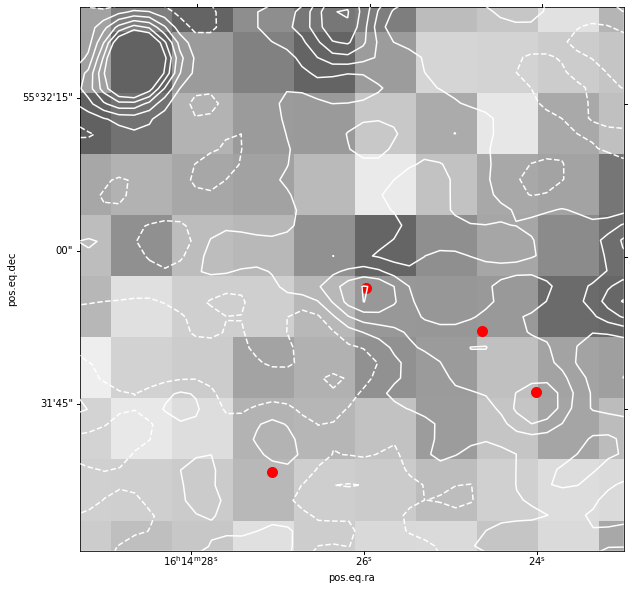

coords: ra:243.73264210705702  53.4721964984993
contours are at [-7.11161874e-05 -3.26731760e-05  5.76983544e-06  4.42128468e-05
  8.26558582e-05  1.21098870e-04  1.59541881e-04]
plotting 2 sources


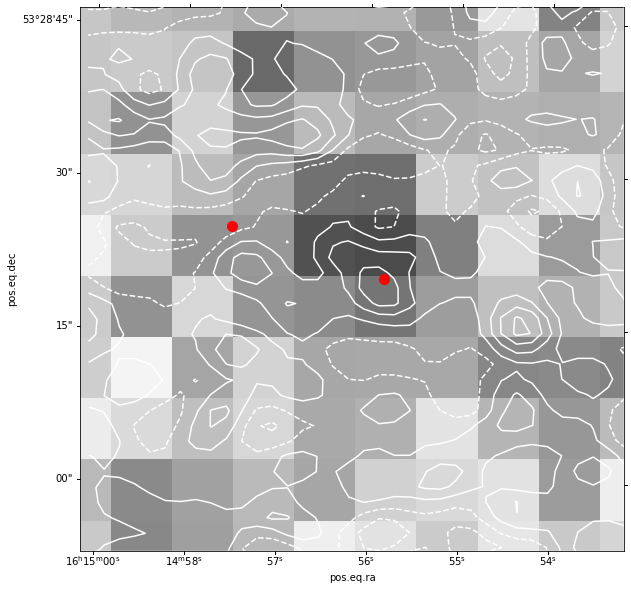

coords: ra:243.818833598057  54.6990943154993
contours are at [-5.25350012e-05 -1.98291772e-05  1.28766468e-05  4.55824708e-05
  7.82882948e-05  1.10994119e-04  1.43699943e-04]
plotting 5 sources


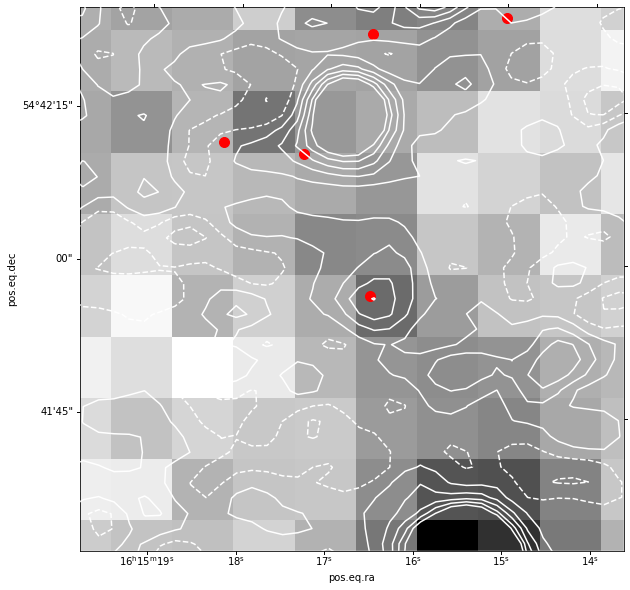

coords: ra:243.823934966057  54.5602460884993
contours are at [-5.18589329e-05 -2.02836538e-05  1.12916253e-05  4.28669043e-05
  7.44421834e-05  1.06017462e-04  1.37592742e-04]
plotting 6 sources


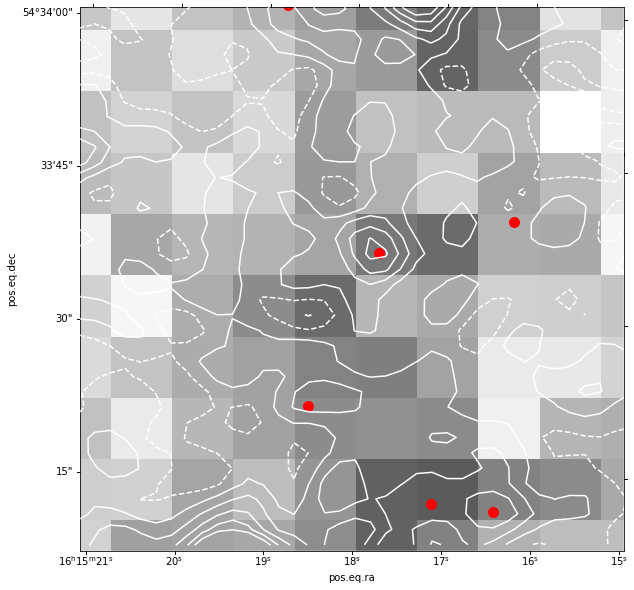

coords: ra:243.830100086057  54.4508729244993
contours are at [-5.80596200e-05 -2.63069268e-05  5.44576643e-06  3.71984597e-05
  6.89511529e-05  1.00703846e-04  1.32456539e-04]
plotting 8 sources


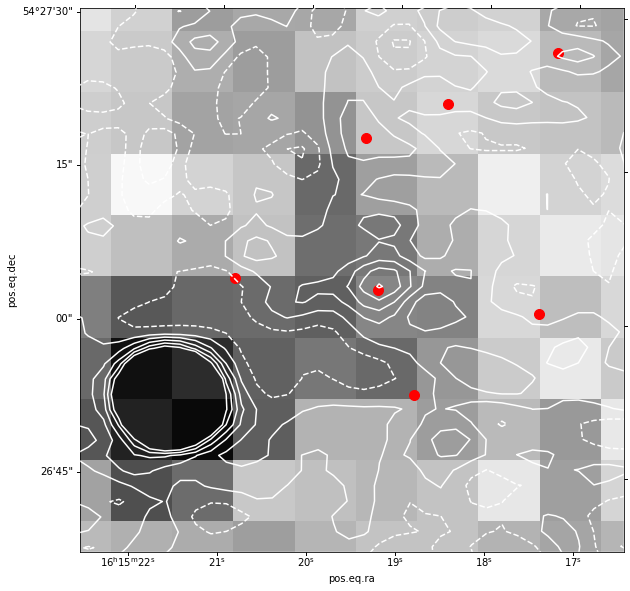

coords: ra:243.83013304105702  54.7482942514993
contours are at [-5.73056954e-05 -2.53244196e-05  6.65685627e-06  3.86381321e-05
  7.06194080e-05  1.02600684e-04  1.34581960e-04]
plotting 4 sources


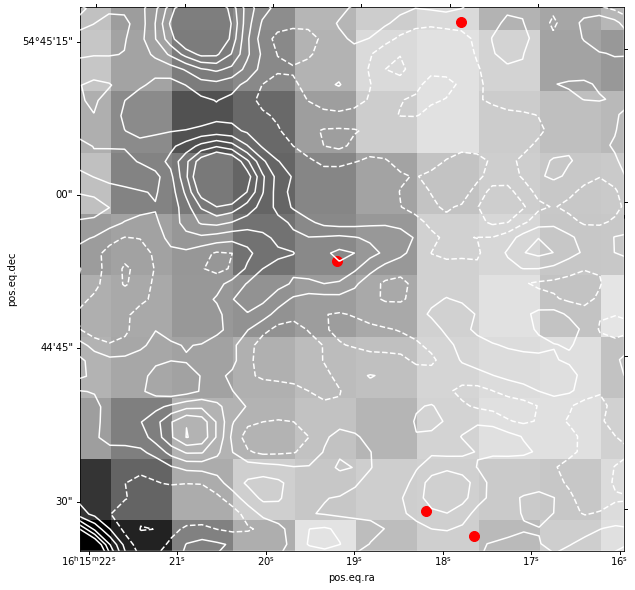

coords: ra:243.844561425057  54.4828085154993
contours are at [-5.75813549e-05 -2.13453074e-05  1.48907401e-05  5.11267876e-05
  8.73628351e-05  1.23598883e-04  1.59834930e-04]
plotting 10 sources


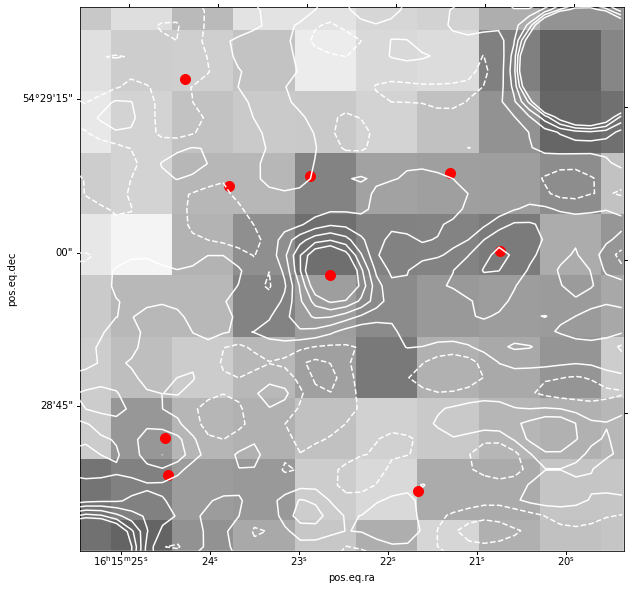

coords: ra:243.938185609057  54.8893558344993
contours are at [-5.03055771e-05 -1.91949956e-05  1.19155860e-05  4.30261675e-05
  7.41367491e-05  1.05247331e-04  1.36357912e-04]
plotting 2 sources


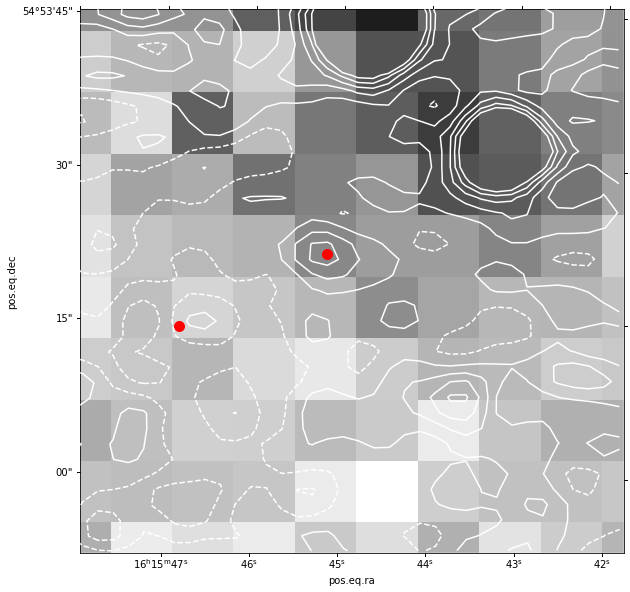

coords: ra:243.992931559057  53.7098333614993
contours are at [-5.99943209e-05 -1.96811172e-05  2.06320864e-05  6.09452900e-05
  1.01258494e-04  1.41571697e-04  1.81884901e-04]
plotting 4 sources


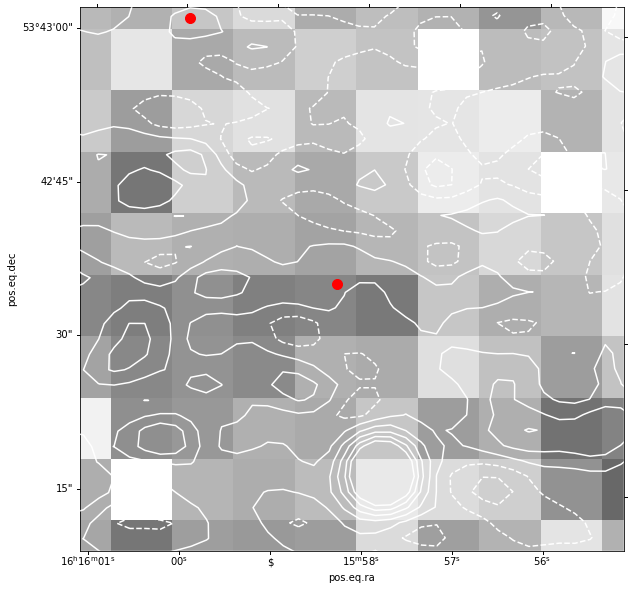

coords: ra:244.011079658057  55.2993777084993
contours are at [-6.17617620e-05 -2.69077314e-05  7.94629912e-06  4.28003297e-05
  7.76543602e-05  1.12508391e-04  1.47362421e-04]
plotting 2 sources


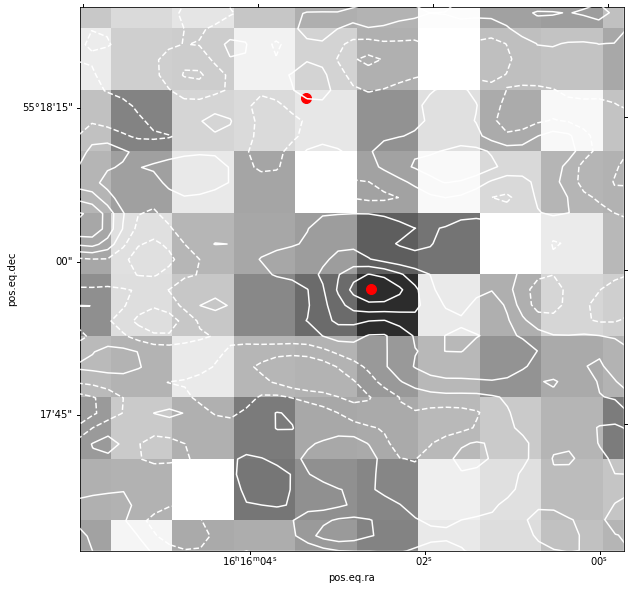

coords: ra:244.057468858057  53.909477679499304
contours are at [-5.40845467e-05 -1.96989640e-05  1.46866186e-05  4.90722012e-05
  8.34577839e-05  1.17843367e-04  1.52228949e-04]
plotting 3 sources


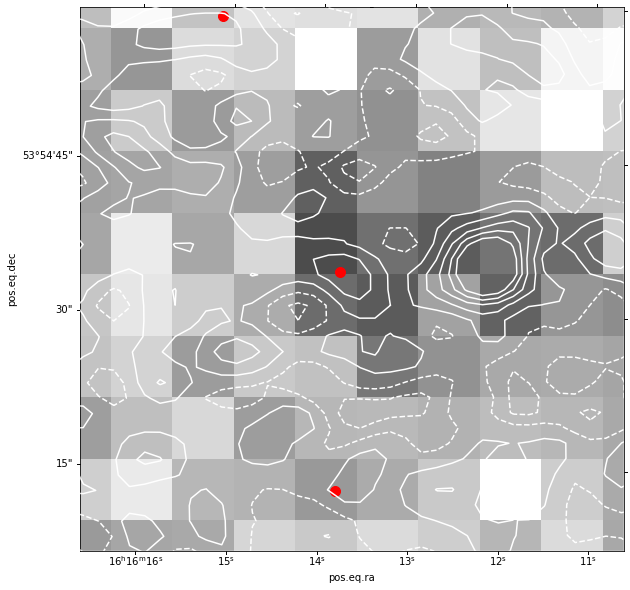

coords: ra:244.120487358057  54.5481195854993
contours are at [-4.29425752e-05 -1.68911920e-05  9.16019121e-06  3.52115744e-05
  6.12629576e-05  8.73143408e-05  1.13365724e-04]
plotting 3 sources


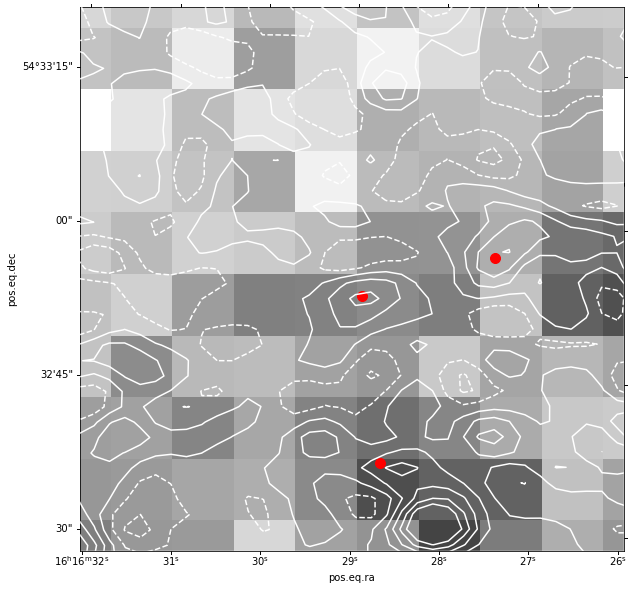

coords: ra:244.14870965803752  54.69865793881431
contours are at [-5.05909306e-05 -2.06040224e-05  9.38288577e-06  3.93697939e-05
  6.93567021e-05  9.93436103e-05  1.29330518e-04]
plotting 5 sources


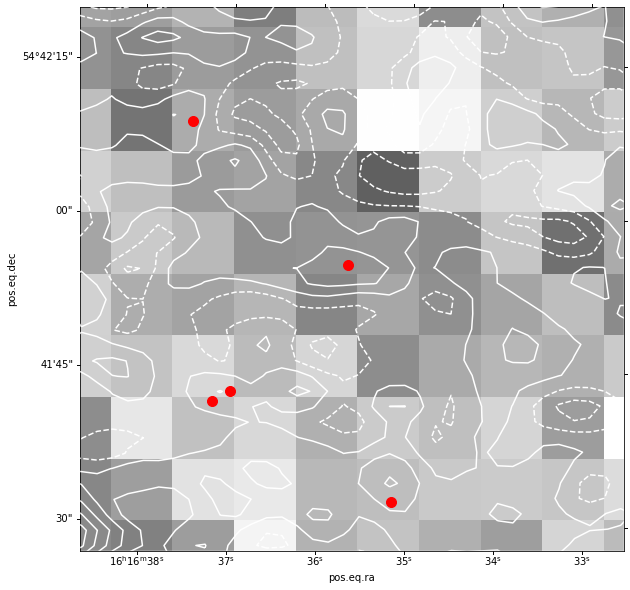

coords: ra:244.251767506057  54.6266180284993
contours are at [-5.24667572e-05 -1.99074726e-05  1.26518120e-05  4.52110965e-05
  7.77703811e-05  1.10329666e-04  1.42888950e-04]
plotting 6 sources


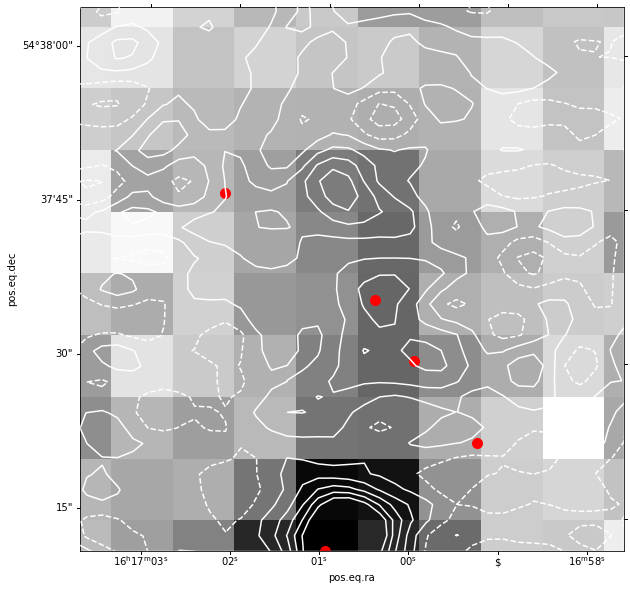

coords: ra:244.298589011057  54.8197159374993
contours are at [-4.34458009e-05 -1.38490887e-05  1.57476234e-05  4.53443356e-05
  7.49410477e-05  1.04537760e-04  1.34134472e-04]
plotting 4 sources


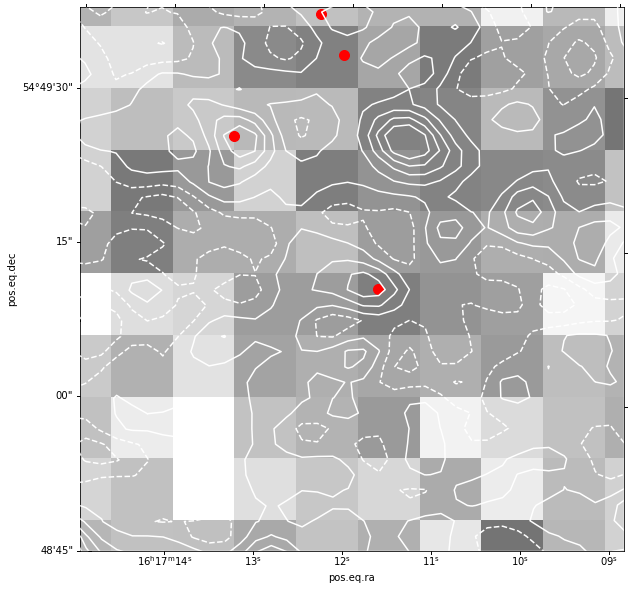

coords: ra:244.313519176057  54.6495533334993
contours are at [-6.36337688e-05 -3.45142355e-05 -5.39470228e-06  2.37248310e-05
  5.28443642e-05  8.19638974e-05  1.11083431e-04]
plotting 5 sources


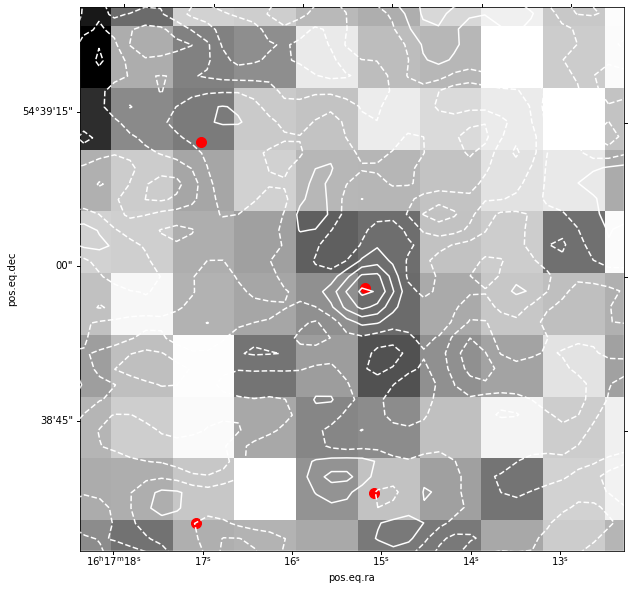

coords: ra:244.594279912057  54.327324139499304
contours are at [-6.60496769e-05 -2.72912762e-05  1.14671245e-05  5.02255253e-05
  8.89839260e-05  1.27742327e-04  1.66500727e-04]
plotting 2 sources


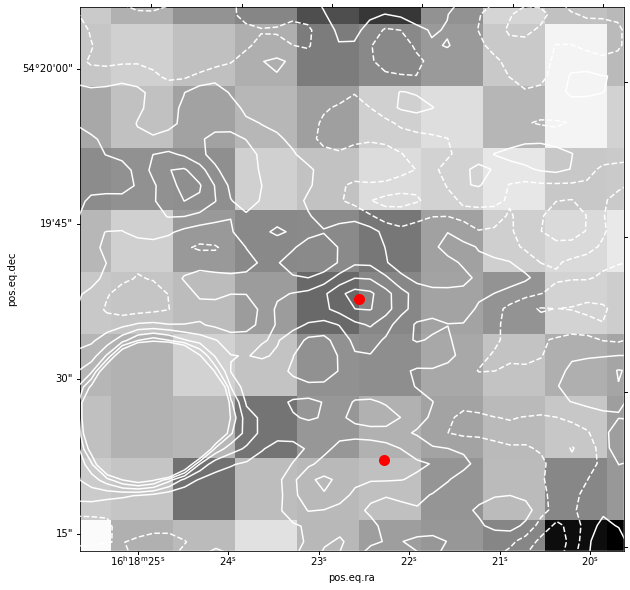

In [38]:
for n in range(len(ras)):
    print('coords: ra:{}  {}'.format(ras[n],decs[n]))
    image_plotting.plot_figure(im250,[joined_cigale_lofar_mstar],w_250,ras[n],decs[n],plot_params,contour_data=[radim_data,radim_wcs])



## TRy calculating the FIRC but using teh adjusted Ldust 

In [22]:
#calculate FIR luminosities and radio luminsoities

#get Ldust from SED fits for LOFAR sources
ldust_colnames = ['Ldust_best']
ldust_err_colnames = ['Ldust_sigma']
sed_fitters = ['magphys']
lofar_ldust,lofar_ldust_err = get_best_ldust(lofar_sed,ldust_colnames,ldust_err_colnames,sed_fitters)

mask_lofar_mass = lofar_sed['Mass_median']>10
ras_lofar = lofar_sed['RA'][mask_lofar_mass]
decs_lofar = lofar_sed['DEC'][mask_lofar_mass]
lofar_ldust = lofar_ldust[mask_lofar_mass]
lofar_ldust_err = lofar_ldust_err[mask_lofar_mass]

#add in the ldust measurments from CIGALE for HELP sources
mask_help_mass = joined_cigale_lofar_mstar['Mass_median']>10
help_ldust = joined_cigale_lofar_mstar['bayes.dust.luminosity'][mask_help_mass]
z = joined_cigale_lofar_mstar['bayes.universe.redshift'][mask_help_mass]
dist = cosmo.luminosity_distance(z).to(u.m).value
fdust_cig = help_ldust / (dist**2 * 4 * np.pi * (1+z) )

z = joined_cigale_lofar_mstar['redshift_2'][mask_help_mass]
dist = cosmo.luminosity_distance(z).to(u.m).value
ldust_photz = fdust_cig * (dist**2 * 4 * np.pi * (1+z) )
help_ldust_err = joined_cigale_lofar_mstar['bayes.dust.luminosity_err'][mask_help_mass]
ras_help = joined_cigale_lofar_mstar['ra'][mask_help_mass]
decs_help = joined_cigale_lofar_mstar['dec'][mask_help_mass]

#radio luminosities for the LOFAR sources
radio_flux = lofar_sed['Peak_flux'][mask_lofar_mass]
radio_flux_err = lofar_sed['E_Peak_flux'][mask_lofar_mass]

redshift = lofar_sed['Z_BEST'][mask_lofar_mass]
mask = redshift<=0
redshift[mask] = 0.001

dist = cosmo.luminosity_distance(redshift).to(u.m).value

alpha=-0.8

lum_rad_lofar = radio_flux*4*np.pi*dist**2 * 1E-26 / (1+redshift)**(1+alpha)
#mask out nan luminosities caused by radio sources with no redshift
mask = (~np.isnan(redshift)) & (~np.isnan(lofar_ldust))
lum_rad_lofar = lum_rad_lofar[mask]
lofar_ldust = lofar_ldust[mask]
ras_lofar = ras_lofar[mask]
decs_lofar = decs_lofar[mask]

#radio luminosties for the HELP sources
redshift_help = joined_cigale_lofar_mstar['bayes.universe.redshift'][mask_help_mass]
mask = redshift_help<=0
redshift_help[mask] = 0.001

dist = cosmo.luminosity_distance(redshift_help).to(u.m).value

alpha=-0.8

lum_rad_upper = rad_upper_lims*4*np.pi*dist**2 * 1E-26 / (1+redshift_help)**(1+alpha)


#create the joint LOFAR, HELP radio luminosity array
lum_rad = np.append(lum_rad_lofar.data.data,lum_rad_upper)
#convert the radio luminosities to watts from Janskys
#lum_rad = lum_rad/1E26

#create a joint ldust array
ldust = np.append(lofar_ldust,help_ldust)
ldust_err = np.append(lofar_ldust_err,help_ldust_err)

#set flags for detection in the radio map

#all the lum_rad_lofar sources are detected and all the HELP sources are not detected
det_radio = np.append(np.ones(len(lum_rad_lofar)),np.zeros(len(rad_upper_lims)))

ras_all = np.append(ras_lofar.data.data,ras_help)
decs_all = np.append(decs_lofar.data.data,decs_help)
redshift_all = np.append(redshift.data.data,redshift_help)

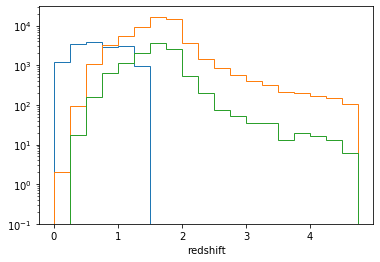

In [23]:
lofar_coords = SkyCoord(ra=ras_lofar*u.degree,dec=decs_lofar*u.degree)
help_coords = SkyCoord(ra=ras_help,dec=decs_help)

idx,d2d,_ = help_coords.match_to_catalog_sky(lofar_coords)

mask = d2d.value*3600<18
bins = np.arange(0,5,0.25)

plt.hist(redshift,bins=bins,log=True,histtype='step',label='LOFAR')
plt.hist(redshift_help,bins=bins,log=True,histtype='step',label='HELP')
plt.hist(redshift_help[mask],bins=bins,log=True,histtype='step',label='HELP matched')
plt.xlabel('redshift')
plt.legend
plt.show()

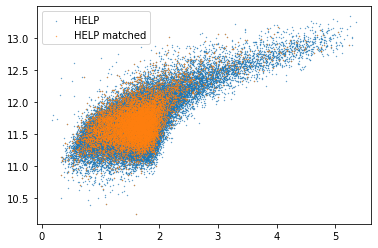

In [24]:
x = redshift_help
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP')
x = redshift_help[mask]
y = np.log10(help_ldust[mask]/3.8E26)
plt.scatter(x,y,s=0.1,label='HELP matched')
plt.legend()
plt.show()

measured median from the detections is: 1.5000168761623431
measured median using survival analysis is: 2.0069980425196157


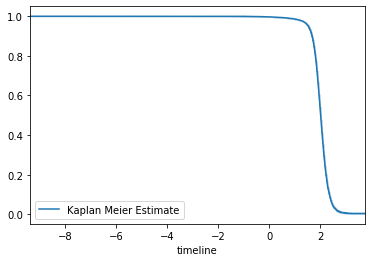

median q = -24.572785554097194


In [25]:
q = np.log10(ldust/3.75E12) - np.log10(lum_rad)
mask = ~np.isinf(q)
const = np.max(q)
#q = const - q
#q_lim = const - q_lim

data = q[mask]
#data[flag_detected] = q_lim[flag_detected]
det = det_radio[mask]
print('measured median from the detections is: {}'.format(np.median(data)))

kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(data, det,label='Kaplan Meier Estimate')

## Create an estimate
print('measured median using survival analysis is: {}'.format(kmf.median_))
kmf.plot()
plt.show()

print('median q = {}'.format(kmf.median_-np.log10(3.8E26)))



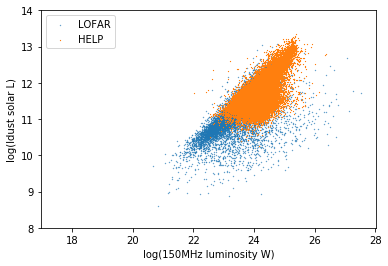

In [26]:
y = np.log10(lofar_ldust/3.8E26)
x = np.log10(lum_rad_lofar)
plt.scatter(x,y,s=0.1,label='LOFAR')

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='HELP')

plt.xlabel('log(150MHz luminosity W)')
plt.ylabel('log(ldust solar L)')
plt.ylim(8.0,14)
plt.legend()
plt.show()

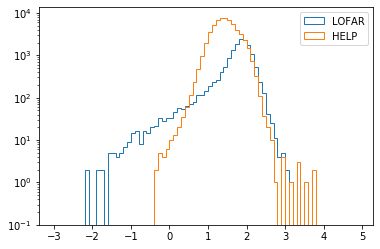

In [27]:
bins = np.arange(-3,5,0.1)
q_lofar = np.log10(lofar_ldust/3.75E12) - np.log10(lum_rad_lofar)
plt.hist(q_lofar,log=True,label='LOFAR',bins=bins,histtype='step')

q_help = np.log10(help_ldust/3.75E12) - np.log10(lum_rad_upper)
plt.hist(q_help,log=True,label='HELP',bins=bins,histtype='step')
plt.legend()
plt.show()

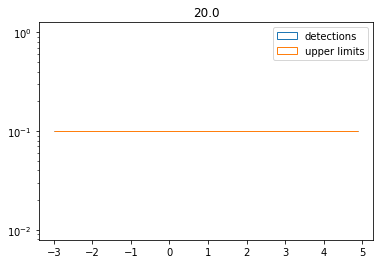

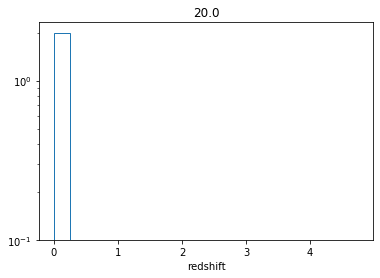

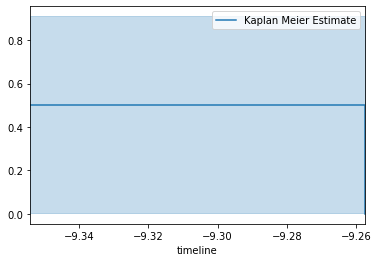

measured median using survival analysis is: -9.354165068050788


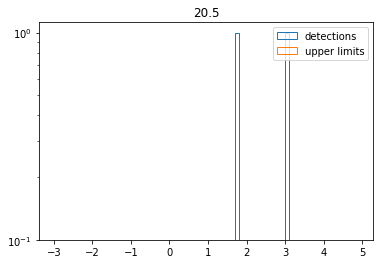

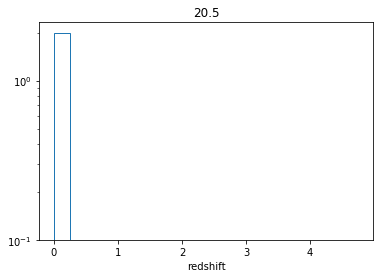

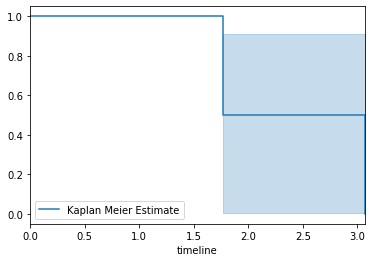

measured median using survival analysis is: 1.7720671394891774


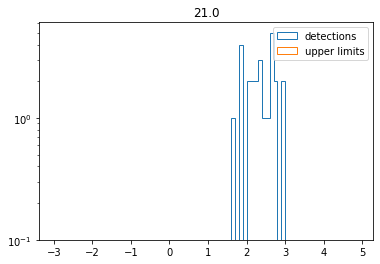

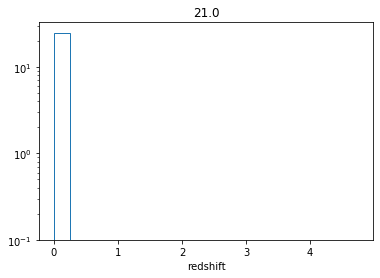

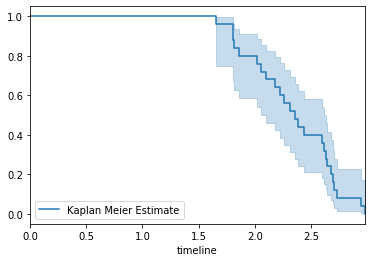

measured median using survival analysis is: 2.357712051933138


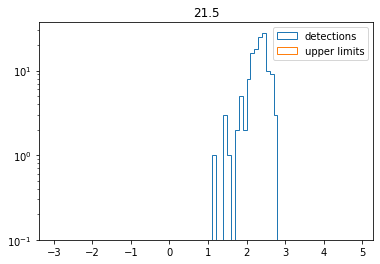

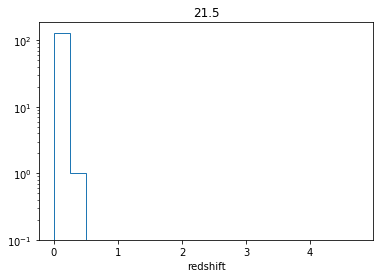

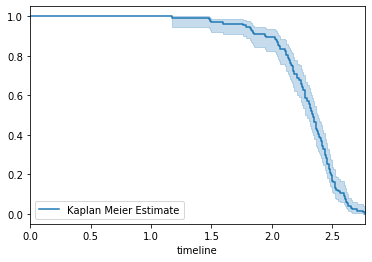

measured median using survival analysis is: 2.336291753377939


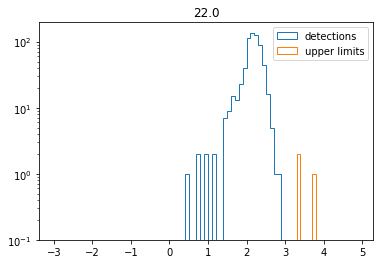

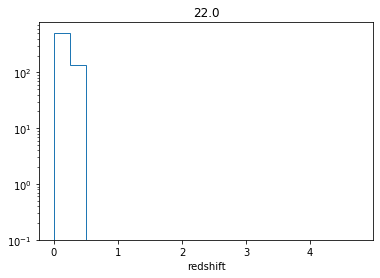

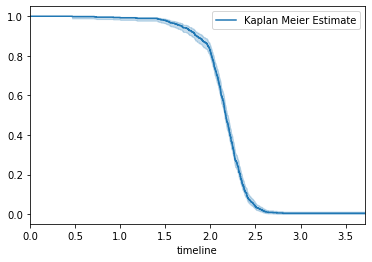

measured median using survival analysis is: 2.169947604341541


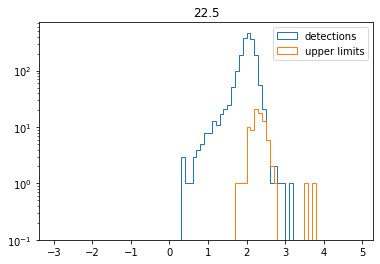

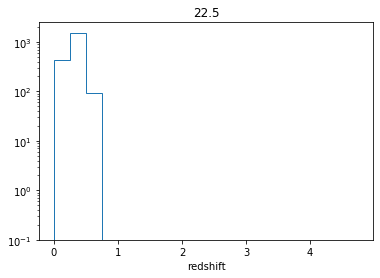

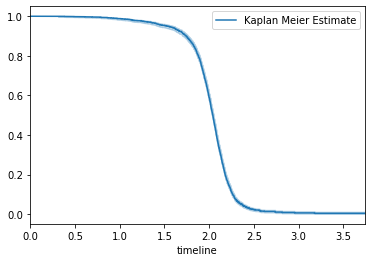

measured median using survival analysis is: 2.0402043472645595


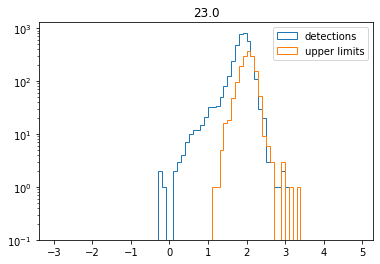

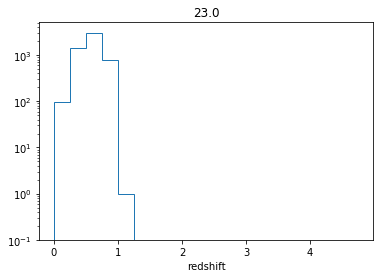

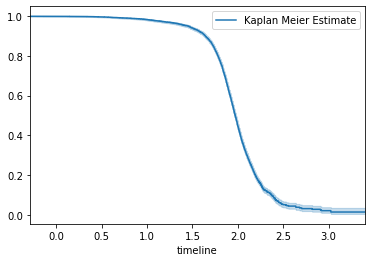

measured median using survival analysis is: 1.9703618385188975


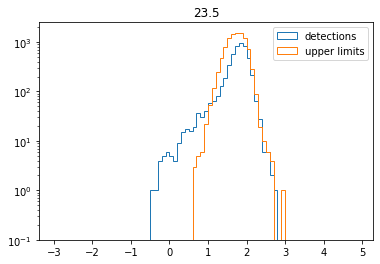

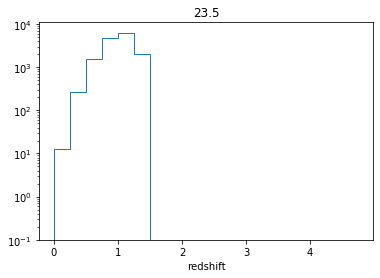

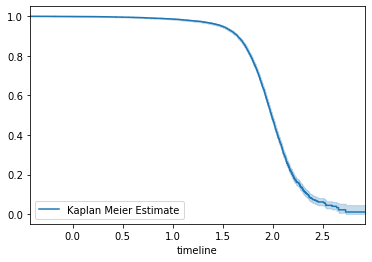

measured median using survival analysis is: 1.98865907552009


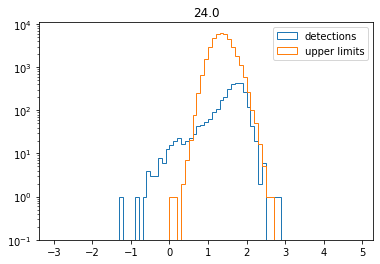

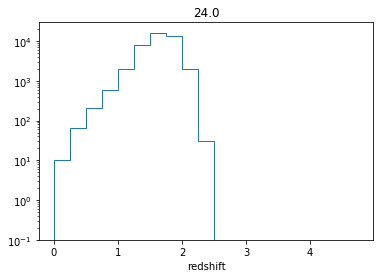

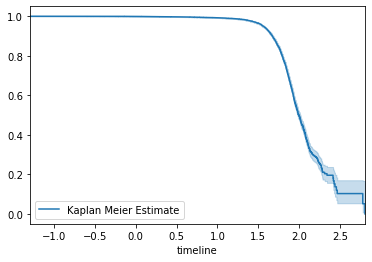

measured median using survival analysis is: 1.9968315387751474


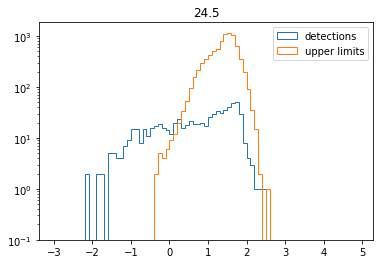

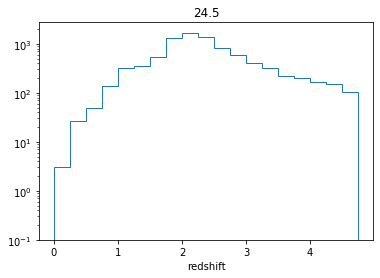

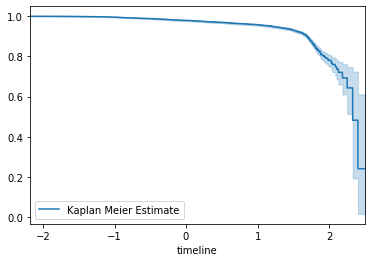

measured median using survival analysis is: 2.328691608845478


In [30]:
bins_lum = np.arange(20,25,0.5)

test = np.digitize(np.log10(lum_rad),bins=bins_lum)
nums,counts = np.unique(test,return_counts=True)

ras_binned = []
decs_binned = []
redshift_binned = []
mean_q = []
for n,num in enumerate(nums):
    mask = (test==num) #& (redshift_all<np.max(redshift))
    q_vals = data[mask]
    q_det = det[mask]
    q_lims = data[mask][~det[mask].astype(bool)]
    
    ras_binned.append(ras_all[mask])
    decs_binned.append(decs_all[mask])
    redshift_binned.append(redshift_all[mask])
    
    bins = np.arange(-3,5,0.1)
    plt.hist(q_vals[det[mask].astype(bool)],log=True,label='detections',bins=bins,histtype='step')
    plt.hist(q_lims,log=True,label='upper limits',bins=bins,histtype='step')
    plt.title('{}'.format(bins_lum[n]))
    plt.legend()
    plt.show()
    
    plt.hist(redshift_all[mask],bins=np.arange(0,5,0.25),log=True,histtype='step')
    plt.xlabel('redshift')
    plt.title('{}'.format(bins_lum[n]))
    plt.show()
    
    
    kmf = KaplanMeierFitter()
    kmf.fit(q_vals, q_det,label='Kaplan Meier Estimate')
    kmf.plot()
    plt.show()
    print('measured median using survival analysis is: {}'.format(kmf.median_))
    
    mean_q.append(kmf.median_)

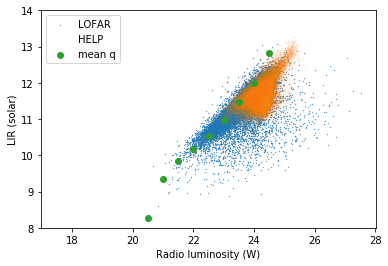

In [31]:
y = np.log10(lofar_ldust/3.8E26)
x = np.log10(lum_rad_lofar)
plt.scatter(x,y,s=0.1,label='LOFAR')

x = np.log10(lum_rad_upper)
y = np.log10(help_ldust/3.8E26)
plt.scatter(x,y,s=0.1,marker='^',label='HELP',alpha=0.1)

x = np.arange(20,25,0.5)[nums-1]
y = mean_q + x + np.log10(3.75E12) - np.log10(3.8E26)
plt.scatter(x,y,label='mean q')

plt.ylim(8.0,14)
plt.xlabel('Radio luminosity (W)')
plt.ylabel('LIR (solar)')
plt.legend()
plt.show()

In [146]:
mean_q

[-9.354165068050788,
 1.7720671394891774,
 2.357712051933138,
 2.336291753377939,
 2.169947604341541,
 2.0402043472645595,
 1.9703618385188975,
 1.98865907552009,
 1.8587039560274512,
 1.1826933611923351]